# Cluster reads by per-read m6A binary accessibility 

Goal: at selected gene TSSes, build a per-read binary accessibility map (m6A modified = 1, unmodified = 0) within a fixed window, then k-means cluster reads to separate **narrowly open** vs **widely open** open-region geometries.

Genes: **ENO1** (low PI, elongating) and **ZCWPW1** (high PI, paused). Half-windows tried: **250 bp** and **500 bp**, matching the `TSS_ACCESS_WINDOW` values used by `m6a_pausing_quartiles`.

Per-read m6A extraction is done in R, calling `footprintR::readModBam(..., level="quickread")` + the same `getBinarizedModificationsLongTable` thresholding (`mod_prob > 0.9 -> 1`) used in `code/PolII_footprints_code/m6a_pausing_quartiles/run_m6a_pausing_quartiles.R`. K-means + visualization happen in Python.

### NOTE: for m6a, there is not filter for read length. It extracts m6A calls for every read whose whose BAM alignment touches the window. For each read, only the positions inside its alignment and inside the window are called for modification probability if it has a m6A call or stays as 0. Positions outside the alignment is NA and are not used for clustering

### 1. Setup. Sample, gene list, window sizes, paths.

In [1]:
import subprocess
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

GENES = ["ENO1", "ZCWPW1"]
HALF_WINDOWS = [250, 500]      # bp; matches TSS_ACCESS_WINDOW choices in m6a_pausing_quartiles
MOD_PROB_THRESHOLD = 0.9       # used in Python only, for binarizing the bottom-panel rectangles

METATABLE_CSV = Path(
    "/project/spott/1_Shared_projects/LCL_Fiber_seq/Data/"
    "LCL_sample_metatable_merged_samples_31samples.csv"
)
PAUSING_TSV = Path(
    "/project/spott/cshan/fiber-seq/results/PolII/annotations/"
    "pausing_index_principal_with_CAGE_TSS_all_genes.tsv"
)
QUARTILES_DIR = Path(
    "/project/spott/cshan/fiber-seq/results/PolII/m6a_pausing_quartiles/"
    "AL10_bc2178_19130_1kb_bin10_modthresh0.9_all/tables"
)
OUT_ROOT = Path(
    "/project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_m6A_binary/"
    "31samples_pooled"
)
OUT_ROOT.mkdir(parents=True, exist_ok=True)
R_SCRIPT_PATH = OUT_ROOT / "extract_binary_matrix.R"

assert METATABLE_CSV.exists(), f"missing metatable: {METATABLE_CSV}"
assert PAUSING_TSV.exists(), f"missing pausing table: {PAUSING_TSV}"

meta_df = pd.read_csv(METATABLE_CSV)
print(f"Metatable: {METATABLE_CSV.name}  ({len(meta_df)} samples)")
print(meta_df[["sample_name", "cell_line"]].head().to_string(index=False))
print(f"...")
print(f"Genes: {GENES}")
print(f"Half-windows: {HALF_WINDOWS} bp")
print(f"Output dir: {OUT_ROOT}")

Metatable: LCL_sample_metatable_merged_samples_31samples.csv  (31 samples)
      sample_name cell_line
 AL6_bc2162_19093   NA19093
 AL8_bc2170_19151   NA19151
AL10_bc2178_19130   NA19130
AL16_bc2114_18508   NA18508
AL18_bc2130_18504   NA18504
...
Genes: ['ENO1', 'ZCWPW1']
Half-windows: [250, 500] bp
Output dir: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_m6A_binary/31samples_pooled


### 2. Locate ENO1 and ZCWPW1.

Pull TSS anchors from the same pausing-index annotation table used by `run_m6a_pausing_quartiles.R`. CAGE TSS preferred; falls back to GENCODE TSS.

In [2]:
paus = pd.read_csv(PAUSING_TSV, sep="\t")
gene_info = (
    paus[paus["gene_name"].isin(GENES)]
    [["gene_name", "gene_id", "chrom", "strand", "tss", "cage_tss", "PI"]]
    .drop_duplicates(subset=["gene_name"], keep="first")
    .reset_index(drop=True)
)
gene_info["tss_anchor"] = gene_info["cage_tss"].fillna(gene_info["tss"]).astype(np.int64)
gene_info["tss_source"] = np.where(gene_info["cage_tss"].notna(), "CAGE", "GENCODE")
print(gene_info.to_string(index=False))

gene_name            gene_id chrom strand       tss    cage_tss        PI  tss_anchor tss_source
     ENO1 ENSG00000074800.17  chr1      -   8878731   8878731.0  0.045216     8878731       CAGE
   ZCWPW1 ENSG00000078487.19  chr7      - 100335963 100335963.0 27.058752   100335963       CAGE


### 3. R extraction script (mirrors `m6a_pausing_quartiles` env-var pattern).

The next cell writes two files to `OUT_ROOT`:

- `extract_binary_matrix.R` - reads all config from `Sys.getenv()`. Reads the **sample metatable** (`METATABLE_CSV`), then for each (gene, half_window) combo loops over every sample's BAM:
  1. `footprintR::readModBam(..., level="quickread")` per sample - per-read `mod_prob` for that sample at the TSS window.
  2. Strand-orient positions to TSS-relative `-half_window ... +half_window`. Collapse same-position strand duplicates with `pmax`.
  3. **No spanning filter** - every read whose BAM alignment hits the window is kept. Positions outside a read's alignment are `NA`; positions inside default to `0` and pick up the actual `mod_prob` where footprintR has a call.
  4. Prefix `read_id` with `{sample_name}-` so reads from different samples don't collide.
  5. Row-bind across all samples, write `{gene}_w{hw}_modprob.tsv.gz` with values in `[0,1] union {NA}` (empty cells = NA).
- `extract_binary_matrix.sh` - SLURM wrapper. `#SBATCH` headers, `module load R`, exports env vars including the metatable path. Designed for `sbatch`:
  ```bash
  sbatch /path/to/extract_binary_matrix.sh
  ```

for selected genes and selected TSS-centered windows, it pools reads from all samples and builds a read-by-position matrix of m6A modification probability. Each row is one read, each column is one TSS-relative base position, and each value is either NA, 0, or a modification probability. Later, this matrix can be thresholded into binary accessibility, for example mod_prob > 0.9 = accessible/m6A-marked. The output is one gzipped TSV per gene per window.

In [ ]:
R_SCRIPT = r'''#!/usr/bin/env Rscript
# Per-read m6A probability matrices, pooled across all samples in the metatable.
# Loops every sample's BAM for each (gene, half_window) combo.
# Output cells: mod_prob in [0,1] (covered A), 0 (covered non-A / no call), NA (uncovered).

suppressPackageStartupMessages({
  library(data.table)
  library(GenomicRanges)
  library(IRanges)
  library(GenomeInfoDb)
  library(BiocParallel)
  library(Rsamtools)
})

source('/project/spott/cshan/fiber-seq/code/footprintR_modbam_code/modbam_footprintR_functions.R')
suppressPackageStartupMessages(library(GenomicAlignments))

get_env_chr <- function(name, default = '') {
  v <- trimws(Sys.getenv(name, unset = default))
  if (!nzchar(v)) default else v
}
get_env_int_list <- function(name, default) {
  v <- get_env_chr(name, default)
  as.integer(strsplit(v, ',', fixed = TRUE)[[1]])
}
get_env_chr_list <- function(name, default) {
  v <- get_env_chr(name, default)
  trimws(strsplit(v, ',', fixed = TRUE)[[1]])
}

# sample table
metatable_csv <- get_env_chr('METATABLE_CSV')
# pausing table
pausing_path  <- get_env_chr('PAUSING_PATH')
out_root      <- get_env_chr('OUT_ROOT')
genes         <- get_env_chr_list('GENES', 'ENO1,ZCWPW1')
half_windows  <- get_env_int_list('HALF_WINDOWS', '250,500')

stopifnot(nzchar(metatable_csv), nzchar(pausing_path), nzchar(out_root))
dir.create(out_root, recursive = TRUE, showWarnings = FALSE)

meta <- fread(metatable_csv)
stopifnot(all(c('sample_name', 'bam_file') %in% names(meta)))
sample_names <- meta$sample_name
bam_paths    <- meta$bam_file

message('Metatable    : ', metatable_csv, '  (', length(sample_names), ' samples)')
message('Pausing table: ', pausing_path)
message('Out root     : ', out_root)
message('Genes        : ', paste(genes, collapse = ', '))
message('Half-windows : ', paste(half_windows, collapse = ', '))

paus <- fread(pausing_path)
paus <- paus[gene_name %in% genes]
# remove version suffix from gene_id for deduplication, since some genes have multiple entries with different versions but same gene_name; keep the one with highest PI
paus[, gene_id_base := sub('\\.[0-9]+$', '', gene_id)]
paus <- paus[order(-PI)][!duplicated(gene_id_base)]
paus[, cage_tss := suppressWarnings(as.integer(cage_tss))]
paus[, tss      := suppressWarnings(as.integer(tss))]
paus[, tss_anchor := fifelse(!is.na(cage_tss), cage_tss, tss)]
paus[, tss_source := fifelse(!is.na(cage_tss), 'CAGE', 'GENCODE')]
gene_info <- paus[, .(gene_name, gene_id_base, chrom, strand, tss_anchor, tss_source, PI)]
print(gene_info)

# All sample BAMs are expected to share the same seqinfo; read from the first
bam_seqinfo <- read_bam_seqinfo(bam_paths[1])

# check if the BAMs have the expected seqnames; if not, try stripping "chr" prefix and check again
process_sample_at_window <- function(sample_name, bam_path, g, hw, prom) {
  if (!file.exists(bam_path) || !file.exists(paste0(bam_path, '.bai'))) {
    message('  [skip] ', sample_name, ': BAM or index missing')
    return(NULL)
  }
  bamfiles <- setNames(bam_path, sample_name)

# creates a SummarizedExperiment with one GRanges row per covered position and one column per sample,
# where the assay "mod_prob" contains the m6A modification probability for that position in that sample's reads; 
# also includes metadata columns for the GRanges rows, including "rel_pos" which is the TSS-relative position

## tryCatch() prevents the whole script from crashing if one sample fails. If there is an error, it prints a warning and returns NULL
  se <- tryCatch(
    footprintR::readModBam(
      bamfiles = bamfiles, regions = prom,
      modbase  = setNames('a', sample_name), level = 'quickread',
      seqinfo  = bam_seqinfo, trim = TRUE,
      BPPARAM  = BiocParallel::SerialParam(), verbose = FALSE
    ),
    error = function(e) { message('  [warn] ', sample_name, ' readModBam: ', conditionMessage(e)); NULL }
  )
  if (is.null(se)) return(NULL)

  # extract the mod_prob assay for this sample, convert to matrix, and add rownames; if empty, return NULL
  prob_mat <- as(SummarizedExperiment::assay(se, 'mod_prob')[[sample_name]], 'matrix')
  # assgin genomic position as row names, in the format "chr:pos"
  if (nrow(prob_mat) == 0L) return(NULL)
  # takes the GRanges rownames, splits by ":", and extracts the second position as integer
  
  positions <- as.integer(sapply(base::strsplit(rownames(prob_mat), ':', fixed = TRUE), `[`, 2))
  rel_pos   <- if (g$strand == '+') positions - g$tss_anchor else g$tss_anchor - positions
  
  ga <- tryCatch(
    
    readGAlignments(bam_path, param = ScanBamParam(which = prom, what = 'qname')),
    error = function(e) { message('  [warn] ', sample_name, ' readGAlignments: ', conditionMessage(e)); GAlignments() }
  )
  if (length(ga) == 0L) return(NULL)
  align_dt <- data.table(qname = mcols(ga)$qname,
                         ref_start = start(ga), ref_end = end(ga))
  align_dt <- align_dt[, .(ref_start = min(ref_start), ref_end = max(ref_end)), by = qname]

  read_ids <- align_dt$qname
  all_rel  <- seq(-hw, hw)
  # initialize a read-by-position matrix with NA; rows are named by read_id, columns are named by rel_pos; values will be filled in the next steps
  full_mat <- matrix(NA_real_, nrow = length(read_ids), ncol = length(all_rel),
                     dimnames = list(read_ids, as.character(all_rel)))

  for (j in seq_along(read_ids)) {
  # for each read, get its aligned reference start and end; then, based on the gene strand, calculate the TSS-relative positions covered by this read; 
  # if any of those positions fall within the window [-hw, hw], set the corresponding columns in full_mat to 0 (indicating covered but no m6A call)
    rs <- align_dt$ref_start[j]; re <- align_dt$ref_end[j]
    if (g$strand == '+') {
      rel_lo <- max(rs - g$tss_anchor, -hw); rel_hi <- min(re - g$tss_anchor,  hw)
    } else {
      rel_lo <- max(g$tss_anchor - re, -hw); rel_hi <- min(g$tss_anchor - rs,  hw)
    }
    if (rel_lo <= rel_hi) {
      full_mat[j, (rel_lo + hw + 1L):(rel_hi + hw + 1L)] <- 0
    }
  }

  se_to_row <- match(colnames(prob_mat), read_ids)
  if (sum(!is.na(se_to_row)) == 0L && length(read_ids)) {
    stripped <- sub(paste0('^', sample_name, '-'), '', colnames(prob_mat))
    se_to_row <- match(stripped, read_ids)
  }

  for (i in seq_along(rel_pos)) {
    rp <- rel_pos[i]
    if (is.na(rp) || rp < -hw || rp > hw) next
    col_idx <- rp + hw + 1L
    # gets the mod_prob values for this position across all reads, identifies which reads have non-NA values (i.e. covered A positions), 
    # and updates the corresponding cells in full_mat with the max of the existing value and the mod_prob value; if there are no covered A positions at this rel_pos, it moves to the next iteration
    vals <- prob_mat[i, ]
    hit  <- which(!is.na(vals))
    if (!length(hit)) next
    # if no reads in the SummarizedExperiment match the read_ids in full_mat, then se_to_row will be all NA; 
    # in that case, try stripping the sample_name prefix and matching again; if still no matches, skip this position
    tgt <- se_to_row[hit]; ok <- !is.na(tgt)
    tgt <- tgt[ok]; v <- vals[hit][ok]
    if (!length(tgt)) next
    full_mat[tgt, col_idx] <- pmax(full_mat[tgt, col_idx], v, na.rm = TRUE)
  }

  rownames(full_mat) <- paste0(sample_name, '-', rownames(full_mat))
  full_mat
}

# prefix every read_id with sample_name to ensure uniqueness across samples; this also helps with debugging and downstream analysis by retaining sample identity in the read_id
extract_one <- function(g, hw) {
  out_tsv <- file.path(out_root, sprintf('%s_w%d_modprob.tsv.gz', g$gene_name, hw))
  message('\n=== ', g$gene_name, ' aw=', hw, ' (', length(sample_names), ' samples) ===')

  tss_gr <- GRanges(seqnames = g$chrom,
                    ranges = IRanges(start = g$tss_anchor, end = g$tss_anchor),
                    strand = g$strand)
  seqinfo(tss_gr) <- bam_seqinfo[g$chrom]
  prom <- trim(promoters(tss_gr, upstream = hw, downstream = hw + 1L))

  per_sample <- list()
  # loop through each sample, process the BAM for this gene and window, and store the resulting read-by-position matrix in a list; 
  # if a sample fails to process, it is skipped with a warning
  for (s_idx in seq_along(sample_names)) {
    sn <- sample_names[s_idx]
    fm <- process_sample_at_window(sn, bam_paths[s_idx], g, hw, prom)
    if (!is.null(fm)) {
      per_sample[[sn]] <- fm
      message('  ', sn, ': ', nrow(fm), ' reads')
    }
  }

  if (!length(per_sample)) {
    message('  no reads pooled; skipping write')
    return(invisible(NULL))
  }
  # If the sample produced a matrix, it stores that matrix in the per_sample list using the sample name as the list key. It also prints how many reads were extracted
  full_mat <- do.call(rbind, per_sample)
  n_reads <- nrow(full_mat)
  pct_cov <- 100 * rowSums(!is.na(full_mat)) / ncol(full_mat)
  v_nz    <- full_mat[!is.na(full_mat) & full_mat > 0]
  message('  pooled total reads: ', n_reads)
  if (length(v_nz)) {
    message('  nonzero mod_prob values: ', length(v_nz),
            ' (median ', round(median(v_nz), 3),
            ', max ',     round(max(v_nz), 3), ')')
  }
  message('  per-read coverage % (median / min / max): ',
          round(median(pct_cov), 1), ' / ',
          round(min(pct_cov), 1), ' / ',
          round(max(pct_cov), 1))

  out_dt <- cbind(data.table(read_id = rownames(full_mat)),
                  as.data.table(round(full_mat, 4)))
  fwrite(out_dt, file = out_tsv, sep = '\t', compress = 'gzip', na = '')
  message('  Wrote ', out_tsv, ' (', nrow(out_dt), ' reads x ', ncol(full_mat), ' positions)')
}


for (i in seq_len(nrow(gene_info))) {
  g <- as.list(gene_info[i])
  for (hw in half_windows) {
    extract_one(g, hw)
  }
}

message('\nAll done.')
'''

SH_SCRIPT = f'''#!/bin/bash
#SBATCH --job-name=cluster_m6a_pooled
#SBATCH --account=pi-spott
#SBATCH --partition=bigmem
#SBATCH --ntasks=1
#SBATCH --cpus-per-task=1
#SBATCH --mem=300G
#SBATCH --time=24:00:00
#SBATCH --output=/project/spott/cshan/fiber-seq/results/logs/cluster_m6a_pooled_%j.out
#SBATCH --error=/project/spott/cshan/fiber-seq/results/logs/cluster_m6a_pooled_%j.err

set -euo pipefail
module load R

export METATABLE_CSV={METATABLE_CSV}
export PAUSING_PATH={PAUSING_TSV}
export OUT_ROOT={OUT_ROOT}
export GENES={",".join(GENES)}
export HALF_WINDOWS={",".join(str(h) for h in HALF_WINDOWS)}

echo "Metatable: ${{METATABLE_CSV}}"
echo "Genes    : ${{GENES}}"
echo "Windows  : ${{HALF_WINDOWS}}"
echo "Output   : ${{OUT_ROOT}}"
echo "Started  : $(date)"

Rscript "${{OUT_ROOT}}/extract_binary_matrix.R"

echo "Finished : $(date)"
'''

R_SCRIPT_PATH.write_text(R_SCRIPT)
SH_SCRIPT_PATH = OUT_ROOT / "extract_binary_matrix.sh"
SH_SCRIPT_PATH.write_text(SH_SCRIPT)
SH_SCRIPT_PATH.chmod(0o755)

print(f"Wrote R script:   {R_SCRIPT_PATH}")
print(f"Wrote SH wrapper: {SH_SCRIPT_PATH}")

Wrote R script:   /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_m6A_binary/31samples_pooled/extract_binary_matrix.R
Wrote SH wrapper: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_m6A_binary/31samples_pooled/extract_binary_matrix.sh


### 5. Submit the R extraction as a SLURM job.

`sbatch` submits the job. The cell prints the job id; downstream cells (loading the TSVs) will only succeed once the job finishes. If the output TSVs already exist for all (gene, window) combos, the submission is skipped. Pass `force=True` to force a re-run.

In [12]:
force = False

modprob_paths = {
    (gene_name, hw): OUT_ROOT / f"{gene_name}_w{hw}_modprob.tsv.gz"
    for gene_name in GENES
    for hw in HALF_WINDOWS
}
already_done = all(p.exists() for p in modprob_paths.values())

if already_done and not force:
    print("All output TSVs already exist; skipping sbatch.")
    print("Set `force = True` above to re-run.")
else:
    print(f"Submitting: {SH_SCRIPT_PATH}")
    res = subprocess.run(
        ["sbatch", str(SH_SCRIPT_PATH)],
        capture_output=True, text=True,
    )
    print(res.stdout)
    if res.stderr:
        print("---- stderr ----")
        print(res.stderr)
    if res.returncode != 0:
        raise RuntimeError(f"sbatch failed (exit {res.returncode})")
    print("Submitted. Job is running in the background; re-run cell 6 once outputs appear.")

Submitting: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_m6A_binary/31samples_pooled/extract_binary_matrix.sh
Submitted batch job 49671676

---- stderr ----
sbatch: Verify job submission ...
sbatch: Using a shared partition ...
sbatch: Partition: bigmem
sbatch: QOS-Flag: bigmem
sbatch: Account: pi-spott
sbatch: Verification: ***PASSED***

Submitted. Job is running in the background; re-run cell 6 once outputs appear.


Inspect the output modbam table

In [2]:
modprob_paths = {
    (gene_name, hw): OUT_ROOT / f"{gene_name}_w{hw}_modprob.tsv.gz"
    for gene_name in GENES
    for hw in HALF_WINDOWS
}
print("Expected output TSVs:")
for (gene_name, hw), path in modprob_paths.items():
    print(f"  {gene_name} w{hw}: {path} {'(exists)' if path.exists() else '(MISSING)'}")

Expected output TSVs:
  ENO1 w250: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_m6A_binary/31samples_pooled/ENO1_w250_modprob.tsv.gz (exists)
  ENO1 w500: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_m6A_binary/31samples_pooled/ENO1_w500_modprob.tsv.gz (exists)
  ZCWPW1 w250: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_m6A_binary/31samples_pooled/ZCWPW1_w250_modprob.tsv.gz (exists)
  ZCWPW1 w500: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_m6A_binary/31samples_pooled/ZCWPW1_w500_modprob.tsv.gz (exists)


In [5]:
%%bash

less  /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_m6A_binary/31samples_pooled/ENO1_w250_modprob.tsv.gz | head

read_id	-250	-249	-248	-247	-246	-245	-244	-243	-242	-241	-240	-239	-238	-237	-236	-235	-234	-233	-232	-231	-230	-229	-228	-227	-226	-225	-224	-223	-222	-221	-220	-219	-218	-217	-216	-215	-214	-213	-212	-211	-210	-209	-208	-207	-206	-205	-204	-203	-202	-201	-200	-199	-198	-197	-196	-195	-194	-193	-192	-191	-190	-189	-188	-187	-186	-185	-184	-183	-182	-181	-180	-179	-178	-177	-176	-175	-174	-173	-172	-171	-170	-169	-168	-167	-166	-165	-164	-163	-162	-161	-160	-159	-158	-157	-156	-155	-154	-153	-152	-151	-150	-149	-148	-147	-146	-145	-144	-143	-142	-141	-140	-139	-138	-137	-136	-135	-134	-133	-132	-131	-130	-129	-128	-127	-126	-125	-124	-123	-122	-121	-120	-119	-118	-117	-116	-115	-114	-113	-112	-111	-110	-109	-108	-107	-106	-105	-104	-103	-102	-101	-100	-99	-98	-97	-96	-95	-94	-93	-92	-91	-90	-89	-88	-87	-86	-85	-84	-83	-82	-81	-80	-79	-78	-77	-76	-75	-74	-73	-72	-71	-70	-69	-68	-67	-66	-65	-64	-63	-62	-61	-60	-59	-58	-57	-56	-55	-54	-53	-52	-51	-50	-49	-48	-47	-46	-45	-44	-43	-42	-41	-

### 6. Load each probability matrix into Python.

Each `_modprob.tsv.gz` becomes a `(n_reads x n_positions)` float matrix `X_prob` with NaN where the read doesn't cover. We also derive a binary matrix `X_bin` (`prob > 0.9 -> 1`, NaN preserved) for the bottom-panel rectangles later.
- rows = reads
- columns = TSS-relative positions
- values = m6A modification probability, 0, or Na

In [7]:
gene_matrices = {}
for (gene_name, hw), path in modprob_paths.items():
    df = pd.read_csv(path, sep="\t")
    read_ids = df["read_id"].tolist()
    pos_cols = [c for c in df.columns if c != "read_id"]
    X_prob = df[pos_cols].to_numpy(dtype=np.float32)   # NaN where uncovered
    X_bin = np.where(np.isnan(X_prob), np.nan, (X_prob > MOD_PROB_THRESHOLD).astype(np.float32))
    n_reads, n_pos = X_prob.shape
    pct_cov = 100 * (~np.isnan(X_prob)).sum(axis=1) / n_pos
    gene_matrices[(gene_name, hw)] = {
        "read_ids": read_ids,
        "X_prob": X_prob,
        "X_bin": X_bin,
    }
    print(f"  {gene_name} aw={hw}: shape={X_prob.shape}, "
          f"mean prob (covered)={np.nanmean(X_prob):.3f}, "
          f"reads with >=1 m6A call={int((np.nansum(X_bin == 1, axis=1) > 0).sum())}, "
          f"coverage% median/min={np.median(pct_cov):.0f}%/{pct_cov.min():.0f}%")

  ENO1 aw=250: shape=(601, 501), mean prob (covered)=0.052, reads with >=1 m6A call=586, coverage% median/min=100%/1%
  ENO1 aw=500: shape=(616, 1001), mean prob (covered)=0.046, reads with >=1 m6A call=604, coverage% median/min=100%/1%
  ZCWPW1 aw=250: shape=(848, 501), mean prob (covered)=0.062, reads with >=1 m6A call=828, coverage% median/min=100%/1%
  ZCWPW1 aw=500: shape=(877, 1001), mean prob (covered)=0.046, reads with >=1 m6A call=849, coverage% median/min=100%/0%


In [10]:
# inspect the gene matrices
for (gene_name, hw), info in gene_matrices.items():
    read_ids = info["read_ids"]
    X_prob = info["X_prob"]
    X_bin = info["X_bin"]
    n_reads, n_pos = X_prob.shape
    print(f"\n{gene_name} aw={hw}: {n_reads} reads x {n_pos} positions")
    print("X_prob (first 5 reads):")
    print(X_prob[:5])
    print("X_bin (first 5 reads):")
    print(X_bin[:5])


ENO1 aw=250: 601 reads x 501 positions
X_prob (first 5 reads):
[[0.    0.    0.    ... 0.    0.    0.   ]
 [0.    0.    0.    ... 0.    0.    0.   ]
 [0.    0.    0.    ... 0.998 0.    0.   ]
 [0.    0.    0.    ... 0.998 0.    0.   ]
 [0.    0.    0.    ... 0.    0.    0.   ]]
X_bin (first 5 reads):
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

ENO1 aw=500: 616 reads x 1001 positions
X_prob (first 5 reads):
[[0.9941 0.     0.     ... 0.     0.     0.    ]
 [0.     0.     0.     ... 0.     0.     0.    ]
 [0.     0.     0.     ... 0.     0.     0.    ]
 [0.     0.     0.     ... 0.     0.     0.    ]
 [0.998  0.     0.     ... 0.     0.     0.    ]]
X_bin (first 5 reads):
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]

ZCWPW1 aw=250: 848 reads x 501 positions
X_prob (first 5 reads):
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0.

### 6b. Per-position m6A metaplots: mean probability and call counts.

For each (gene, half-window) two stacked panels:

- **mean probability** = `np.nanmean(X_prob, axis=0)` — at each TSS-relative position, the average `mod_prob` across only the reads that cover it. Includes covered-but-zero cells (non-A bases / no call), so absolute values are small but the spatial shape is informative.
- **call counts** = `np.nansum(X_bin == 1, axis=0)` — at each position, the number of reads with a high-confidence m6A call (`mod_prob > MOD_PROB_THRESHOLD`). A grey twin-axis trace shows total coverage so you can tell "real signal" from "more reads happen to span here".

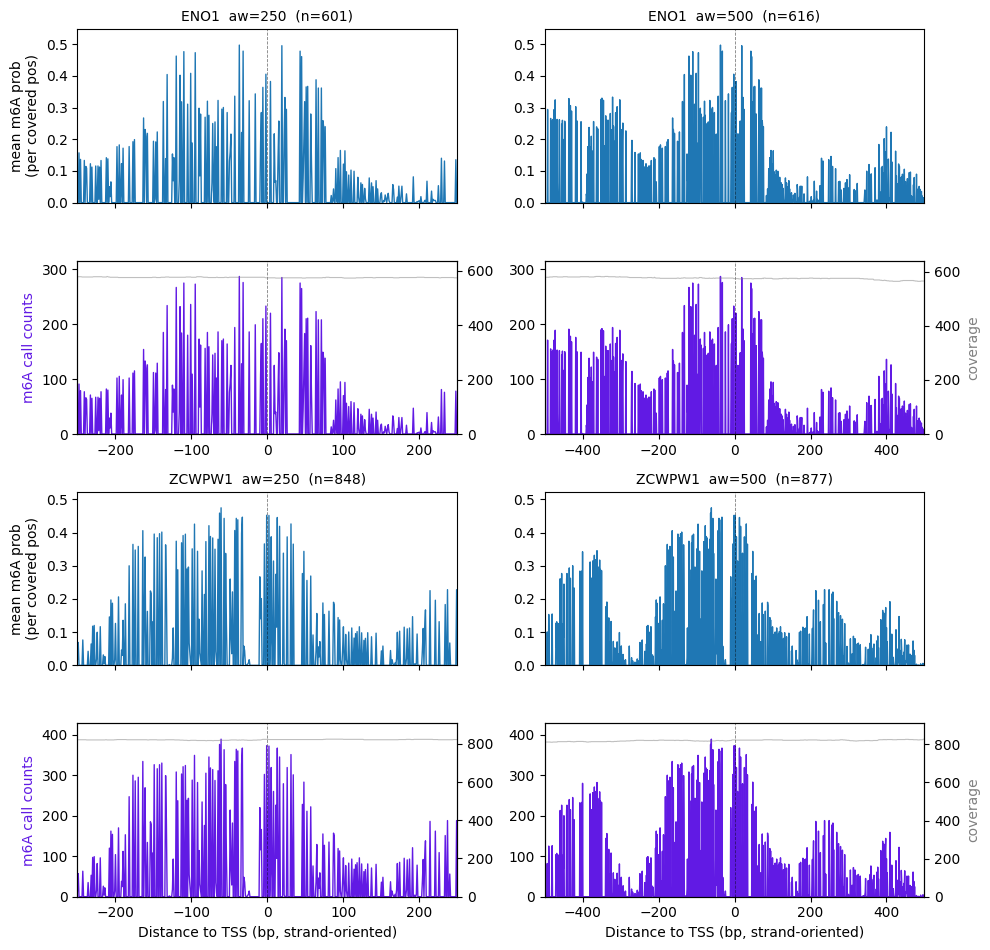

In [ ]:
n_rows = 2 * len(GENES)
# n_rows =  number of subplot rows
# len(HALF_WINDOWS) = number of subplot columns
# Width is 5 inches per window column. Height is 2.4 inches per row
fig, axes = plt.subplots(n_rows, len(HALF_WINDOWS),
                         figsize=(5 * len(HALF_WINDOWS), 2.4 * n_rows),
                         squeeze=False)
# gi = numeric index for gene (0-based)
for gi, gene_name in enumerate(GENES):
    # j = numeric index for half_window (0-based)
    for j, hw in enumerate(HALF_WINDOWS):
        # select the appropriate axes for this gene and window; 
        # the top row (2*gi) is for mean probability, the bottom row (2*gi+1) is for counts; 
        # if there is no data for this gene/window, hide both axes and continue

        # top panel = mean probability per position (averaged over reads covering that position)
        ax_prob = axes[2 * gi,     j]

        # bottom panel = counts of reads with m6A call (prob > threshold) per position, with a secondary y-axis for coverage;
        ax_cnt  = axes[2 * gi + 1, j]
        info = gene_matrices.get((gene_name, hw))
        if info is None:
            ax_prob.set_visible(False); ax_cnt.set_visible(False)
            continue
        X_prob = info["X_prob"]
        X_bin  = info["X_bin"]
        n_reads, n_pos = X_prob.shape
        positions = np.arange(n_pos) - hw

        # Mean probability per position (averaged over reads covering that position).
        mean_prob = np.nanmean(X_prob, axis=0)
        # Counts per position: # reads with mod_prob > MOD_PROB_THRESHOLD.
        counts_mod = np.nansum(X_bin == 1, axis=0)
        # Coverage per position: # reads covering it (denominator for rate).
        coverage = (~np.isnan(X_prob)).sum(axis=0)

        ax_prob.plot(positions, mean_prob, color="#1f77b4", lw=1.0)
        ax_prob.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
        ax_prob.set_xlim(-hw, hw)
        ax_prob.set_ylim(0, max(0.05, np.nanmax(mean_prob) * 1.1))
        ax_prob.set_title(f"{gene_name}  aw={hw}  (n={n_reads})", fontsize=10)
        if j == 0:
            ax_prob.set_ylabel("mean m6A prob\n(per covered pos)")
        plt.setp(ax_prob.get_xticklabels(), visible=False)

        ax_cnt.plot(positions, counts_mod, color="#611ae4", lw=1.0,
                    label=f"# reads w/ m6A call (>{MOD_PROB_THRESHOLD})")
        ax_cnt.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
        ax_cnt.set_xlim(-hw, hw)
        ax_cnt.set_ylim(0, max(1, counts_mod.max() * 1.1))
        ax_cnt2 = ax_cnt.twinx()
        ax_cnt2.plot(positions, coverage, color="grey", lw=0.8, alpha=0.5,
                     label="coverage (# reads)")
        ax_cnt2.set_ylim(0, max(1, coverage.max() * 1.1))
        if j == 0:
            ax_cnt.set_ylabel("m6A call counts", color="#611ae4")
        if j == len(HALF_WINDOWS) - 1:
            ax_cnt2.set_ylabel("coverage", color="grey")
        if 2 * gi + 1 == n_rows - 1:
            ax_cnt.set_xlabel("Distance to TSS (bp, strand-oriented)")
plt.tight_layout()
fig.savefig(OUT_ROOT / "per_position_mean_m6a_prob_and_counts.pdf", bbox_inches="tight")
plt.show()

### 7. K-means on the **probability** maps.

Cluster on the continuous `mod_prob` values (NaN -> 0 for k-means; uncovered positions look like closed positions to the clusterer but stay visibly grey downstream). Smooth into 10-bp bins before fitting - raw single-bp probability is sparse, and we care about open-region geometry at the nucleosome scale. K-means over `k = 2 ... 6`; pick `k` by silhouette.

In [8]:
BIN_BP = 10
K_RANGE = list(range(2, 7))

# takes a read-by-position matrix X and mean-pools every `bin_bp` columns, ignoring NaN values which represent uncovered positions; 
# the resulting matrix has the same number of rows (reads) but fewer columns (binned positions), where each column is the mean m6A probability for that bin;
# if a bin has no covered positions for a read (i.e. all NaN), the result for that bin will be NaN for that read
def bin_smooth_nanmean(X, bin_bp=BIN_BP):
    """Mean-pool every `bin_bp` columns, ignoring NaN (uncovered positions)."""
    # gets the shape of X
    # rows = reads, columns = positions
    n_reads, n_pos = X.shape
    # calculates how many full bins of size `bin_bp` fit into the number of positions; any leftover columns that don't fit into a full bin are discarded
    n_bin = n_pos // bin_bp
    # gives the number of columns that fit into complete bins: n_bin * bin_bp
    # X[:, : n_bin * bin_bp] selects only the columns of X that fit into complete bins, discarding any leftover columns at the end;
    # .reshape(n_reads, n_bin, bin_bp) reshapes this trimmed matrix into a 3D array where the second dimension corresponds to the bins and the third dimension corresponds to the positions within each bin;
    # np.nanmean(..., axis=2) computes the mean across the positions within each bin for each read, ignoring NaN values; the result is a 2D array of shape (n_reads, n_bin) where each column is the mean m6A 
    # probability for that bin, and NaN if the bin had no covered positions for that read.
    trimmed = X[:, : n_bin * bin_bp].reshape(n_reads, n_bin, bin_bp)
    return np.nanmean(trimmed, axis=2)

# loops through each gene/window matrix, prepares the m6A probability matrix for clustering, 
# tests several K-means cluster numbers, chooses the best k using silhouette score, and stores all results
cluster_results = {}
for (gene_name, hw), info in gene_matrices.items():
    X_prob = info["X_prob"]
    # skips clustering if there are fewer than 4 reads, since silhouette score cannot be computed for k >= 2 in that case; prints a message and continues to the next gene/window
    if X_prob.shape[0] < 4:
        print(f"{gene_name} aw={hw}: only {X_prob.shape[0]} reads, skipping")
        continue
    # groups every BIN_BP adjacent base-pair positions together and averages them, ignoring NaN
    Xp_binned = bin_smooth_nanmean(X_prob)
    # Impute NaN bins (whole-bin uncovered) to 0 for clustering.
    Xp_cluster = np.where(np.isnan(Xp_binned), 0.0, Xp_binned)

    # inertia: In K-Means clustering, inertia is a metric that measures how internally coherent your clusters are. 
    # It represents the Within-Cluster Sum-of-Squares (WCSS): the sum of the squared distances between each data point and its assigned cluster centroid

    # Silhouette Score is a metric used to evaluate the quality of K-Means clustering. It measures how similar a data point is to its own cluster (cohesion) compared to other clusters (separation). 
    # Scores range from -1 to +1, where a higher score indicates better-defined, well-separated clusters
    inertias, sils, labels_by_k = [], [], {}
    for k in K_RANGE:
        # check if the number of reads is greater than k; if not, skip this k since K-Means cannot form more clusters than there are data points; prints a message and continues to the next k
        if X_prob.shape[0] <= k:
            continue
        # performs K-Means clustering on the binned and imputed matrix Xp_cluster with k clusters, using 10 random initializations for robustness and a fixed random state for reproducibility;
        # after fitting, it appends the inertia (WCSS) and silhouette score for this
        km = KMeans(n_clusters=k, n_init=10, random_state=0).fit(Xp_cluster)
        inertias.append(km.inertia_)
        sils.append(silhouette_score(Xp_cluster, km.labels_))
        labels_by_k[k] = km.labels_
    k_ran = list(labels_by_k.keys())
    # selects the k with the highest silhouette score as the best k for this gene/window; 
    # stores all relevant results in the cluster_results dictionary for later inspection and plotting
    best_k = int(k_ran[int(np.argmax(sils))])
    cluster_results[(gene_name, hw)] = {
        "Xp_binned": Xp_binned,
        "Xp_cluster": Xp_cluster,
        "k_range": k_ran,
        "inertias": inertias,
        "silhouettes": sils,
        "labels_by_k": labels_by_k,
        "best_k": best_k,
    }
    print(f"\n=== {gene_name} aw={hw} (n_reads={X_prob.shape[0]}) ===")
    for k, ine, s in zip(k_ran, inertias, sils):
        marker = "  <-- best" if k == best_k else ""
        print(f"  k={k}  inertia={ine:8.3f}  silhouette={s:.3f}{marker}")
    np.save(OUT_ROOT / f"{gene_name}_w{hw}_labels_k{best_k}.npy", labels_by_k[best_k])

    fig, axes = plt.subplots(1, 2, figsize=(10, 3.3))
    axes[0].plot(k_ran, inertias, marker="o")
    axes[0].set_xlabel("k"); axes[0].set_ylabel("Inertia")
    axes[0].set_title(f"{gene_name} aw={hw} elbow")
    axes[1].plot(k_ran, sils, marker="o", color="#E15759")
    axes[1].set_xlabel("k"); axes[1].set_ylabel("Silhouette")
    axes[1].set_title(f"{gene_name} aw={hw} silhouette")
    plt.tight_layout(); plt.show()

NameError: name 'gene_matrices' is not defined

### 8. Per-cluster m6A probability tracks + individual reads.

Exact layout from [`plot_polii_footprints_precomputed_sort.py`](plot_polii_footprints_precomputed_sort.py): stacked `fill_between` tracks on top, individual reads as horizontal lines with colored rectangles on the bottom. Only difference: tracks show **per-cluster mean m6A probability** instead of footprint-size bigwigs, and bottom-panel rectangles mark accessibility (m6A modified positions) instead of footprint classes.

In [12]:
import matplotlib.colors as mcolors

CLUSTER_PALETTE = [
    "#1f77b4", "#e41a1c", "#2ca02c", "#9467bd",
    "#ff7f0e", "#17becf", "#8c564b", "#e377c2",
]
UNCOVERED_RGB = (0.92, 0.92, 0.92)   # grey for NA positions
WHITE_RGB     = (1.00, 1.00, 1.00)   # covered but no m6A


def cluster_color(c):
    return CLUSTER_PALETTE[c % len(CLUSTER_PALETTE)]

# takes the gene name, half-window size, the original matrix info from gene matrix
# takes clustering results from cluster_results
def plot_cluster_panels(gene_name, hw, info, res, tag="binned"):
    # extract the original probability and binary matrices, as well as the number of reads and positions
    X_prob = info["X_prob"]               # (n_reads, n_pos) float, NaN = uncovered
    X_bin  = info["X_bin"]                # (n_reads, n_pos) float in {0,1,NaN}
    n_reads, n_pos = X_prob.shape
    # creates the x-axis in TSS-relative coordinates
    positions = np.arange(n_pos) - hw

    best_k = res["best_k"]
    labels = res["labels_by_k"][best_k]

    # computes the average m6A probability profile for each cluster by taking the mean of X_prob across reads that belong to each cluster, ignoring NaN values;
    # the result is a dictionary where each key is a cluster label and the value is an array of mean probabilities for each position for that cluster; 
    # if a cluster has no reads covering a position (i.e. all NaN), the mean for that position will be NaN for that cluster
    profiles = {c: np.nanmean(X_prob[labels == c], axis=0) for c in range(best_k)}
    sizes = {c: int((labels == c).sum()) for c in range(best_k)}

    # Sort reads: by cluster, then by descending total m6A call count within cluster.
    n_mod = np.nansum(X_bin == 1, axis=1)
    order = np.lexsort((-n_mod, labels))

    # Build an image (n_reads, n_pos, 3) for the bottom panel.
    img = np.tile(np.array(UNCOVERED_RGB), (n_reads, n_pos, 1))
    covered = ~np.isnan(X_bin)
    img[covered] = WHITE_RGB
    for c in range(best_k):
        rgb = mcolors.to_rgb(cluster_color(c))
        mod_mask = (X_bin == 1) & (labels[:, None] == c)
        img[mod_mask] = rgb
    img_sorted = img[order]
    labels_sorted = labels[order]

    n_top = best_k
    # Cap bottom-panel height so the figure stays reasonable for many reads.
    bot_height = min(14.0, max(3.5, 0.05 * n_reads))
    spacer = 0.5
    fig_height = 0.8 * n_top + bot_height + spacer + 1.0
    fig = plt.figure(figsize=(14, fig_height))
    gs = plt.GridSpec(
        n_top + 2, 1,
        height_ratios=[0.8] * n_top + [spacer] + [bot_height],
        hspace=0.08,
    )
    top_axes = [fig.add_subplot(gs[i]) for i in range(n_top)]
    ax_bot = fig.add_subplot(gs[n_top + 1], sharex=top_axes[0])

    for i, c in enumerate(range(best_k)):
        ax = top_axes[i]
        prof = np.where(np.isnan(profiles[c]), 0.0, profiles[c])
        ax.fill_between(positions, 0, prof, color=cluster_color(c), alpha=0.85)
        ax.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
        ax.set_xlim(-hw, hw)
        ax.set_ylim(0, 1)
        ax.set_yticks([0, 0.25, 0.5, 1.0])
        ax.set_yticklabels(["0", "0.25", "0.5", "1"], fontsize=7)
        ax.set_ylabel(f"c{c}\nn={sizes[c]}\nm6A prob", fontsize=8,
                      rotation=0, labelpad=28, va="center",
                      color=cluster_color(c))
        ax.tick_params(axis="y", which="both", left=True, labelleft=True)
        if i == 0:
            ax.set_title(
                f"{gene_name} aw={hw} ({tag}): m6A probability per cluster "
                f"(k={best_k}, n={n_reads} reads)"
            )
        if i < n_top - 1:
            plt.setp(ax.get_xticklabels(), visible=False)

    # Bottom: imshow RGBA. One pixel per (read, bp). White=covered unmod, grey=NA, color=mod.
    ax_bot.imshow(img_sorted, aspect="auto",
                  interpolation="nearest",
                  extent=[-hw, hw, n_reads, 0])
    ax_bot.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
    boundaries = np.where(np.diff(labels_sorted) != 0)[0] + 1
    for b in boundaries:
        ax_bot.axhline(b, color="black", lw=0.7)
    for c in range(best_k):
        idx = np.where(labels_sorted == c)[0]
        if len(idx):
            y_mid = (idx.min() + idx.max()) / 2
            ax_bot.text(hw * 1.02, y_mid, f"c{c}\nn={sizes[c]}",
                        fontsize=8, va="center",
                        color=cluster_color(c), fontweight="bold")
    ax_bot.set_xlim(-hw, hw)
    ax_bot.set_yticks([])
    ax_bot.set_ylabel(f"Reads (n={n_reads})", fontsize=9)
    ax_bot.set_xlabel("Distance to TSS (bp, strand-oriented)", fontsize=9)

    plt.tight_layout()
    fig.savefig(OUT_ROOT / f"{gene_name}_w{hw}_cluster_panels_{tag}.pdf",
                bbox_inches="tight")
    plt.show()

    summary = pd.DataFrame({
        "cluster": [f"c{c}" for c in range(best_k)],
        "n_reads": [sizes[c] for c in range(best_k)],
        "mean_m6a_prob": [float(np.nanmean(X_prob[labels == c])) for c in range(best_k)],
        "mean_m6a_calls": [float(np.nansum(X_bin[labels == c] == 1, axis=1).mean())
                            for c in range(best_k)],
        "mean_coverage_pct": [
            float(100 * (~np.isnan(X_bin[labels == c])).mean()) for c in range(best_k)
        ],
    })
    print(f"=== {gene_name} aw={hw} [{tag}] cluster summary ===")
    print(summary.to_string(index=False))
    summary.to_csv(OUT_ROOT / f"{gene_name}_w{hw}_cluster_summary_{tag}_k{best_k}.tsv",
                   sep="\t", index=False)
    pd.DataFrame({
        "read_id": info["read_ids"],
        "cluster": labels,
        "n_m6a_calls": n_mod.astype(int),
        "coverage_pct": (100 * (~np.isnan(X_bin)).sum(axis=1) / n_pos).round(1),
    }).to_csv(OUT_ROOT / f"{gene_name}_w{hw}_read_clusters_{tag}_k{best_k}.tsv",
             sep="\t", index=False)


for (gene_name, hw), info in gene_matrices.items():
    if (gene_name, hw) in cluster_results:
        plot_cluster_panels(gene_name, hw, info, cluster_results[(gene_name, hw)],
                            tag="binned10bp")

NameError: name 'gene_matrices' is not defined

# extract m6A modification by dimelo
- `footprintR::readModBam(..., level="quickread")` separates strand 
- switch to dimelo to extract m6a as pileup

In [4]:
# convert the promoter region of selected genes into BED files for dimelo input.
# Centers each window on the same `tss_anchor` (CAGE -> GENCODE fallback) used by
# `run_m6a_pausing_quartiles.R`, then writes one 6-column BED per (gene, half_window):
#     chrom  start(0-based)  end(0-based, half-open)  name  score  strand
# These BEDs become the `regions=` argument to `dimelo.parse_bam.pileup` / `extract`.

DIMELO_OUT_ROOT = Path("/project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a")
DIMELO_BED_DIR = DIMELO_OUT_ROOT / "bed_inputs"
DIMELO_BED_DIR.mkdir(parents=True, exist_ok=True)

bed_paths = {}
for gene_name in GENES:
    row = gene_info.loc[gene_info["gene_name"] == gene_name].iloc[0]
    chrom = row["chrom"]
    strand = row["strand"]
    tss = int(row["tss_anchor"])  # 1-based coordinate from the pausing-index table
    for hw in HALF_WINDOWS:
        start = max(0, tss - hw - 1)  # convert 1-based TSS to 0-based BED start
        end   = tss + hw              # 0-based half-open end => window is 2*hw+1 bp
        bed_df = pd.DataFrame({
            "chrom":  [chrom],
            "start":  [start],
            "end":    [end],
            "name":   [f"{gene_name}_promoter_w{hw}"],
            "score":  [0],
            "strand": [strand],
        })
        bed_path = DIMELO_BED_DIR / f"{gene_name}_promoter_w{hw}.bed"
        bed_df.to_csv(bed_path, sep="\t", header=False, index=False)
        bed_paths[(gene_name, hw)] = bed_path
        print(f"Wrote {bed_path}  ({chrom}:{start}-{end}, strand={strand}, length={end-start} bp)")

# Sanity-check: read each BED back and show contents
for (gene_name, hw), bed_path in bed_paths.items():
    print(f"\n{bed_path.name}:")
    print(bed_path.read_text().rstrip())

Wrote /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a/bed_inputs/ENO1_promoter_w250.bed  (chr1:8878480-8878981, strand=-, length=501 bp)
Wrote /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a/bed_inputs/ENO1_promoter_w500.bed  (chr1:8878230-8879231, strand=-, length=1001 bp)
Wrote /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a/bed_inputs/ZCWPW1_promoter_w250.bed  (chr7:100335712-100336213, strand=-, length=501 bp)
Wrote /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a/bed_inputs/ZCWPW1_promoter_w500.bed  (chr7:100335462-100336463, strand=-, length=1001 bp)

ENO1_promoter_w250.bed:
chr1	8878480	8878981	ENO1_promoter_w250	0	-

ENO1_promoter_w500.bed:
chr1	8878230	8879231	ENO1_promoter_w500	0	-

ZCWPW1_promoter_w250.bed:
chr7	100335712	100336213	ZCWPW1_promoter_w250	0	-

ZCWPW1_promoter_w500.bed:
chr7	100335462	100336463	ZCWPW1_promoter_w500	0	-


### Run dimelo for every sample (sbatch array)

For each sample in `meta_df` and each `(gene, half_window)` BED, run
`dimelo.parse_bam.pileup` + `dimelo.parse_bam.extract` on the cluster --
**not** in this notebook. This cell only writes two files into
`DIMELO_OUT_ROOT/scripts/`:

- `run_dimelo_extraction.py` -- Python helper, parametrized by env vars. Mirrors
  Kevin's `dimelo_parsing_pileup_regions.py` + `dimelo_parsing_extract_regions.py`
  logic: `motifs=['A,0','CG,0']`, `thresh=190`, `window_size=1000`, `cleanup=False`.
- `submit_dimelo_extraction.sh` -- SLURM array script. One task per sample in
  `meta_df`. Activates the dimelo conda env, runs `modkit update-tags` to
  produce `*.modkit.updated.bam` if it isn't already there (matches Kevin's
  `process_bam_dimelo_extract.sbatch` filename-suffix check), then loops over
  all `(gene, hw)` BEDs.

Reference genome: Kevin's `/project/spott/kevinluo/Fiber_seq/data/ref_genome/hg38.fa`.

Output dir per (sample, gene, hw): `DIMELO_OUT_ROOT/<sample>/<gene>_w<hw>/` --
this is the directory you pass straight to `extract_dimelo_pileup` /
`extract_dimelo_reads` in R.

After the cell runs, submit with:
```
sbatch <DIMELO_OUT_ROOT>/scripts/submit_dimelo_extraction.sh
```

In Nanopore BAM files, modification confidence is typically stored in the ML tag, modification threshold 190/255 corresponds to a modification probability of ~0.745

In [ ]:
# run dimelo on every sample
# in `meta_df`, for every (gene, hw) BED in `bed_paths`. Nothing runs in the
# notebook - this only stages the scripts.

SCRIPTS_DIR = DIMELO_OUT_ROOT / "scripts"
LOGS_DIR    = DIMELO_OUT_ROOT / "logs"
CONVERTED_BAM_DIR = DIMELO_OUT_ROOT / "modkit_converted"
SCRIPTS_DIR.mkdir(parents=True, exist_ok=True)
LOGS_DIR.mkdir(parents=True, exist_ok=True)
CONVERTED_BAM_DIR.mkdir(parents=True, exist_ok=True)

# Kevin's reference genome
REF_GENOME = "/project/spott/kevinluo/Fiber_seq/data/ref_genome/hg38.fa"

# Where the raw (un-converted) BAMs live; modkit update-tags will be run on the
# fly into CONVERTED_BAM_DIR if the converted file isn't already there.
BAM_TEMPLATE_RAW = (
    "/project/spott/1_Shared_projects/LCL_Fiber_seq/"
    "preprocess_final_merged_samples/{sample}.5mC.6mA.aligned.phased.bam"
)

# dimelo parameters 
MOD_THRESH  = 190    
WINDOW_SIZE = 1000
NCORE       = 4

PY_PATH = SCRIPTS_DIR / "run_dimelo_extraction.py"
SH_PATH = SCRIPTS_DIR / "submit_dimelo_extraction.sh"

# --- Python helper ---------------------------------------------------------
py_helper = r"""#!/usr/bin/env python
# Run dimelo parse_bam.pileup + parse_bam.extract for one sample over a list of
# (gene, half_window) BEDs
#   /project/spott/kevinluo/Fiber_seq/code/dimelo_parsing_pileup_regions.py
#   /project/spott/kevinluo/Fiber_seq/code/dimelo_parsing_extract_regions.py
import os, sys, datetime
from pathlib import Path
from dimelo import parse_bam

SAMPLE_NAME = os.environ["SAMPLE_NAME"]
BAM_FILE    = os.environ["BAM_FILE"]           
REF_GENOME  = os.environ["REF_GENOME"]
BED_DIR     = Path(os.environ["BED_DIR"])
OUT_ROOT    = Path(os.environ["OUT_ROOT"])
GENES        = os.environ["GENES"].split(",")
HALF_WINDOWS = [int(x) for x in os.environ["HALF_WINDOWS"].split(",")]
MOD_THRESH   = int(os.environ.get("MOD_THRESH", "190"))
WINDOW_SIZE  = int(os.environ.get("WINDOW_SIZE", "1000"))
NCORE        = int(os.environ.get("NCORE", "4"))

MOTIFS = ["A,0", "CG,0"]

for path, label in [(BAM_FILE, "BAM"), (REF_GENOME, "REF_GENOME")]:
    if not os.path.exists(path):
        sys.exit(f"missing {label}: {path}")

print(f"Sample      : {SAMPLE_NAME}")
print(f"BAM         : {BAM_FILE}")
print(f"REF_GENOME  : {REF_GENOME}")
print(f"BED_DIR     : {BED_DIR}")
print(f"OUT_ROOT    : {OUT_ROOT}")
print(f"GENES       : {GENES}")
print(f"HALF_WINDOWS: {HALF_WINDOWS}")
print(f"thresh      : {MOD_THRESH}  (0-255 scale)")
print(f"window_size : {WINDOW_SIZE}")
print(f"ncore       : {NCORE}")
print(f"motifs      : {MOTIFS}")

for gene in GENES:
    for hw in HALF_WINDOWS:
        bed_path = BED_DIR / f"{gene}_promoter_w{hw}.bed"
        if not bed_path.exists():
            sys.exit(f"missing BED: {bed_path}")
        sample_dir = OUT_ROOT / SAMPLE_NAME
        sample_dir.mkdir(parents=True, exist_ok=True)
        out_name = f"{gene}_w{hw}"
        # parse_bam.* writes outputs to {output_directory}/{output_name}/
        target_dir = sample_dir / out_name
        target_dir.mkdir(parents=True, exist_ok=True)

        t0 = datetime.datetime.now()
        print(f"\n=== {SAMPLE_NAME} {gene} hw={hw} -> {target_dir}", flush=True)
        print("  parse_bam.pileup ...", flush=True)
        parse_bam.pileup(
            input_file       = BAM_FILE,
            output_name      = out_name,
            ref_genome       = REF_GENOME,
            output_directory = str(sample_dir),
            regions          = str(bed_path),
            motifs           = MOTIFS,
            thresh           = MOD_THRESH,
            window_size      = WINDOW_SIZE,
            cores            = NCORE,
            cleanup          = False,
            log              = True,
        )
        print(f"  parse_bam.pileup done in {datetime.datetime.now() - t0}", flush=True)

        t1 = datetime.datetime.now()
        print("  parse_bam.extract ...", flush=True)
        parse_bam.extract(
            input_file       = BAM_FILE,
            output_name      = out_name,
            ref_genome       = REF_GENOME,
            output_directory = str(sample_dir),
            regions          = str(bed_path),
            motifs           = MOTIFS,
            thresh           = MOD_THRESH,
            window_size      = WINDOW_SIZE,
            cores            = NCORE,
            cleanup          = False,
            log              = True,
        )
        print(f"  parse_bam.extract done in {datetime.datetime.now() - t1}", flush=True)

print("\nDone.")
"""

PY_PATH.write_text(py_helper)
PY_PATH.chmod(0o755)

# --- SLURM array wrapper ---------------------------------------------------
n_samples = len(meta_df)
sample_names_list = ",".join(meta_df["sample_name"].astype(str).tolist())

sh_wrapper = f"""#!/bin/bash
#SBATCH --job-name=dimelo_extract
#SBATCH --account=pi-spott
#SBATCH --partition=caslake
#SBATCH --cpus-per-task={NCORE}
#SBATCH --mem=40G
#SBATCH --time=12:00:00
#SBATCH --array=0-{n_samples - 1}
#SBATCH --output={LOGS_DIR}/dimelo_extract_%A_%a.out
#SBATCH --error={LOGS_DIR}/dimelo_extract_%A_%a.err

set -euo pipefail

# Activate dimelo conda env
module load python/miniforge-25.3.0
source activate /project/spott/cshan/envs/dimelo

# Resolve sample name for this array task
SAMPLES=({sample_names_list.replace(",", " ")})
SAMPLE_NAME="${{SAMPLES[$SLURM_ARRAY_TASK_ID]}}"
echo "[task $SLURM_ARRAY_TASK_ID] sample = $SAMPLE_NAME"

RAW_BAM="{BAM_TEMPLATE_RAW.format(sample="$SAMPLE_NAME")}"
CONVERTED_BAM_DIR="{CONVERTED_BAM_DIR}"

# if the BAM filename already contains "modkit.updated", treat it as ready; otherwise convert.
if [[ "$RAW_BAM" == *"modkit.updated"* ]]; then
    BAM_FILE="$RAW_BAM"
    echo "BAM is already modkit-updated: $BAM_FILE"
else
    bamfilename=$(basename -- "$RAW_BAM")
    extension="${{bamfilename##*.}}"
    bamname="${{bamfilename%.*}}"
    BAM_FILE="${{CONVERTED_BAM_DIR}}/${{bamname}}.modkit.updated.${{extension}}"
    if [[ ! -f "$BAM_FILE" ]]; then
        echo "Running modkit update-tags -> $BAM_FILE"
        module load samtools
        modkit update-tags --mode ambiguous --threads {NCORE} "$RAW_BAM" "$BAM_FILE"
        samtools index "$BAM_FILE"
    else
        echo "modkit-updated BAM already exists: $BAM_FILE"
    fi
fi

export SAMPLE_NAME
export BAM_FILE
export REF_GENOME="{REF_GENOME}"
export BED_DIR="{DIMELO_BED_DIR}"
export OUT_ROOT="{DIMELO_OUT_ROOT}"
export GENES="{",".join(GENES)}"
export HALF_WINDOWS="{",".join(str(h) for h in HALF_WINDOWS)}"
export MOD_THRESH="{MOD_THRESH}"
export WINDOW_SIZE="{WINDOW_SIZE}"
export NCORE="{NCORE}"

python {PY_PATH}
"""

SH_PATH.write_text(sh_wrapper)
SH_PATH.chmod(0o755)

print(f"Wrote {PY_PATH}")
print(f"Wrote {SH_PATH}")
print(f"\nSubmit with:")
print(f"  sbatch {SH_PATH}")
print(f"\nArray size: {n_samples} tasks (one per sample). Logs -> {LOGS_DIR}/")
print(f"Output dir per (sample, gene, hw): {DIMELO_OUT_ROOT}/<sample>/<gene>_w<hw>/")
print(f"  -> contains pileup.sorted.bed, reads.A,0.txt, reads.CG,0.txt")


Wrote /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a/scripts/run_dimelo_extraction.py
Wrote /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a/scripts/submit_dimelo_extraction.sh

Submit with:
  sbatch /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a/scripts/submit_dimelo_extraction.sh

Array size: 31 tasks (one per sample). Logs -> /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a/logs/
Output dir per (sample, gene, hw): /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a/<sample>/<gene>_w<hw>/
  -> contains pileup.sorted.bed, reads.A,0.txt, reads.CG,0.txt
     (input format expected by extract_dimelo_pileup / extract_dimelo_reads in R)


In [15]:
!sbatch /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a/scripts/submit_dimelo_extraction.sh

sbatch: Verify job submission ...
sbatch: Using a shared partition ...
sbatch: Partition: caslake
sbatch: QOS-Flag: caslake
sbatch: Account: pi-spott
sbatch: Verification: ***PASSED***
Submitted batch job 50018899


### Inspect dimelo extraction outputs

Each SLURM task writes one directory per `(sample, gene, hw)` under
`/project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a/<sample>/<gene>_w<hw>/`,
containing:
- `pileup.sorted.bed(.gz)` — bedmethyl-style per-position pileup
- `reads.A,0.txt` — per-read, per-A mod-prob calls (m6A)
- `reads.CG,0.txt` — per-read, per-CpG mod-prob calls (5mCpG)
- `reads.combined_basemods.h5`, `regions.processed.bed`, logs

We only use the m6A file downstream. The CpG file is also produced but,
for these CpG-island promoters, the bulk of CpG `mod_qual` values are very
low (median ≈ 0.01–0.04, i.e. unmethylated active-promoter signal), so
binarizing at `MOD_PROB_THRESHOLD = 0.9` yields ~0–5 calls per read — too
few to meaningfully cluster on. See the head of both files below.

In [10]:
DIMELO_OUT_ROOT = Path("/project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a")
DIMELO_BED_DIR = DIMELO_OUT_ROOT / "bed_inputs"


sample_inspect = sorted(
    p.name for p in DIMELO_OUT_ROOT.iterdir()
    if p.is_dir() and p.name.startswith('AL')
)[0]
gene_inspect, hw_inspect = GENES[0], HALF_WINDOWS[0]
inspect_dir = DIMELO_OUT_ROOT / sample_inspect / f'{gene_inspect}_w{hw_inspect}'
print(f'Inspecting {inspect_dir}')

# reads the first few lines from dimelo output
print('\nFirst 3 rows of reads.A,0.txt:')
print(pd.read_csv(inspect_dir / 'reads.A,0.txt', sep='\t', nrows=3).to_string(index=False))

# stores aggregated signal across all reads: across al reads overlapping the window, what the mean methylation probability?
print('\nFirst 3 rows of pileup.sorted.bed:')
print(pd.read_csv(inspect_dir / 'pileup.sorted.bed', sep='\t', header=None, nrows=3).to_string(index=False))


Inspecting /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a/AL10_bc2178_19130/ENO1_w250

First 3 rows of reads.A,0.txt:
                             read_id  forward_read_position  ref_position chrom mod_strand ref_strand ref_mod_strand  fw_soft_clipped_start  fw_soft_clipped_end  read_length  mod_qual mod_code  base_qual ref_kmer query_kmer canonical_base modified_primary_base  inferred  flag
m84241_250311_201728_s2/82514496/ccs                   2392       8877739  chr1          +          -              -                      0                    0        26060  0.998047        a         40    ggtgg      CCACC              A                     A     False    16
m84241_250311_201728_s2/82514496/ccs                   2372       8877759  chr1          -          -              +                      0                    0        26060  0.998047        a         40    ccagc      CCAGC              T                     A     False    16
m84241_250311_201728_s2/8

### Pool m6A reads across samples → per-read mod-probability matrix

For each `(gene, hw)`, iterate every per-sample directory, read `reads.A,0.txt`,
stack into one `(n_reads, 2*hw+1)` matrix `X_a` of `mod_qual` values in `[0, 1]`.
Cell convention matches the footprintR section above:
- `mod_qual` at A positions a read covers
- `0.0` at positions inside the read's alignment span but not an A
- `NaN` outside the alignment span

Reads are filtered by `base_qual >= 7`, which matches the default in Kevin's
`extract_dimelo_reads()` (`process_fiberseq_data.R:496`). `base_qual` is the
per-base Phred-like quality of the base call at that A position, so `>= 7`
means the base call has ≥ ~80% accuracy (10^(-7/10) ≈ 20% error). For the
PacBio HiFi BAMs used here, base quality is typically Q40, so almost every
row passes — this is a defensive floor rather than an aggressive filter.

`read_id` is prefixed with the sample name so identical PacBio read IDs from
different samples don't collide after pooling.

In [5]:
DIMELO_BASE_QUAL_THRESH = 7

def load_dimelo_m6a_matrix(dimelo_out_root, samples, gene, hw,
                           tss_anchor, strand, chrom,
                           base_qual_thresh=DIMELO_BASE_QUAL_THRESH):
    '''Pool dimelo per-read m6A mod_qual into an (n_reads, 2*hw+1) matrix.'''
    rows = []
    for sample in samples:
        f = Path(dimelo_out_root) / sample / f'{gene}_w{hw}' / 'reads.A,0.txt'
        if not f.exists():
            continue
        d = pd.read_csv(
            f, sep='\t',
            usecols=['read_id', 'forward_read_position', 'ref_position',
                     'chrom', 'read_length', 'mod_qual', 'base_qual'],
        )
        d = d[(d['chrom'] == chrom) & (d['base_qual'] >= base_qual_thresh)]
        if d.empty:
            continue
        rows.append(d.assign(read_uid=sample + '-' + d['read_id'].astype(str)))
    if not rows:
        return [], np.zeros((0, 2 * hw + 1), dtype=np.float32)
    df = pd.concat(rows, ignore_index=True)
    df['read_start'] = df['ref_position'] - df['forward_read_position']
    df['read_end']   = df['read_start']   + df['read_length']
    span = df.groupby('read_uid', as_index=False).agg(
        read_start=('read_start', 'min'), read_end=('read_end', 'max'))
    read_ids = span['read_uid'].tolist()
    rid_to_row = {r: i for i, r in enumerate(read_ids)}
    n_reads, n_pos = len(read_ids), 2 * hw + 1

    X = np.full((n_reads, n_pos), np.nan, dtype=np.float32)
    rs = span['read_start'].to_numpy(); re = span['read_end'].to_numpy()
    if strand == '+':
        rel_lo = np.maximum(rs - tss_anchor, -hw)
        rel_hi = np.minimum(re - tss_anchor,  hw)
    else:
        rel_lo = np.maximum(tss_anchor - re, -hw)
        rel_hi = np.minimum(tss_anchor - rs,  hw)
    for i in np.where(rel_lo <= rel_hi)[0]:
        X[i, (rel_lo[i] + hw):(rel_hi[i] + hw + 1)] = 0.0

    rel = df['ref_position'].to_numpy() - tss_anchor
    if strand == '-':
        rel = -rel
    inwin    = (rel >= -hw) & (rel <= hw)
    sub      = df.loc[inwin]
    rows_idx = np.fromiter((rid_to_row[u] for u in sub['read_uid']),
                           dtype=np.int64, count=len(sub))
    cols_idx = (rel[inwin] + hw).astype(np.int64)
    vals     = sub['mod_qual'].to_numpy(dtype=np.float32)
    np.maximum.at(X, (rows_idx, cols_idx), vals)
    return read_ids, X


sample_dirs = sorted(p.name for p in DIMELO_OUT_ROOT.iterdir()
                     if p.is_dir() and p.name.startswith('AL'))
print(f'Found {len(sample_dirs)} sample directories under {DIMELO_OUT_ROOT}')

dimelo_matrices = {}
for gene_name in GENES:
    row = gene_info.loc[gene_info['gene_name'] == gene_name].iloc[0]
    chrom, strand, tss_anchor = row['chrom'], row['strand'], int(row['tss_anchor'])
    for hw in HALF_WINDOWS:
        read_ids, X_a = load_dimelo_m6a_matrix(
            DIMELO_OUT_ROOT, sample_dirs, gene_name, hw,
            tss_anchor, strand, chrom,
        )
        Xa_bin = np.where(np.isnan(X_a), np.nan,
                          (X_a > MOD_PROB_THRESHOLD).astype(np.float32))
        dimelo_matrices[(gene_name, hw)] = dict(
            read_ids=read_ids, X_prob=X_a, X_bin=Xa_bin,
        )
        if not read_ids:
            print(f'  {gene_name} hw={hw}: no reads pooled')
            continue
        med_a = int(np.nanmedian(np.nansum(Xa_bin == 1, axis=1)))
        print(f'  {gene_name} hw={hw}: {len(read_ids):>6} reads | '
              f'median m6A calls/read (>{MOD_PROB_THRESHOLD})={med_a:>3}')


Found 27 sample directories under /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_dimelo_m6a
  ENO1 hw=250:    569 reads | median m6A calls/read (>0.9)= 47
  ENO1 hw=500:    569 reads | median m6A calls/read (>0.9)= 84
  ZCWPW1 hw=250:    801 reads | median m6A calls/read (>0.9)= 59
  ZCWPW1 hw=500:    801 reads | median m6A calls/read (>0.9)= 89


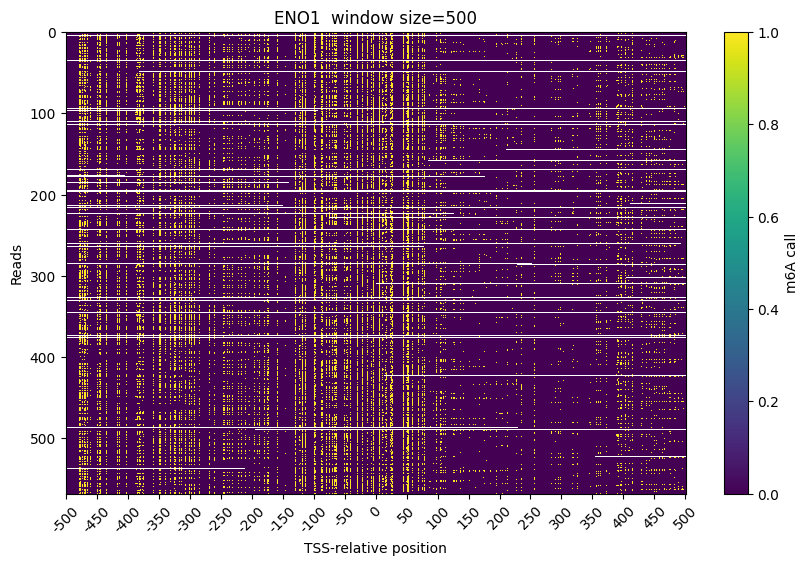

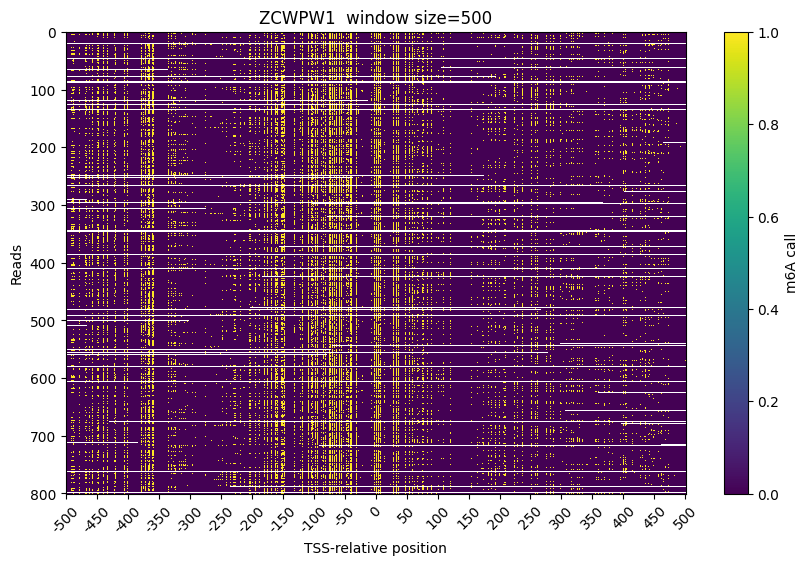

In [7]:
import matplotlib.pyplot as plt

# loop over both genes
for gene_name in GENES:
    Xb = dimelo_matrices[(gene_name, 500)]['X_bin']
    plt.figure(figsize=(10,6))
    
    plt.imshow(Xb, aspect='auto', interpolation='none')
    # break x-axis into 50 bp bins and label them in TSS-relative coordinates

    n_pos = Xb.shape[1]
    bin_size = 50
    bins = np.arange(0, n_pos, bin_size)
    bin_labels = [f"{b - 500}" for b in bins]
    plt.xticks(bins, bin_labels, rotation=45)
    # label gene name and window size in title
    plt.title(f"{gene_name}  window size=500")
    plt.xlabel('TSS-relative position')
    plt.ylabel('Reads')
    plt.colorbar(label='m6A call')
    plt.show()


### Cluster pooled reads on m6A accessibility

Reuses `bin_smooth_nanmean` (10-bp bins) and the silhouette-based k search
from the binary-m6A section above. Features per read = binned m6A profile,
NaN bins imputed to 0.

In [8]:
BIN_BP = 1
K_RANGE = list(range(2, 10))

def bin_smooth_nanmean(X, bin_bp=BIN_BP):
    """Mean-pool every `bin_bp` columns, ignoring NaN (uncovered positions)."""
    n_reads, n_pos = X.shape
    n_bin = n_pos // bin_bp
    trimmed = X[:, : n_bin * bin_bp].reshape(n_reads, n_bin, bin_bp)
    return np.nanmean(trimmed, axis=2)


dimelo_cluster_results = {}
for (gene_name, hw), info in dimelo_matrices.items():
    X_prob = info['X_prob']
    if X_prob.shape[0] < 4:
        print(f'{gene_name} hw={hw}: only {X_prob.shape[0]} reads, skipping')
        continue
    Xp_binned  = bin_smooth_nanmean(X_prob)
    Xp_cluster = np.where(np.isnan(Xp_binned), 0.0, Xp_binned)

    inertias, sils, labels_by_k = [], [], {}
    for k in K_RANGE:
        if X_prob.shape[0] <= k:
            continue
        km = KMeans(n_clusters=k, n_init=10, random_state=0).fit(Xp_cluster)
        inertias.append(km.inertia_)
        sils.append(silhouette_score(Xp_cluster, km.labels_))
        labels_by_k[k] = km.labels_
    k_ran  = list(labels_by_k.keys())
    best_k = int(k_ran[int(np.argmax(sils))])
    dimelo_cluster_results[(gene_name, hw)] = dict(
        Xp_binned=Xp_binned, Xp_cluster=Xp_cluster,
        k_range=k_ran, inertias=inertias, silhouettes=sils,
        labels_by_k=labels_by_k, best_k=best_k,
    )
    print(f'\n=== {gene_name} hw={hw} (n_reads={X_prob.shape[0]}) ===')
    for k, ine, s in zip(k_ran, inertias, sils):
        marker = '  <-- best' if k == best_k else ''
        print(f'  k={k}  inertia={ine:8.2f}  silhouette={s:.3f}{marker}')


/home/cshan/ipykernel_3161704/1050110255.py:9: RuntimeWarning: Mean of empty slice
  return np.nanmean(trimmed, axis=2)



=== ENO1 hw=250 (n_reads=569) ===
  k=2  inertia=11689.33  silhouette=0.142
  k=3  inertia=10428.10  silhouette=0.159  <-- best
  k=4  inertia= 9918.76  silhouette=0.147
  k=5  inertia= 9532.62  silhouette=0.148
  k=6  inertia= 9272.75  silhouette=0.142
  k=7  inertia= 9080.65  silhouette=0.141
  k=8  inertia= 8893.20  silhouette=0.140
  k=9  inertia= 8757.48  silhouette=0.140


/home/cshan/ipykernel_3161704/1050110255.py:9: RuntimeWarning: Mean of empty slice
  return np.nanmean(trimmed, axis=2)



=== ENO1 hw=500 (n_reads=569) ===
  k=2  inertia=22473.08  silhouette=0.088
  k=3  inertia=20902.42  silhouette=0.102
  k=4  inertia=19838.68  silhouette=0.107
  k=5  inertia=19302.41  silhouette=0.114
  k=6  inertia=18902.58  silhouette=0.114
  k=7  inertia=18505.30  silhouette=0.115  <-- best
  k=8  inertia=18212.04  silhouette=0.114
  k=9  inertia=17947.28  silhouette=0.110


/home/cshan/ipykernel_3161704/1050110255.py:9: RuntimeWarning: Mean of empty slice
  return np.nanmean(trimmed, axis=2)



=== ZCWPW1 hw=250 (n_reads=801) ===
  k=2  inertia=17363.87  silhouette=0.195  <-- best
  k=3  inertia=15846.89  silhouette=0.168
  k=4  inertia=15142.87  silhouette=0.147
  k=5  inertia=14616.40  silhouette=0.145
  k=6  inertia=14324.41  silhouette=0.134
  k=7  inertia=14065.78  silhouette=0.128
  k=8  inertia=13833.17  silhouette=0.131
  k=9  inertia=13685.22  silhouette=0.130


/home/cshan/ipykernel_3161704/1050110255.py:9: RuntimeWarning: Mean of empty slice
  return np.nanmean(trimmed, axis=2)



=== ZCWPW1 hw=500 (n_reads=801) ===
  k=2  inertia=30705.29  silhouette=0.128  <-- best
  k=3  inertia=29105.96  silhouette=0.118
  k=4  inertia=28151.81  silhouette=0.112
  k=5  inertia=27519.66  silhouette=0.109
  k=6  inertia=27080.56  silhouette=0.102
  k=7  inertia=26732.46  silhouette=0.098
  k=8  inertia=26417.82  silhouette=0.092
  k=9  inertia=26153.49  silhouette=0.092


### Per-cluster m6A track + per-read heatmap

Layout matches the footprintR m6A plot above (top: per-cluster mean-probability
tracks, bottom: per-read heatmap sorted by cluster then by total m6A calls).

/home/cshan/ipykernel_3161704/3000874105.py:106: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


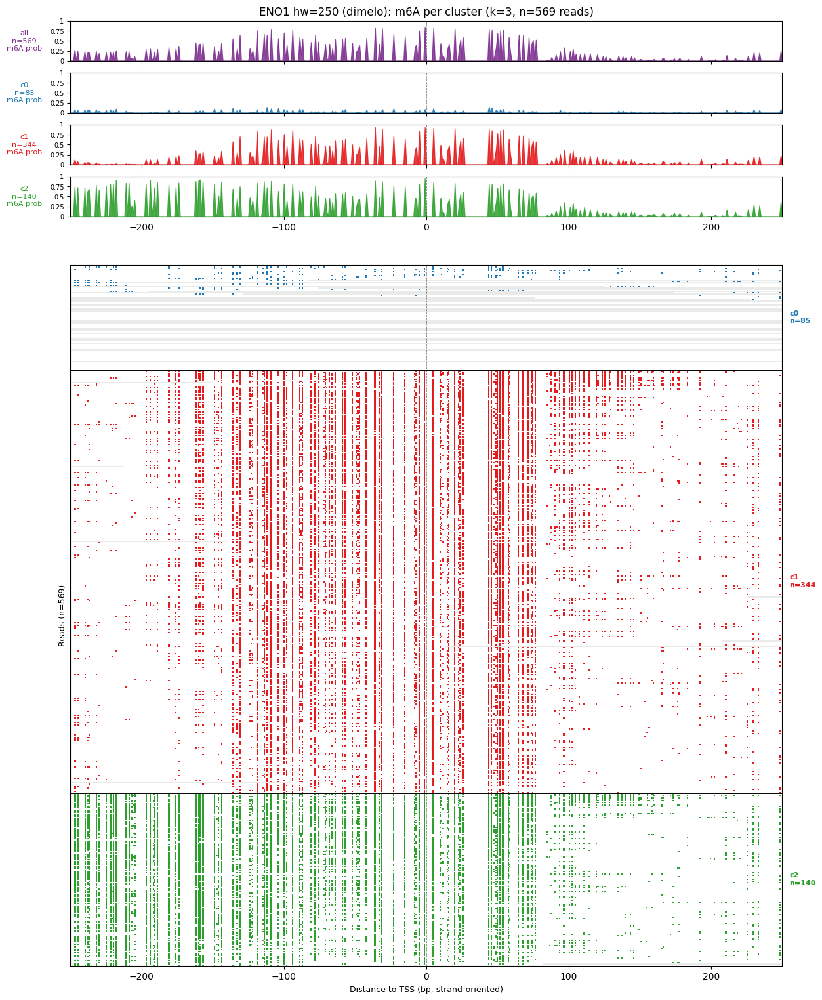

=== ENO1 hw=250 dimelo cluster summary ===
cluster  n_reads  mean_m6a_prob  mean_m6a_calls
     c0       85       0.012581        4.200000
     c1      344       0.093540       46.837209
     c2      140       0.131939       66.164286


/home/cshan/ipykernel_3161704/3000874105.py:106: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


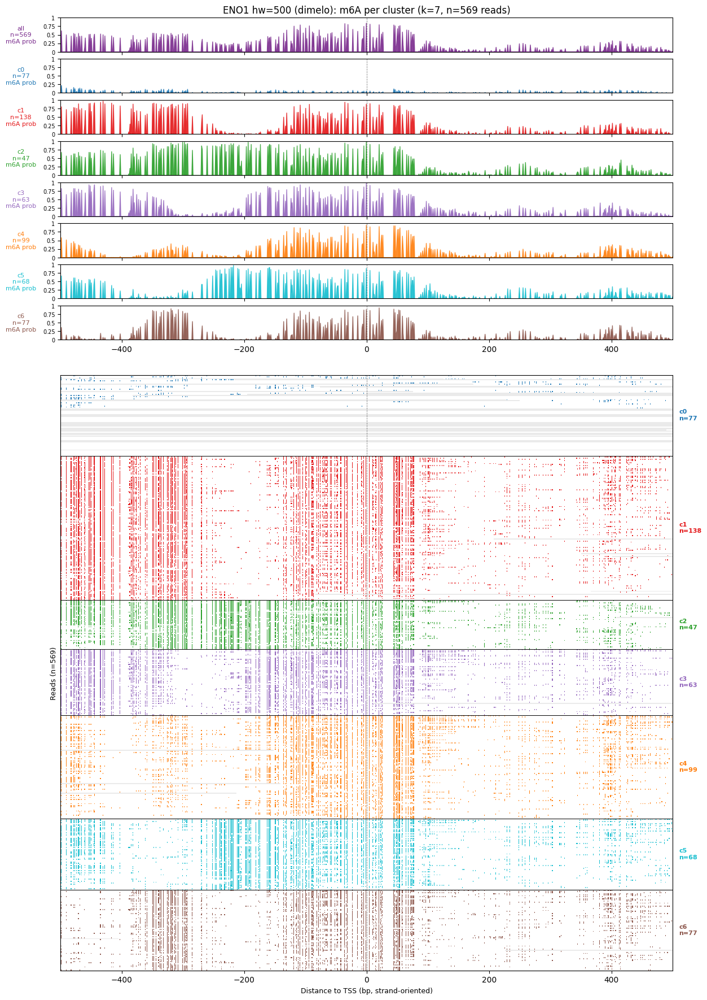

=== ENO1 hw=500 dimelo cluster summary ===
cluster  n_reads  mean_m6a_prob  mean_m6a_calls
     c0       77       0.011466        7.584416
     c1      138       0.094067       93.630435
     c2       47       0.117648      117.936170
     c3       63       0.094559       94.253968
     c4       99       0.072269       71.575758
     c5       68       0.092979       92.823529
     c6       77       0.074318       74.311688


/home/cshan/ipykernel_3161704/3000874105.py:106: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


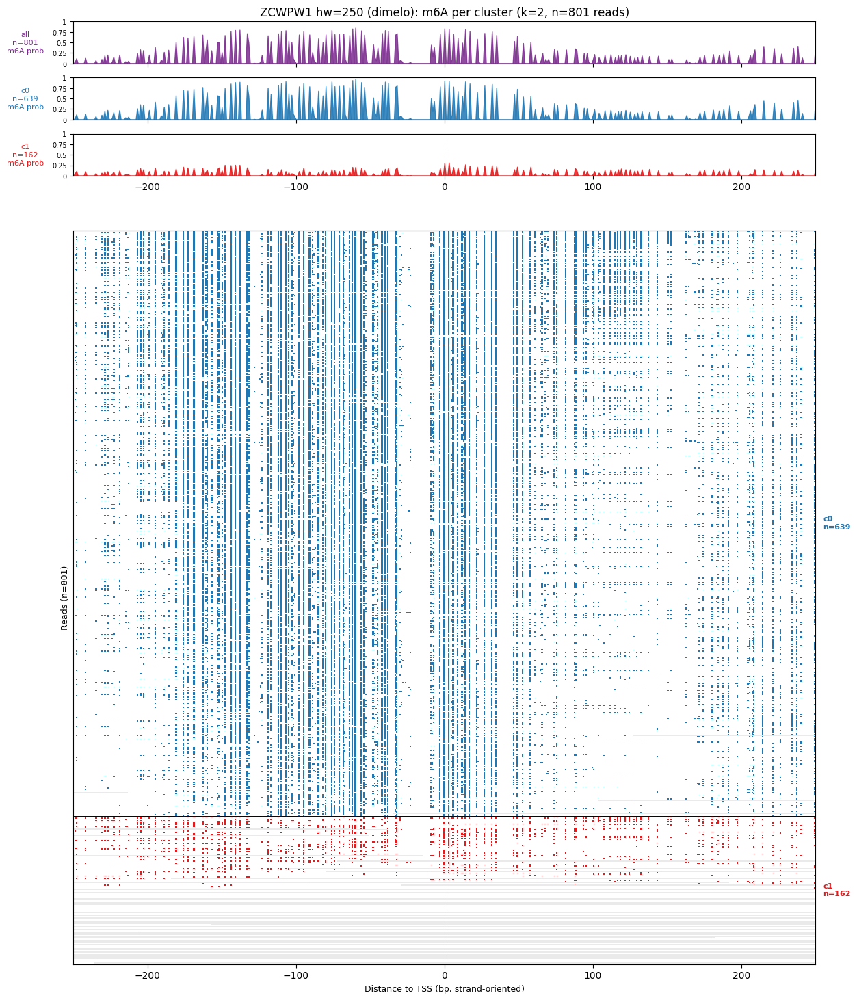

=== ZCWPW1 hw=250 dimelo cluster summary ===
cluster  n_reads  mean_m6a_prob  mean_m6a_calls
     c0      639       0.128658       64.488263
     c1      162       0.036425       12.722222


/home/cshan/ipykernel_3161704/3000874105.py:106: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


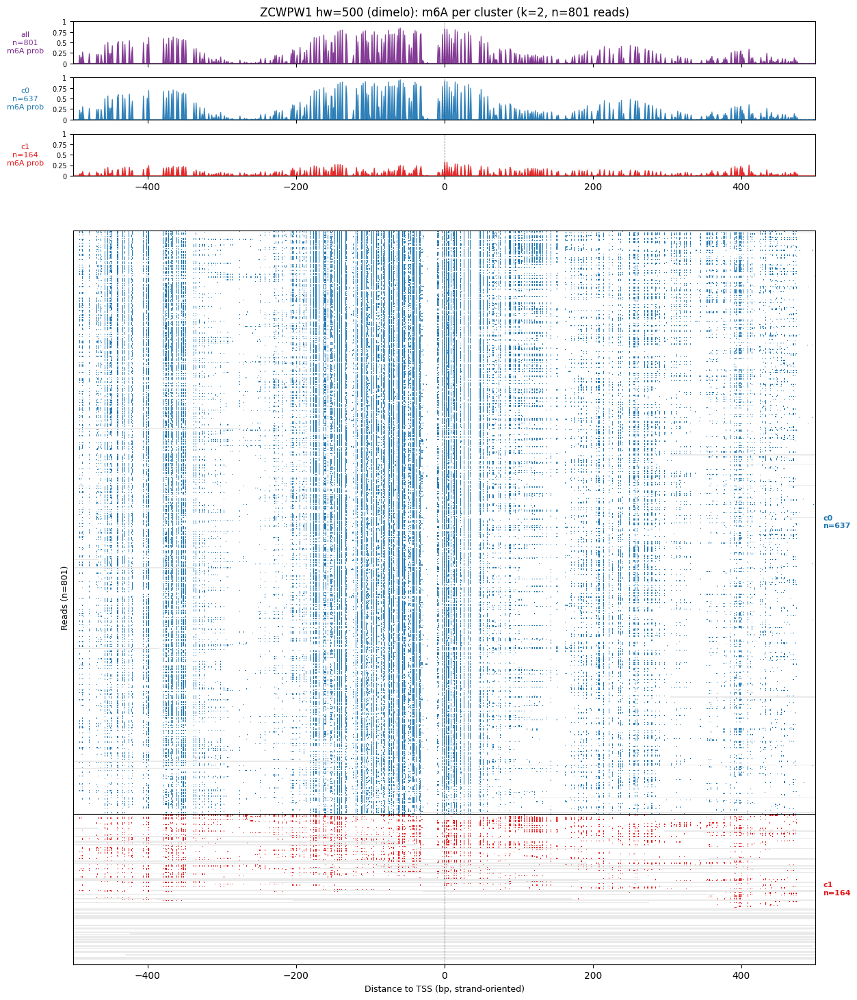

=== ZCWPW1 hw=500 dimelo cluster summary ===
cluster  n_reads  mean_m6a_prob  mean_m6a_calls
     c0      637       0.095153       95.053375
     c1      164       0.032320       23.000000


In [ ]:
import matplotlib.colors as mcolors

CLUSTER_PALETTE = [
    "#1f77b4", "#e41a1c", "#2ca02c", "#9467bd",
    "#ff7f0e", "#17becf", "#8c564b", "#e377c2",
]
UNCOVERED_RGB = (0.92, 0.92, 0.92)
WHITE_RGB     = (1.00, 1.00, 1.00)

def cluster_color(c):
    return CLUSTER_PALETTE[c % len(CLUSTER_PALETTE)]


DIMELO_PLOTS_DIR = DIMELO_OUT_ROOT / 'cluster_plots'
DIMELO_PLOTS_DIR.mkdir(parents=True, exist_ok=True)

def plot_dimelo_cluster_panels(gene_name, hw, info, res):
    X_prob = info['X_prob']
    X_bin  = info['X_bin']
    n_reads, n_pos = X_prob.shape
    positions = np.arange(n_pos) - hw

    best_k = res['best_k']
    labels = res['labels_by_k'][best_k]
    # get the number of clusters and each read's cluster label
    sizes  = {c: int((labels == c).sum()) for c in range(best_k)}

    # count how many reads are in each cluster
    profiles = {c: np.nanmean(X_prob[labels == c], axis=0) for c in range(best_k)}
    # compute the average m6a probability at each position for each cluster for all reads
    overall_profile = np.nanmean(X_prob, axis=0)

    # counts the number of m6A calls (X_bin == 1) for each read, ignoring NaN values, and sorts the reads first by cluster label and then by descending m6A call count within each cluster
    n_mod = np.nansum(X_bin == 1, axis=1)

    # Sorts reads by cluster first, then by m6A-call count descending within each cluster
    order = np.lexsort((-n_mod, labels))
    labels_sorted = labels[order]

    img = np.tile(np.array(UNCOVERED_RGB), (n_reads, n_pos, 1))

    # Marks covered positions as white
    covered = ~np.isnan(X_bin)
    img[covered] = WHITE_RGB

    # for each cluster, colors the positions where X_bin == 1 (m6A calls) for reads in that cluster with a specific color from the cluster palette; 
    # the resulting `img` array has RGB values for each (read, position) that indicate whether it's uncovered (grey), covered unmodified (white), or modified (cluster color)
    for c in range(best_k):
        rgb = mcolors.to_rgb(cluster_color(c))
        mod = (X_bin == 1) & (labels[:, None] == c)
        img[mod] = rgb
    img_sorted = img[order]

    n_top = best_k + 1  # 1 overall + best_k cluster panels
    bot_height = min(14.0, max(3.5, 0.05 * n_reads))
    spacer = 0.5
    fig_height = 0.8 * n_top + bot_height + spacer + 1.0
    fig = plt.figure(figsize=(14, fig_height))
    gs = plt.GridSpec(
        n_top + 2, 1,
        height_ratios=[0.8] * n_top + [spacer] + [bot_height],
        hspace=0.08,
    )
    top_axes = [fig.add_subplot(gs[i]) for i in range(n_top)]
    ax_bot   = fig.add_subplot(gs[n_top + 1], sharex=top_axes[0])

    # Panel 0: overall methylation probability (purple, no clusters)
    ax_all = top_axes[0]
    prof_all = np.where(np.isnan(overall_profile), 0.0, overall_profile)
    ax_all.fill_between(positions, 0, prof_all, color='#7b2d8e', alpha=0.85)
    ax_all.axvline(0, color='black', lw=0.6, ls='--', alpha=0.5)
    ax_all.set_xlim(-hw, hw); ax_all.set_ylim(0, 1)
    ax_all.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
    ax_all.set_yticklabels(['0', '0.25', '0.5', '0.75', '1'], fontsize=7)
    ax_all.set_ylabel(f'all\nn={n_reads}\nm6A prob', fontsize=8,
                      rotation=0, labelpad=28, va='center',
                      color='#7b2d8e')
    ax_all.tick_params(axis='y', which='both', left=True, labelleft=True)
    ax_all.set_title(
        f'{gene_name} hw={hw} (dimelo): m6A per cluster '
        f'(k={best_k}, n={n_reads} reads)')
    plt.setp(ax_all.get_xticklabels(), visible=False)

    # Panels 1..best_k: per-cluster profiles
    for i, c in enumerate(range(best_k)):
        ax = top_axes[i + 1]
        prof = np.where(np.isnan(profiles[c]), 0.0, profiles[c])
        ax.fill_between(positions, 0, prof, color=cluster_color(c), alpha=0.85)
        ax.axvline(0, color='black', lw=0.6, ls='--', alpha=0.5)
        ax.set_xlim(-hw, hw); ax.set_ylim(0, 1)
        ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
        ax.set_yticklabels(['0', '0.25', '0.5', '0.75', '1'], fontsize=7)
        ax.set_ylabel(f'c{c}\nn={sizes[c]}\nm6A prob', fontsize=8,
                      rotation=0, labelpad=28, va='center',
                      color=cluster_color(c))
        ax.tick_params(axis='y', which='both', left=True, labelleft=True)
        if i < best_k - 1:
            plt.setp(ax.get_xticklabels(), visible=False)

    ax_bot.imshow(img_sorted, aspect='auto', interpolation='nearest',
                  extent=[-hw, hw, n_reads, 0])
    ax_bot.axvline(0, color='black', lw=0.6, ls='--', alpha=0.5)
    for b in np.where(np.diff(labels_sorted) != 0)[0] + 1:
        ax_bot.axhline(b, color='black', lw=0.7)
    for c in range(best_k):
        idx = np.where(labels_sorted == c)[0]
        if len(idx):
            y_mid = (idx.min() + idx.max()) / 2
            ax_bot.text(hw * 1.02, y_mid, f'c{c}\nn={sizes[c]}',
                        fontsize=8, va='center',
                        color=cluster_color(c), fontweight='bold')
    ax_bot.set_xlim(-hw, hw); ax_bot.set_yticks([])
    ax_bot.set_ylabel(f'Reads (n={n_reads})', fontsize=9)
    ax_bot.set_xlabel('Distance to TSS (bp, strand-oriented)', fontsize=9)

    plt.tight_layout()
    fig.savefig(DIMELO_PLOTS_DIR / f'{gene_name}_w{hw}_dimelo_cluster_panels.pdf',
                bbox_inches='tight')
    plt.show()

    summary = pd.DataFrame({
        'cluster':       [f'c{c}' for c in range(best_k)],
        'n_reads':       [sizes[c] for c in range(best_k)],
        'mean_m6a_prob': [float(np.nanmean(X_prob[labels == c])) for c in range(best_k)],
        'mean_m6a_calls':[float(np.nansum(X_bin[labels == c] == 1, axis=1).mean())
                          for c in range(best_k)],
    })
    print(f'=== {gene_name} hw={hw} dimelo cluster summary ===')
    print(summary.to_string(index=False))
    summary.to_csv(
        DIMELO_PLOTS_DIR / f'{gene_name}_w{hw}_dimelo_cluster_summary_k{best_k}.tsv',
        sep='\t', index=False,
    )
    pd.DataFrame({
        'read_uid':    info['read_ids'],
        'cluster':     labels,
        'n_m6a_calls': np.nansum(X_bin == 1, axis=1).astype(int),
    }).to_csv(
        DIMELO_PLOTS_DIR / f'{gene_name}_w{hw}_dimelo_read_clusters_k{best_k}.tsv',
        sep='\t', index=False,
    )


for (gene_name, hw), info in dimelo_matrices.items():
    if (gene_name, hw) in dimelo_cluster_results:
        plot_dimelo_cluster_panels(
            gene_name, hw, info, dimelo_cluster_results[(gene_name, hw)])

### Cluster only full-spanning reads

Filter to reads that cover the entire window (no NaN in any position), then re-cluster and plot.

In [10]:
dimelo_spanning_matrices = {}
for (gene_name, hw), info in dimelo_matrices.items():
    X_prob = info['X_prob']
    X_bin  = info['X_bin']
    spanning = ~np.isnan(X_prob).any(axis=1)
    n_span = int(spanning.sum())
    print(f'{gene_name} hw={hw}: {n_span}/{X_prob.shape[0]} reads span the full window')
    if n_span < 4:
        print(f'  too few spanning reads, skipping')
        continue
    read_ids_span = [r for r, s in zip(info['read_ids'], spanning) if s]
    dimelo_spanning_matrices[(gene_name, hw)] = dict(
        read_ids=read_ids_span,
        X_prob=X_prob[spanning],
        X_bin=X_bin[spanning],
    )

dimelo_spanning_cluster_results = {}
for (gene_name, hw), info_span in dimelo_spanning_matrices.items():
    X_prob = info_span['X_prob']
    Xp_binned  = bin_smooth_nanmean(X_prob)
    Xp_cluster = np.where(np.isnan(Xp_binned), 0.0, Xp_binned)

    inertias, sils, labels_by_k = [], [], {}
    for k in K_RANGE:
        if X_prob.shape[0] <= k:
            continue
        km = KMeans(n_clusters=k, n_init=10, random_state=0).fit(Xp_cluster)
        inertias.append(km.inertia_)
        sils.append(silhouette_score(Xp_cluster, km.labels_))
        labels_by_k[k] = km.labels_
    k_ran  = list(labels_by_k.keys())
    best_k = int(k_ran[int(np.argmax(sils))])
    dimelo_spanning_cluster_results[(gene_name, hw)] = dict(
        Xp_binned=Xp_binned, Xp_cluster=Xp_cluster,
        k_range=k_ran, inertias=inertias, silhouettes=sils,
        labels_by_k=labels_by_k, best_k=best_k,
    )
    print(f'\n=== {gene_name} hw={hw} spanning only (n_reads={X_prob.shape[0]}) ===')
    for k, ine, s in zip(k_ran, inertias, sils):
        marker = '  <-- best' if k == best_k else ''
        print(f'  k={k}  inertia={ine:8.2f}  silhouette={s:.3f}{marker}')

ENO1 hw=250: 530/569 reads span the full window
ENO1 hw=500: 525/569 reads span the full window
ZCWPW1 hw=250: 739/801 reads span the full window
ZCWPW1 hw=500: 724/801 reads span the full window



=== ENO1 hw=250 spanning only (n_reads=530) ===
  k=2  inertia=11153.87  silhouette=0.130  <-- best
  k=3  inertia=10196.39  silhouette=0.122
  k=4  inertia= 9698.42  silhouette=0.113
  k=5  inertia= 9319.75  silhouette=0.111
  k=6  inertia= 9063.38  silhouette=0.107
  k=7  inertia= 8878.69  silhouette=0.105
  k=8  inertia= 8732.95  silhouette=0.105
  k=9  inertia= 8562.74  silhouette=0.104

=== ENO1 hw=500 spanning only (n_reads=525) ===
  k=2  inertia=21546.00  silhouette=0.077
  k=3  inertia=20170.46  silhouette=0.071
  k=4  inertia=19172.31  silhouette=0.076
  k=5  inertia=18649.68  silhouette=0.081
  k=6  inertia=18236.17  silhouette=0.085  <-- best
  k=7  inertia=17885.83  silhouette=0.084
  k=8  inertia=17608.25  silhouette=0.078
  k=9  inertia=17328.58  silhouette=0.078

=== ZCWPW1 hw=250 spanning only (n_reads=739) ===
  k=2  inertia=16883.65  silhouette=0.156  <-- best
  k=3  inertia=15389.52  silhouette=0.131
  k=4  inertia=14694.54  silhouette=0.108
  k=5  inertia=14182.41

/home/cshan/ipykernel_3161704/1126732424.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


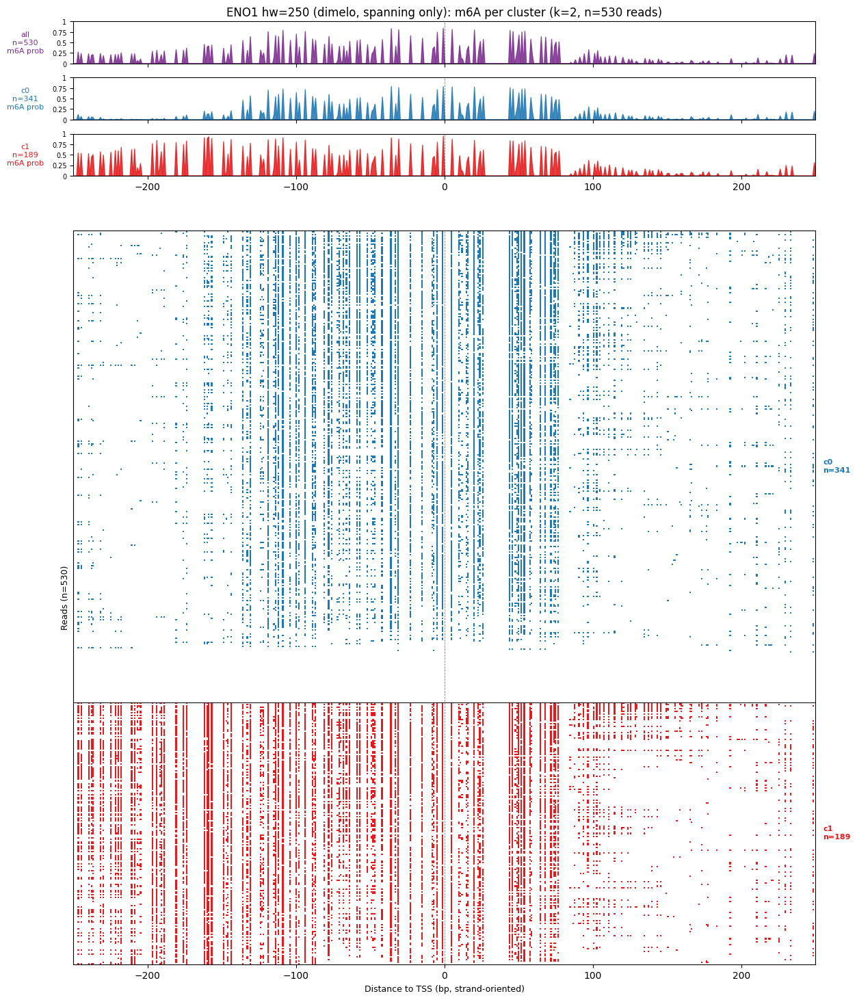

=== ENO1 hw=250 dimelo spanning cluster summary ===
cluster  n_reads  mean_m6a_prob  mean_m6a_calls
     c0      341       0.076069       38.249267
     c1      189       0.129023       64.857143


/home/cshan/ipykernel_3161704/1126732424.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


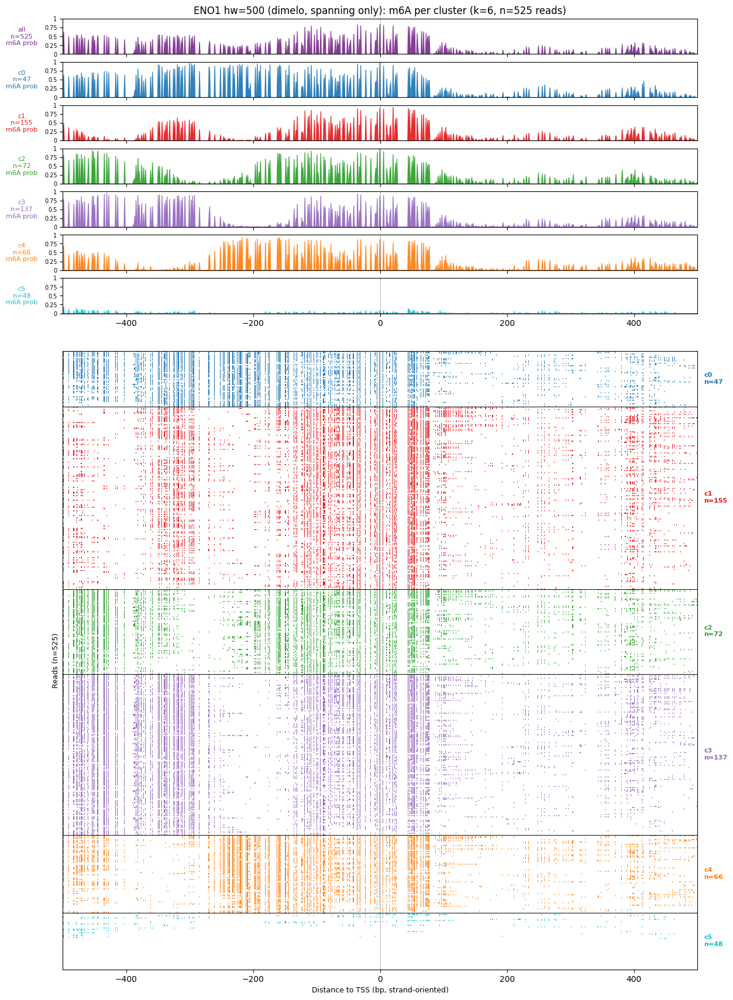

=== ENO1 hw=500 dimelo spanning cluster summary ===
cluster  n_reads  mean_m6a_prob  mean_m6a_calls
     c0       47       0.117540      118.063830
     c1      155       0.073206       73.548387
     c2       72       0.092397       92.819444
     c3      137       0.093353       93.773723
     c4       66       0.090536       90.939394
     c5       48       0.008390        8.437500


/home/cshan/ipykernel_3161704/1126732424.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


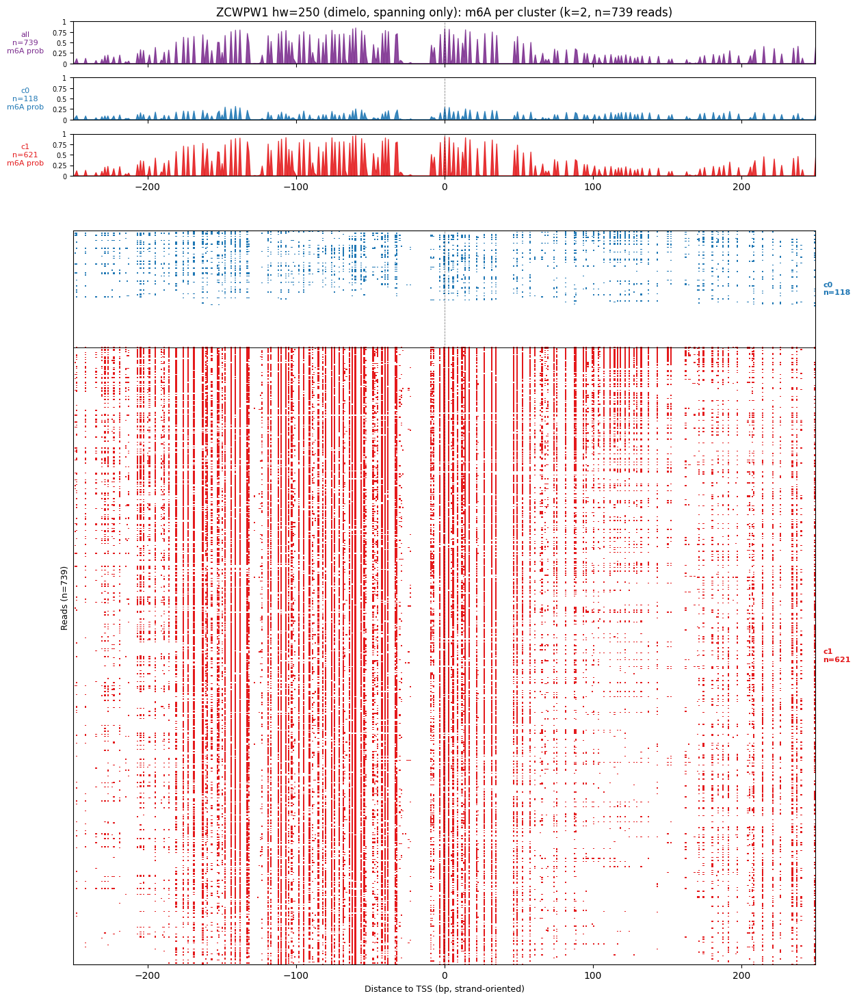

=== ZCWPW1 hw=250 dimelo spanning cluster summary ===
cluster  n_reads  mean_m6a_prob  mean_m6a_calls
     c0      118       0.038658       19.440678
     c1      621       0.129543       65.111111


/home/cshan/ipykernel_3161704/1126732424.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


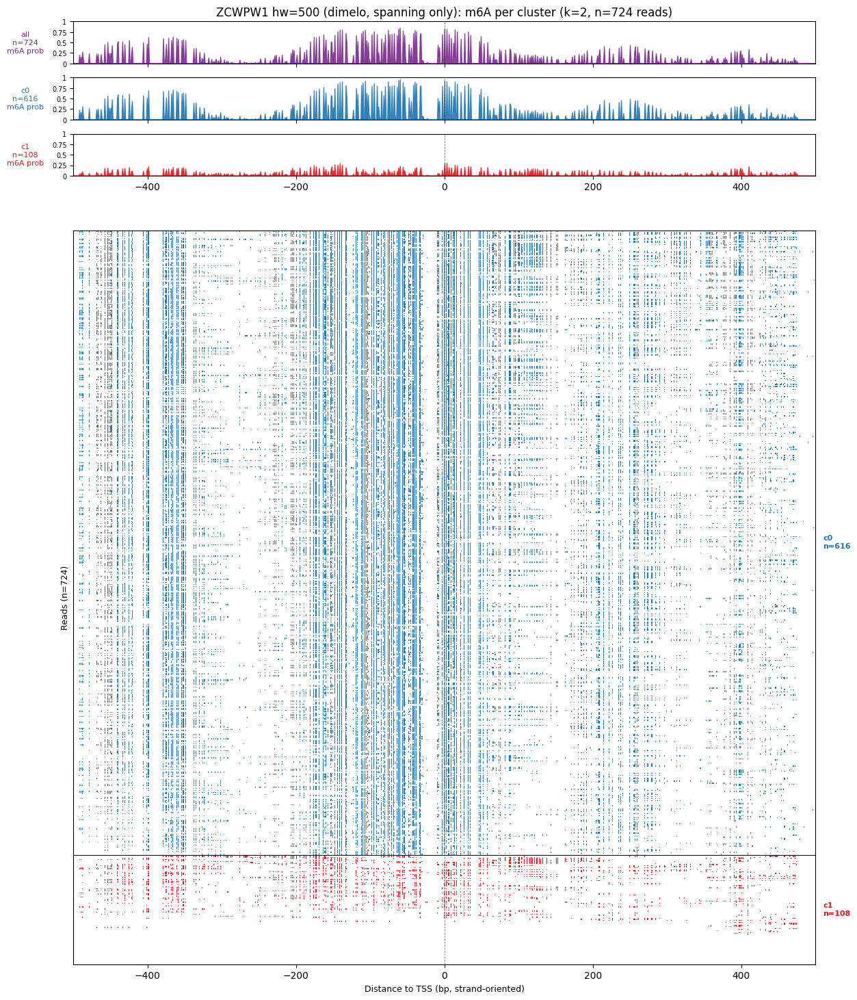

=== ZCWPW1 hw=500 dimelo spanning cluster summary ===
cluster  n_reads  mean_m6a_prob  mean_m6a_calls
     c0      616       0.095121       95.538961
     c1      108       0.029192       29.333333


In [12]:
def plot_cluster_panels(gene_name, hw, X_prob, X_bin, read_ids, labels, best_k,
                        output_dir, file_tag, title_suffix=''):
    """Generic cluster panel plot. Reusable for any matrix / clustering combo.

    Parameters
    ----------
    X_prob : (n_reads, n_pos) float -- used for the top profile panels (nanmean per cluster).
    X_bin  : (n_reads, n_pos) float in {0,1,NaN} -- used for heatmap coloring.
    labels : (n_reads,) int -- cluster assignments.
    output_dir : Path -- directory for PDFs / TSVs.
    file_tag   : str  -- inserted into filenames, e.g. 'spanning' or 'spanning_binary'.
    title_suffix : str -- appended to the plot title.
    """
    n_reads, n_pos = X_prob.shape
    positions = np.arange(n_pos) - hw
    sizes = {c: int((labels == c).sum()) for c in range(best_k)}

    profiles = {c: np.nanmean(X_prob[labels == c], axis=0) for c in range(best_k)}
    overall_profile = np.nanmean(X_prob, axis=0)

    n_mod = np.nansum(X_bin == 1, axis=1)
    order = np.lexsort((-n_mod, labels))
    labels_sorted = labels[order]

    img = np.tile(np.array(UNCOVERED_RGB), (n_reads, n_pos, 1))
    covered = ~np.isnan(X_bin)
    img[covered] = WHITE_RGB
    for c in range(best_k):
        rgb = mcolors.to_rgb(cluster_color(c))
        mod = (X_bin == 1) & (labels[:, None] == c)
        img[mod] = rgb
    img_sorted = img[order]

    n_top = best_k + 1
    bot_height = min(14.0, max(3.5, 0.05 * n_reads))
    spacer = 0.5
    fig_height = 0.8 * n_top + bot_height + spacer + 1.0
    fig = plt.figure(figsize=(14, fig_height))
    gs = plt.GridSpec(
        n_top + 2, 1,
        height_ratios=[0.8] * n_top + [spacer] + [bot_height],
        hspace=0.08,
    )
    top_axes = [fig.add_subplot(gs[i]) for i in range(n_top)]
    ax_bot   = fig.add_subplot(gs[n_top + 1], sharex=top_axes[0])

    ax_all = top_axes[0]
    prof_all = np.where(np.isnan(overall_profile), 0.0, overall_profile)
    ax_all.fill_between(positions, 0, prof_all, color='#7b2d8e', alpha=0.85)
    ax_all.axvline(0, color='black', lw=0.6, ls='--', alpha=0.5)
    ax_all.set_xlim(-hw, hw); ax_all.set_ylim(0, 1)
    ax_all.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
    ax_all.set_yticklabels(['0', '0.25', '0.5', '0.75', '1'], fontsize=7)
    ax_all.set_ylabel(f'all\nn={n_reads}\nm6A prob', fontsize=8,
                      rotation=0, labelpad=28, va='center', color='#7b2d8e')
    ax_all.tick_params(axis='y', which='both', left=True, labelleft=True)
    ax_all.set_title(
        f'{gene_name} hw={hw} (dimelo{title_suffix}): m6A per cluster '
        f'(k={best_k}, n={n_reads} reads)')
    plt.setp(ax_all.get_xticklabels(), visible=False)

    for i, c in enumerate(range(best_k)):
        ax = top_axes[i + 1]
        prof = np.where(np.isnan(profiles[c]), 0.0, profiles[c])
        ax.fill_between(positions, 0, prof, color=cluster_color(c), alpha=0.85)
        ax.axvline(0, color='black', lw=0.6, ls='--', alpha=0.5)
        ax.set_xlim(-hw, hw); ax.set_ylim(0, 1)
        ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
        ax.set_yticklabels(['0', '0.25', '0.5', '0.75', '1'], fontsize=7)
        ax.set_ylabel(f'c{c}\nn={sizes[c]}\nm6A prob', fontsize=8,
                      rotation=0, labelpad=28, va='center',
                      color=cluster_color(c))
        ax.tick_params(axis='y', which='both', left=True, labelleft=True)
        if i < best_k - 1:
            plt.setp(ax.get_xticklabels(), visible=False)

    ax_bot.imshow(img_sorted, aspect='auto', interpolation='nearest',
                  extent=[-hw, hw, n_reads, 0])
    ax_bot.axvline(0, color='black', lw=0.6, ls='--', alpha=0.5)
    for b in np.where(np.diff(labels_sorted) != 0)[0] + 1:
        ax_bot.axhline(b, color='black', lw=0.7)
    for c in range(best_k):
        idx = np.where(labels_sorted == c)[0]
        if len(idx):
            y_mid = (idx.min() + idx.max()) / 2
            ax_bot.text(hw * 1.02, y_mid, f'c{c}\nn={sizes[c]}',
                        fontsize=8, va='center',
                        color=cluster_color(c), fontweight='bold')
    ax_bot.set_xlim(-hw, hw); ax_bot.set_yticks([])
    ax_bot.set_ylabel(f'Reads (n={n_reads})', fontsize=9)
    ax_bot.set_xlabel('Distance to TSS (bp, strand-oriented)', fontsize=9)

    plt.tight_layout()
    fig.savefig(output_dir / f'{gene_name}_w{hw}_dimelo_{file_tag}_cluster_panels.pdf',
                bbox_inches='tight')
    plt.show()

    summary = pd.DataFrame({
        'cluster':       [f'c{c}' for c in range(best_k)],
        'n_reads':       [sizes[c] for c in range(best_k)],
        'mean_m6a_prob': [float(np.nanmean(X_prob[labels == c])) for c in range(best_k)],
        'mean_m6a_calls':[float(np.nansum(X_bin[labels == c] == 1, axis=1).mean())
                          for c in range(best_k)],
    })
    print(f'=== {gene_name} hw={hw} dimelo {file_tag} cluster summary ===')
    print(summary.to_string(index=False))
    summary.to_csv(
        output_dir / f'{gene_name}_w{hw}_dimelo_{file_tag}_cluster_summary_k{best_k}.tsv',
        sep='\t', index=False,
    )
    pd.DataFrame({
        'read_uid':    read_ids,
        'cluster':     labels,
        'n_m6a_calls': np.nansum(X_bin == 1, axis=1).astype(int),
    }).to_csv(
        output_dir / f'{gene_name}_w{hw}_dimelo_{file_tag}_read_clusters_k{best_k}.tsv',
        sep='\t', index=False,
    )


# --- Plot spanning reads clustered on continuous probability ---
DIMELO_SPANNING_PLOTS_DIR = DIMELO_OUT_ROOT / 'cluster_plots_spanning'
DIMELO_SPANNING_PLOTS_DIR.mkdir(parents=True, exist_ok=True)

for (gene_name, hw), info_span in dimelo_spanning_matrices.items():
    if (gene_name, hw) in dimelo_spanning_cluster_results:
        res = dimelo_spanning_cluster_results[(gene_name, hw)]
        plot_cluster_panels(
            gene_name, hw,
            X_prob=info_span['X_prob'], X_bin=info_span['X_bin'],
            read_ids=info_span['read_ids'],
            labels=res['labels_by_k'][res['best_k']], best_k=res['best_k'],
            output_dir=DIMELO_SPANNING_PLOTS_DIR,
            file_tag='spanning', title_suffix=', spanning only')

### Cluster spanning reads on binary m6A matrix

Binarize each position per read: probability > 0.9 → 1 (methylated), else 0.
Then k-means on this binary matrix for spanning reads only.


=== ENO1 hw=250 spanning binary (n_reads=530) ===
  k=2  inertia=11239.51  silhouette=0.130  <-- best
  k=3  inertia=10275.81  silhouette=0.122
  k=4  inertia= 9775.00  silhouette=0.113
  k=5  inertia= 9394.32  silhouette=0.111
  k=6  inertia= 9138.04  silhouette=0.106
  k=7  inertia= 8950.41  silhouette=0.105
  k=8  inertia= 8769.28  silhouette=0.103
  k=9  inertia= 8627.50  silhouette=0.104


/home/cshan/ipykernel_2718308/1126732424.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


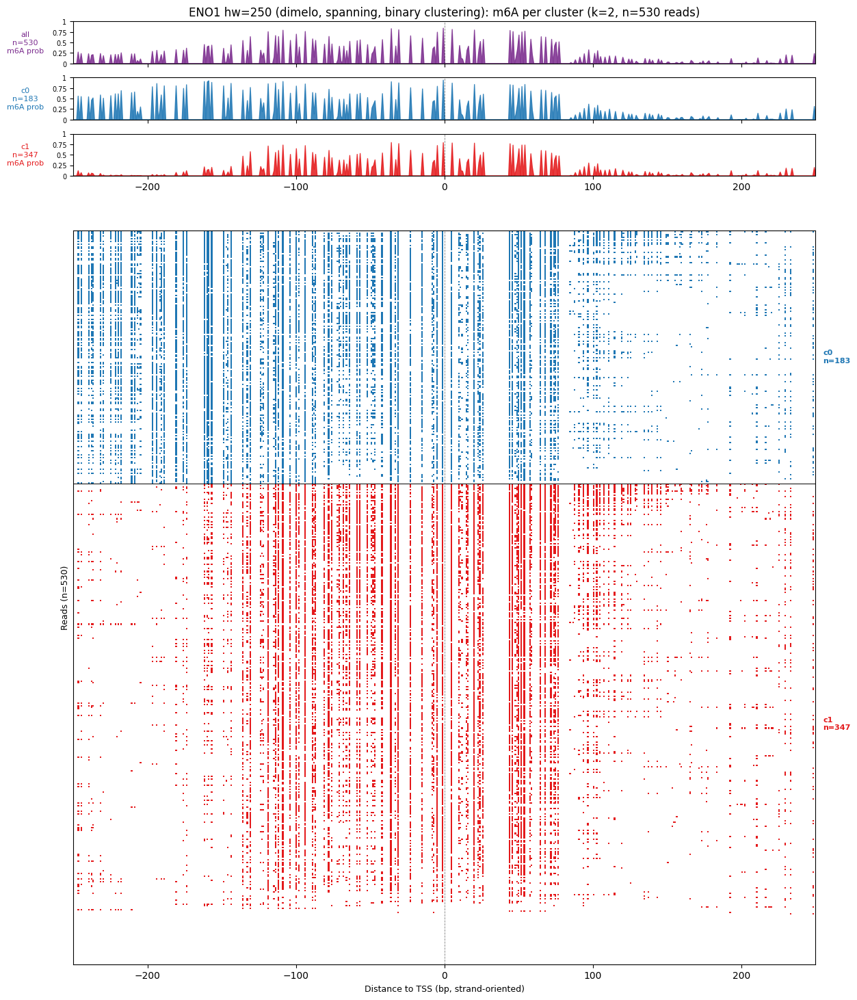

=== ENO1 hw=250 dimelo spanning_binary cluster summary ===
cluster  n_reads  mean_m6a_prob  mean_m6a_calls
     c0      183       0.129188       64.939891
     c1      347       0.076898       38.665706

=== ENO1 hw=500 spanning binary (n_reads=525) ===
  k=2  inertia=21709.88  silhouette=0.076
  k=3  inertia=20331.37  silhouette=0.071
  k=4  inertia=19321.49  silhouette=0.076
  k=5  inertia=18790.87  silhouette=0.082
  k=6  inertia=18380.40  silhouette=0.085  <-- best
  k=7  inertia=18026.16  silhouette=0.084
  k=8  inertia=17751.17  silhouette=0.077
  k=9  inertia=17483.43  silhouette=0.078


/home/cshan/ipykernel_2718308/1126732424.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


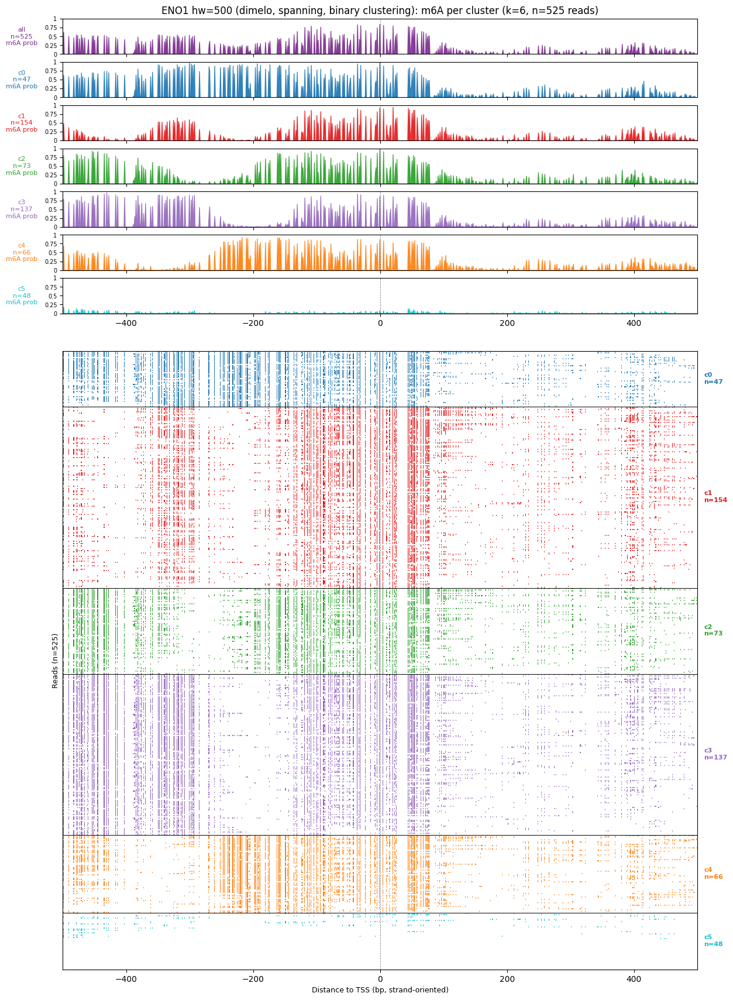

=== ENO1 hw=500 dimelo spanning_binary cluster summary ===
cluster  n_reads  mean_m6a_prob  mean_m6a_calls
     c0       47       0.117540      118.063830
     c1      154       0.073016       73.357143
     c2       73       0.092536       92.958904
     c3      137       0.093353       93.773723
     c4       66       0.090536       90.939394
     c5       48       0.008390        8.437500

=== ZCWPW1 hw=250 spanning binary (n_reads=739) ===
  k=2  inertia=17008.25  silhouette=0.156  <-- best
  k=3  inertia=15504.69  silhouette=0.131
  k=4  inertia=14806.11  silhouette=0.108
  k=5  inertia=14291.28  silhouette=0.105
  k=6  inertia=13996.78  silhouette=0.092
  k=7  inertia=13795.08  silhouette=0.087
  k=8  inertia=13603.73  silhouette=0.082
  k=9  inertia=13423.45  silhouette=0.084


/home/cshan/ipykernel_2718308/1126732424.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


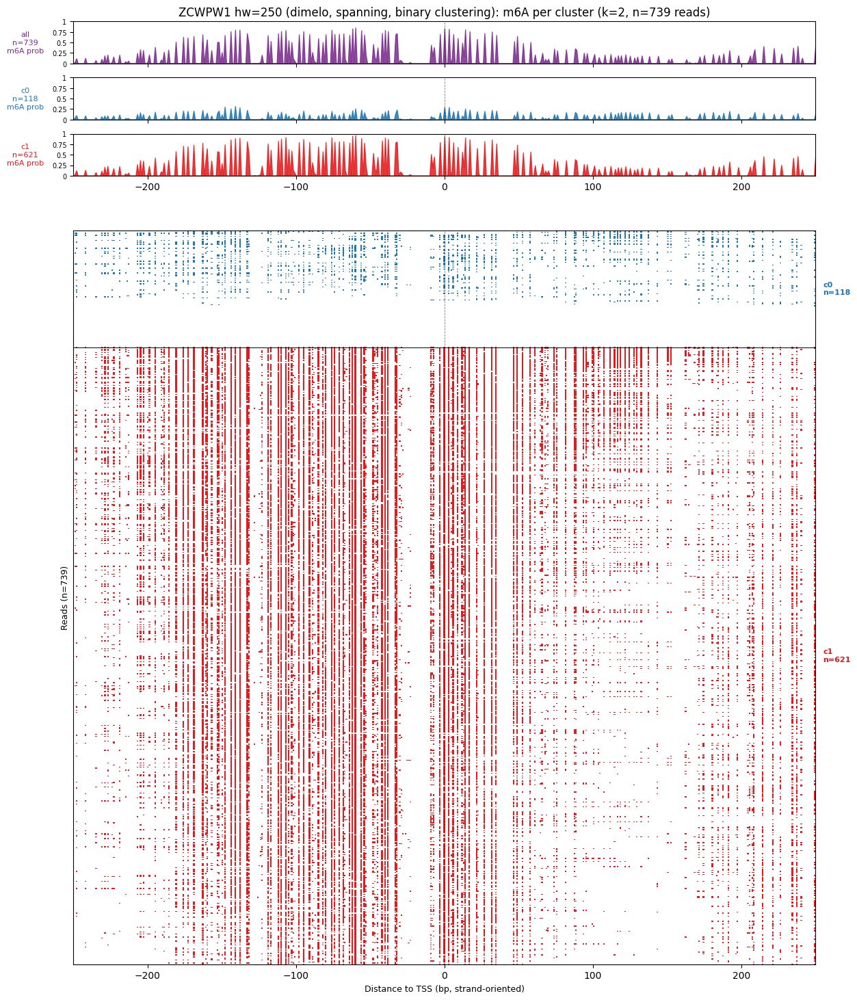

=== ZCWPW1 hw=250 dimelo spanning_binary cluster summary ===
cluster  n_reads  mean_m6a_prob  mean_m6a_calls
     c0      118       0.038658       19.440678
     c1      621       0.129543       65.111111

=== ZCWPW1 hw=500 spanning binary (n_reads=724) ===
  k=2  inertia=29382.75  silhouette=0.098  <-- best
  k=3  inertia=27832.78  silhouette=0.086
  k=4  inertia=26911.42  silhouette=0.081
  k=5  inertia=26283.18  silhouette=0.078
  k=6  inertia=25861.08  silhouette=0.074
  k=7  inertia=25541.57  silhouette=0.073
  k=8  inertia=25246.60  silhouette=0.069
  k=9  inertia=25018.68  silhouette=0.068


/home/cshan/ipykernel_2718308/1126732424.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


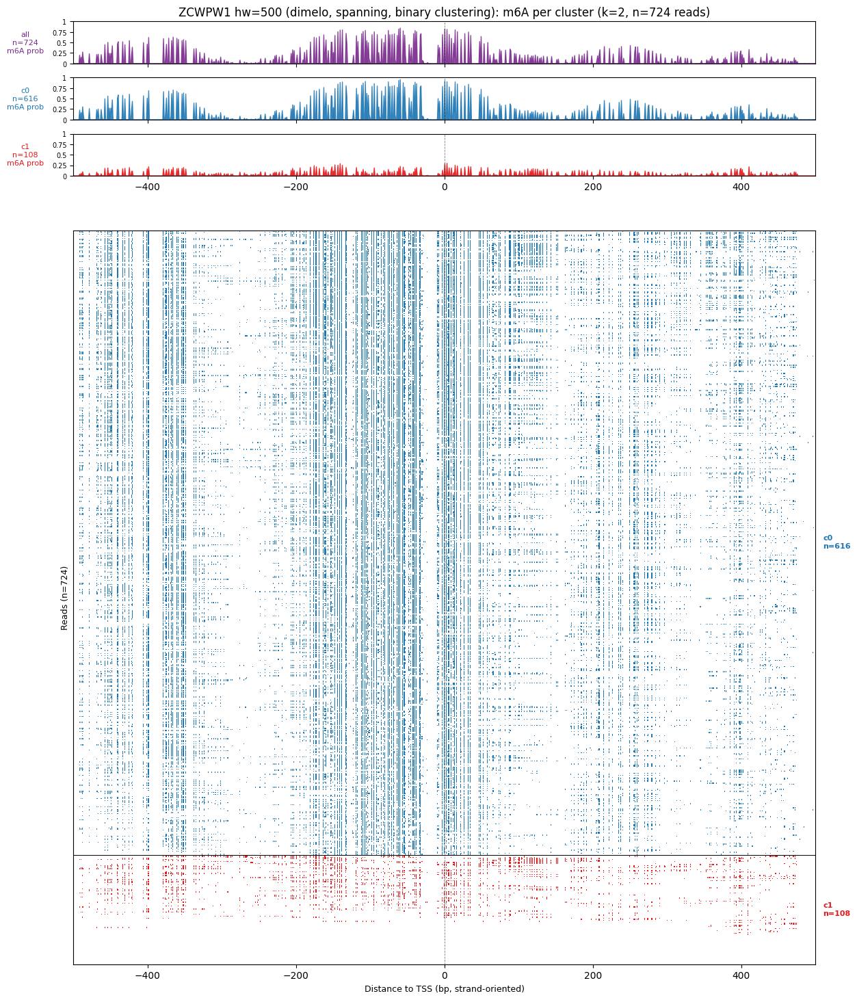

=== ZCWPW1 hw=500 dimelo spanning_binary cluster summary ===
cluster  n_reads  mean_m6a_prob  mean_m6a_calls
     c0      616       0.095121       95.538961
     c1      108       0.029192       29.333333


In [ ]:
dimelo_spanning_binary_cluster_results = {}
DIMELO_SPANNING_BINARY_PLOTS_DIR = DIMELO_OUT_ROOT / 'cluster_plots_spanning_binary'
DIMELO_SPANNING_BINARY_PLOTS_DIR.mkdir(parents=True, exist_ok=True)

for (gene_name, hw), info_span in dimelo_spanning_matrices.items():
    X_prob = info_span['X_prob']
    X_bin  = info_span['X_bin']
    n_reads = X_prob.shape[0]
    if n_reads < 4:
        print(f'{gene_name} hw={hw}: only {n_reads} spanning reads, skipping binary clustering')
        continue

    # Binarize: prob > 0.9 -> 1, else 0 (no NaN for spanning reads)
    X_binary = (X_prob > 0.9).astype(np.float32)

    Xb_binned  = bin_smooth_nanmean(X_binary)
    # replace any remaining NaN (shouldn't be any for spanning reads) with 0.0 just in case
    Xb_cluster = np.where(np.isnan(Xb_binned), 0.0, Xb_binned)

# Cluster the binary matrix and plot panels
    inertias, sils, labels_by_k = [], [], {}
    for k in K_RANGE:
        if n_reads <= k:
            continue
        km = KMeans(n_clusters=k, n_init=10, random_state=0).fit(Xb_cluster)
        inertias.append(km.inertia_)
        sils.append(silhouette_score(Xb_cluster, km.labels_))
        labels_by_k[k] = km.labels_
    k_ran  = list(labels_by_k.keys())
    best_k = int(k_ran[int(np.argmax(sils))])
    dimelo_spanning_binary_cluster_results[(gene_name, hw)] = dict(
        Xb_binned=Xb_binned, Xb_cluster=Xb_cluster,
        k_range=k_ran, inertias=inertias, silhouettes=sils,
        labels_by_k=labels_by_k, best_k=best_k,
    )
    print(f'\n=== {gene_name} hw={hw} spanning binary (n_reads={n_reads}) ===')
    for k, ine, s in zip(k_ran, inertias, sils):
        marker = '  <-- best' if k == best_k else ''
        print(f'  k={k}  inertia={ine:8.2f}  silhouette={s:.3f}{marker}')

    # Plot using the generic function
    res = dimelo_spanning_binary_cluster_results[(gene_name, hw)]
    plot_cluster_panels(
        gene_name, hw,
        X_prob=info_span['X_prob'], X_bin=X_binary,
        read_ids=info_span['read_ids'],
        labels=res['labels_by_k'][best_k], best_k=best_k,
        output_dir=DIMELO_SPANNING_BINARY_PLOTS_DIR,
        file_tag='spanning_binary',
        title_suffix=', spanning, binary clustering')

# Cluster reads by nucleosome positioning features

### 1. FIRE_nucleosome data loading.

Pulls FIRE_nucleosome footprints (default length range 140-160 bp, configurable via `FIRE_NUC_LENGTH_RANGE`) from the precomputed indexed BED summaries used by `plot_polii_footprints_precomputed_sort.py`, for the gene TSSes already resolved into `gene_info`. The window is `+/-NUC_HALF_WINDOW` bp - default 500 bp; change `NUC_HALF_WINDOWS` to add or substitute sizes.

**Only reads with at least one length-filtered FIRE_nuc footprint inside the window are kept.** Reads with no FIRE_nuc calls in the window are skipped entirely - they do not enter `nuc_features`, do not get a cluster label, and are never drawn. The genomic alignment span (`r_start`, `r_end`, estimated from min/max over all footprint classes) is stored on each row so the plot can grey-fill outside the alignment.

For each kept read:
- Record `r_start`, `r_end` (genomic span of the read's footprints).
- Convert each FIRE_nuc footprint to strand-aware TSS-relative coords `(rs, re)` via `_relative_interval_to_tss`.
- **+1 / -1 detection matches the plot script's `sort_mode="plus1"` + `plot_mode="edge"`:** a nuc is a +1 candidate iff `re > 0`, a -1 candidate iff `rs < 0`. A TSS-straddler (`rs < 0 < re`) qualifies as **both** +1 and -1. Anchors are the strand-aware far edges:
  - `d_plus1  = min(re)` over nucs with `re > 0`
  - `d_minus1 = max(rs)` over nucs with `rs < 0`
  - `ndr_width = d_plus1 - d_minus1`
- Flag `has_plus1`, `has_minus1`, `tss_covered`, count `n_nucs`.


In [13]:
import sys
sys.path.insert(0, "/project/spott/cshan/fiber-seq/code/PolII_footprints_code")
from plot_polii_footprints_precomputed_sort import (
    collect_reads_from_indexed_beds,
    _filter_fire_nucleosome_by_length,
    _relative_interval_to_tss,
    DEFAULT_FP_BED_DIR,
    DEFAULT_FIRE_NUC_LENGTH_RANGE,
)

NUC_HALF_WINDOWS      = [500]
FIRE_NUC_LENGTH_RANGE = DEFAULT_FIRE_NUC_LENGTH_RANGE

NUC_OUT_ROOT = Path(
    "/project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FIRE_nuc/"
    "31samples_pooled"
)
NUC_OUT_ROOT.mkdir(parents=True, exist_ok=True)

print(f"FIRE_nuc BED dir : {DEFAULT_FP_BED_DIR}")
print(f"Half-windows     : {NUC_HALF_WINDOWS}")
print(f"FIRE_nuc length  : {FIRE_NUC_LENGTH_RANGE}")
print(f"Output dir       : {NUC_OUT_ROOT}\n")

# Only reads with at least one length-filtered FIRE_nuc footprint inside the
# window are kept - reads with no FIRE_nuc calls are excluded from every
# downstream step (feature table, k-means, plots).
nuc_features = {}
for _, g in gene_info.iterrows():
    gene_name = g["gene_name"]
    chrom     = g["chrom"]
    strand    = g["strand"]
    tss       = int(g["tss_anchor"])
    for hw in NUC_HALF_WINDOWS:
        view_start = max(0, tss - hw)
        view_end   = tss + hw

        read_spans = collect_reads_from_indexed_beds(
            chrom, view_start, view_end,
            fp_class="all", beds_dir=DEFAULT_FP_BED_DIR,
        )
        reads_fire = collect_reads_from_indexed_beds(
            chrom, view_start, view_end,
            fp_class="FIRE_nucleosome", beds_dir=DEFAULT_FP_BED_DIR,
        )
        reads_fire = _filter_fire_nucleosome_by_length(reads_fire, FIRE_NUC_LENGTH_RANGE)

        rows = []
        for read_name, span_fps in read_spans.items():
            fire_fps = reads_fire.get(read_name, [])
            if not fire_fps:
                # Skip reads with no length-filtered FIRE_nuc footprints
                continue

            r_start = min(fp[0] for fp in span_fps)
            r_end   = max(fp[1] for fp in span_fps)

            rel_intervals = [
                _relative_interval_to_tss(fp[0], fp[1], tss, strand)
                for fp in fire_fps
            ]
            rel_intervals = [(rs, re) for (rs, re) in rel_intervals if re > -hw and rs < hw]
            if not rel_intervals:
                continue

            downstream_re = [re for (rs, re) in rel_intervals if re > 0]
            upstream_rs   = [rs for (rs, re) in rel_intervals if rs < 0]
            d_plus1    = min(downstream_re) if downstream_re else np.nan
            d_minus1   = max(upstream_rs)   if upstream_rs   else np.nan
            ndr_width  = (d_plus1 - d_minus1) if (downstream_re and upstream_rs) else np.nan
            tss_covered = any(rs <= 0 <= re for (rs, re) in rel_intervals)

            rows.append(dict(
                read_id=read_name,
                r_start=r_start,
                r_end=r_end,
                n_nucs=len(rel_intervals),
                has_plus1=int(bool(downstream_re)),
                has_minus1=int(bool(upstream_rs)),
                tss_covered=int(tss_covered),
                d_plus1=d_plus1,
                d_minus1=d_minus1,
                ndr_width=ndr_width,
            ))

        df = pd.DataFrame(rows)
        nuc_features[(gene_name, hw)] = df

        n_total   = len(df)
        n_both    = int(((df["has_plus1"] == 1) & (df["has_minus1"] == 1)).sum())
        n_plus1   = int(((df["has_plus1"] == 1) & (df["has_minus1"] == 0)).sum())
        n_minus1  = int(((df["has_plus1"] == 0) & (df["has_minus1"] == 1)).sum())
        n_neither = int(((df["has_plus1"] == 0) & (df["has_minus1"] == 0)).sum())

        pct = lambda x: 100 * x / max(n_total, 1)
        print(f"=== {gene_name} hw={hw} ===")
        print(f"  reads with >=1 FIRE_nuc in window : {n_total}")
        print(f"  B11 (both +1 and -1)              : {n_both}  ({pct(n_both):.1f}%)")
        print(f"  B01 (only +1)                     : {n_plus1}  ({pct(n_plus1):.1f}%)")
        print(f"  B10 (only -1)                     : {n_minus1}  ({pct(n_minus1):.1f}%)")
        print(f"  B00 (TSS-straddler only)          : {n_neither}  ({pct(n_neither):.1f}%)")
        print(f"  TSS covered by a FIRE_nuc         : {int(df['tss_covered'].sum())}")
        if df["has_plus1"].sum():
            v = df.loc[df["has_plus1"] == 1, "d_plus1"]
            print(f"  d_plus1   median (q25, q75)       : {v.median():.0f}  ({v.quantile(0.25):.0f}, {v.quantile(0.75):.0f})")
        if df["has_minus1"].sum():
            v = df.loc[df["has_minus1"] == 1, "d_minus1"]
            print(f"  d_minus1  median (q25, q75)       : {v.median():.0f}  ({v.quantile(0.25):.0f}, {v.quantile(0.75):.0f})")
        if n_both:
            v = df.loc[(df["has_plus1"] == 1) & (df["has_minus1"] == 1), "ndr_width"]
            print(f"  ndr_width median (q25, q75)       : {v.median():.0f}  ({v.quantile(0.25):.0f}, {v.quantile(0.75):.0f})")

        out_tsv = NUC_OUT_ROOT / f"{gene_name}_w{hw}_fire_nuc_features.tsv.gz"
        df.to_csv(out_tsv, sep="\t", index=False, compression="gzip")
        print(f"  wrote: {out_tsv}\n")


FIRE_nuc BED dir : /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds
Half-windows     : [500]
FIRE_nuc length  : (140, 160)
Output dir       : /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FIRE_nuc/31samples_pooled



[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi


=== ENO1 hw=500 ===
  reads with >=1 FIRE_nuc in window : 351
  B11 (both +1 and -1)              : 71  (20.2%)
  B01 (only +1)                     : 195  (55.6%)
  B10 (only -1)                     : 85  (24.2%)
  B00 (TSS-straddler only)          : 0  (0.0%)
  TSS covered by a FIRE_nuc         : 0
  d_plus1   median (q25, q75)       : 348  (233, 551)
  d_minus1  median (q25, q75)       : -348  (-491, -293)
  ndr_width median (q25, q75)       : 816  (630, 976)
  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FIRE_nuc/31samples_pooled/ENO1_w500_fire_nuc_features.tsv.gz



[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi


=== ZCWPW1 hw=500 ===
  reads with >=1 FIRE_nuc in window : 625
  B11 (both +1 and -1)              : 234  (37.4%)
  B01 (only +1)                     : 237  (37.9%)
  B10 (only -1)                     : 154  (24.6%)
  B00 (TSS-straddler only)          : 0  (0.0%)
  TSS covered by a FIRE_nuc         : 13
  d_plus1   median (q25, q75)       : 284  (205, 446)
  d_minus1  median (q25, q75)       : -349  (-520, -324)
  ndr_width median (q25, q75)       : 714  (529, 840)
  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FIRE_nuc/31samples_pooled/ZCWPW1_w500_fire_nuc_features.tsv.gz



[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi


### 2. Pure k-means on FIRE_nuc feature

Single-stage clustering across **every read** in `nuc_features` (no span filter, no separate spanning/non-spanning sets). The missingness is encoded into the feature vector so k-means can discover the bucket structure (B11 / B01 / B10 / B00) on its own and split B11 further if there is continuous geometry. Reads with partial alignment coverage of the window participate in clustering with the same feature scheme - they tend to land in lower-`n_nucs` / boundary buckets because they cannot observe nucs in the uncovered region.

Feature vector per read:
- `d_plus1`   - strand-aware **far/3' edge** of the +1 nuc (matches `plot_mode="edge"` anchor); **NaN -> `+hw`** 
- `d_minus1`  - strand-aware **far/5' edge** of the -1 nuc; **NaN -> `-hw`**
- `ndr_width` - `d_plus1 - d_minus1`; **NaN -> `2*hw`**
- `n_nucs`    - count of FIRE_nucs in window
- `has_plus1` - indicator (0/1) that disambiguates "real edge at boundary" from "no nuc detected"
- `has_minus1` - same on the upstream side
- `tss_covered` - indicator that a nuc spans position 0 (straddlers also set `has_plus1=has_minus1=1`, so this stays informative)

Steps: z-score each feature, run `KMeans(n_clusters=k, n_init=10)` for `k in NUC_K_RANGE` (default `2..7`), pick `k` by silhouette. Save labels and a per-read TSV. The trailing summary prints the **unscaled** per-cluster mean of every feature so you can read off which cluster corresponds to which bucket.

`nuc_cluster_results[(gene, hw)]["df"]` holds the post-imputation feature table for every read - the plot cells use this directly.



=== ENO1 hw=500  (n_reads=351) ===
  k=2  inertia= 1367.73  silhouette=0.429
  k=3  inertia=  829.96  silhouette=0.518
  k=4  inertia=  620.93  silhouette=0.474
  k=5  inertia=  494.67  silhouette=0.490
  k=6  inertia=  394.65  silhouette=0.550
  k=7  inertia=  302.62  silhouette=0.573  <-- best


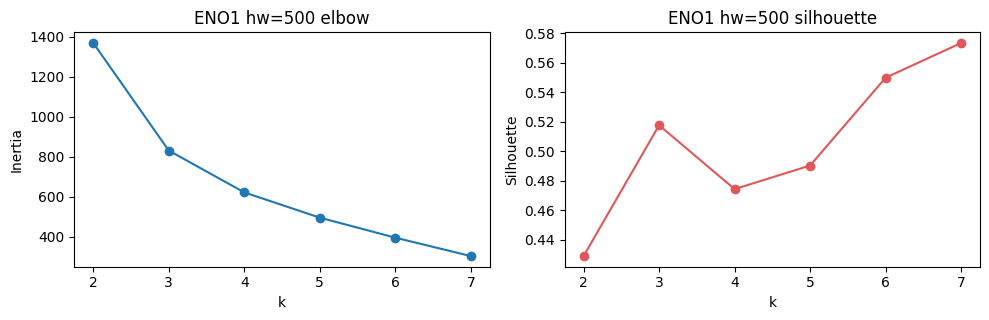


=== ZCWPW1 hw=500  (n_reads=625) ===
  k=2  inertia= 3026.51  silhouette=0.377
  k=3  inertia= 2060.80  silhouette=0.457
  k=4  inertia= 1282.72  silhouette=0.500
  k=5  inertia= 1008.77  silhouette=0.497
  k=6  inertia=  793.34  silhouette=0.496
  k=7  inertia=  638.84  silhouette=0.511  <-- best


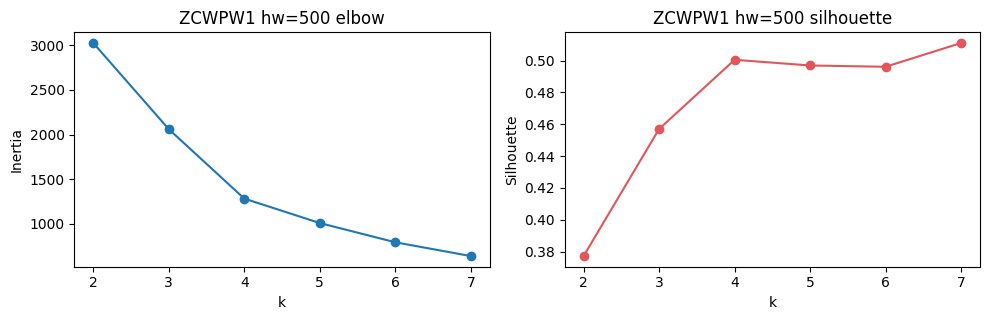


=== Per-cluster mean of (unscaled) features ===

ENO1 hw=500  (best_k=7)
         n_reads  d_plus1  d_minus1  ndr_width  n_nucs  has_plus1  has_minus1  tss_covered
cluster                                                                                   
0             30    571.2    -434.5     1005.7     2.2        1.0         1.0          0.0
1             60    283.4    -510.9      968.3     2.2        1.0         0.2          0.0
2             35    500.0    -492.3     1000.0     1.0        0.0         1.0          0.0
3             87    280.3    -500.0     1000.0     1.0        1.0         0.0          0.0
4             30    276.5    -323.3      599.8     2.5        1.0         1.0          0.0
5             59    548.9    -500.0     1000.0     1.0        1.0         0.0          0.0
6             50    500.0    -302.4     1000.0     1.1        0.0         1.0          0.0

ZCWPW1 hw=500  (best_k=7)
         n_reads  d_plus1  d_minus1  ndr_width  n_nucs  has_plus1  has_minus1  t

In [4]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, leaves_list

NUC_K_RANGE = list(range(2, 8))   # k = 2..7

NUC_FEATURES = [
    "d_plus1", "d_minus1", "ndr_width",
    "n_nucs", "has_plus1", "has_minus1", "tss_covered",
]

nuc_cluster_results = {}

for (gene_name, hw), df in nuc_features.items():
    df = df.copy()
    if len(df) <= max(NUC_K_RANGE):
        print(f"{gene_name} hw={hw}: only {len(df)} reads, skipping")
        continue

    # Sentinel-impute biological-absence missingness with the window boundary.
    # Reads whose alignment doesn't cover the whole window are clustered along
    # with everyone else - their missing-nuc rows still get sentinel values,
    # so they will tend to land in the B00/B01/B10 buckets rather than B11.
    df["d_plus1"]   = df["d_plus1"].fillna(hw)
    df["d_minus1"]  = df["d_minus1"].fillna(-hw)
    df["ndr_width"] = df["ndr_width"].fillna(2 * hw)

    X  = df[NUC_FEATURES].to_numpy(dtype=float)
    mu = X.mean(axis=0)
    sd = X.std(axis=0)
    sd[sd == 0] = 1.0
    Xz = (X - mu) / sd

    inertias, sils, labels_by_k = [], [], {}
    for k in NUC_K_RANGE:
        if len(df) <= k:
            continue
        km = KMeans(n_clusters=k, n_init=10, random_state=0).fit(Xz)
        inertias.append(km.inertia_)
        sils.append(silhouette_score(Xz, km.labels_))
        labels_by_k[k] = km.labels_

    k_ran  = list(labels_by_k.keys())
    best_k = int(k_ran[int(np.argmax(sils))])

    # Ward leaf order over the same standardized feature vector that k-means
    # used. Provides a multi-feature, non-hand-picked row order for the plots.
    Z_ward = linkage(Xz, method="ward")
    ward_leaf_order = leaves_list(Z_ward)
    ward_rank = np.empty(len(ward_leaf_order), dtype=int)
    ward_rank[ward_leaf_order] = np.arange(len(ward_leaf_order))

    nuc_cluster_results[(gene_name, hw)] = {
        "features":        NUC_FEATURES,
        "X":               X,
        "Xz":              Xz,
        "df":              df,   # post-imputation feature table for every read
        "k_range":         k_ran,
        "inertias":        inertias,
        "silhouettes":     sils,
        "labels_by_k":     labels_by_k,
        "best_k":          best_k,
        "ward_linkage":    Z_ward,
        "ward_leaf_order": ward_leaf_order,
        "ward_rank":       ward_rank,
    }

    print(f"\n=== {gene_name} hw={hw}  (n_reads={len(df)}) ===")
    for k, ine, s in zip(k_ran, inertias, sils):
        marker = "  <-- best" if k == best_k else ""
        print(f"  k={k}  inertia={ine:8.2f}  silhouette={s:.3f}{marker}")

    np.save(NUC_OUT_ROOT / f"{gene_name}_w{hw}_fire_nuc_labels_k{best_k}.npy",
            labels_by_k[best_k])
    df_out = df.copy()
    df_out["cluster"] = labels_by_k[best_k]
    df_out.to_csv(
        NUC_OUT_ROOT / f"{gene_name}_w{hw}_fire_nuc_features_clustered_k{best_k}.tsv.gz",
        sep="\t", index=False, compression="gzip",
    )

    fig, axes = plt.subplots(1, 2, figsize=(10, 3.3))
    axes[0].plot(k_ran, inertias, marker="o")
    axes[0].set_xlabel("k"); axes[0].set_ylabel("Inertia")
    axes[0].set_title(f"{gene_name} hw={hw} elbow")
    axes[1].plot(k_ran, sils, marker="o", color="#E15759")
    axes[1].set_xlabel("k"); axes[1].set_ylabel("Silhouette")
    axes[1].set_title(f"{gene_name} hw={hw} silhouette")
    plt.tight_layout()
    plt.show()

# Centroid interpretation: per-cluster mean of each unscaled feature.
print("\n=== Per-cluster mean of (unscaled) features ===")
for (gene_name, hw), res in nuc_cluster_results.items():
    best_k = res["best_k"]
    df = res["df"].copy()
    df["cluster"] = res["labels_by_k"][best_k]
    means  = df.groupby("cluster")[NUC_FEATURES].mean().round(1)
    counts = df.groupby("cluster").size().rename("n_reads")
    summary = pd.concat([counts, means], axis=1)
    print(f"\n{gene_name} hw={hw}  (best_k={best_k})")
    print(summary.to_string())


### 3. Per-cluster FIRE_nuc count tracks + individual reads.

Three-part layout, displayed in **genomic coordinates** to match `plot_polii_footprints_precomputed_sort.py`:

1. **Top combined overlay panel** - per-position FIRE_nuc counts for all visible clusters at once, each cluster drawn semi-transparently in its own color, shared global y-max.
2. **Per-cluster track panels (one per visible cluster)** - per-position FIRE_nuc counts for that cluster only. Each panel uses its **own y-axis range** (5% headroom over the cluster's max).
3. **Bottom panel** - one row per read in `res["df"]` (every read kept by cell 25, i.e. every read with at least one FIRE_nuc in the window).
   - Positions outside each read's aligned span `[r_start, r_end]` are filled with light grey (`UNCOVERED_RGB`).
   - FIRE_nuc footprints are drawn as colored rectangles at genomic `(fp_start, fp_end)`, colored by the read's cluster.
   - Sort order (top -> bottom): (1) cluster id ascending; (2) **Ward dendrogram leaf position** within each cluster (Ward built on the same standardized feature matrix k-means used). No hand-picked feature is involved in the within-cluster sort.


[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi
/home/cshan/ipykernel_2443091/2427090154.py:165: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FIRE_nuc/31samples_pooled/ENO1_w500_fire_nuc_cluster_panels_k7.pdf
  cluster sizes: {0: 30, 1: 60, 2: 35, 3: 87, 4: 30, 5: 59, 6: 50}


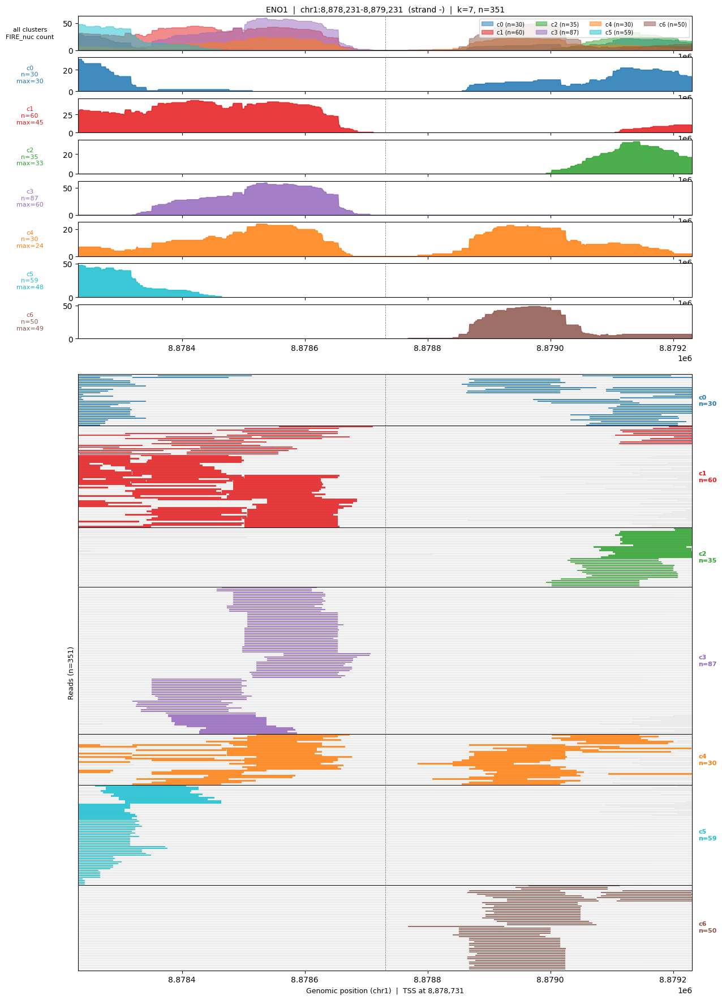

[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi
/home/cshan/ipykernel_2443091/2427090154.py:165: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FIRE_nuc/31samples_pooled/ZCWPW1_w500_fire_nuc_cluster_panels_k7.pdf
  cluster sizes: {0: 130, 1: 154, 2: 94, 3: 13, 4: 63, 5: 64, 6: 107}


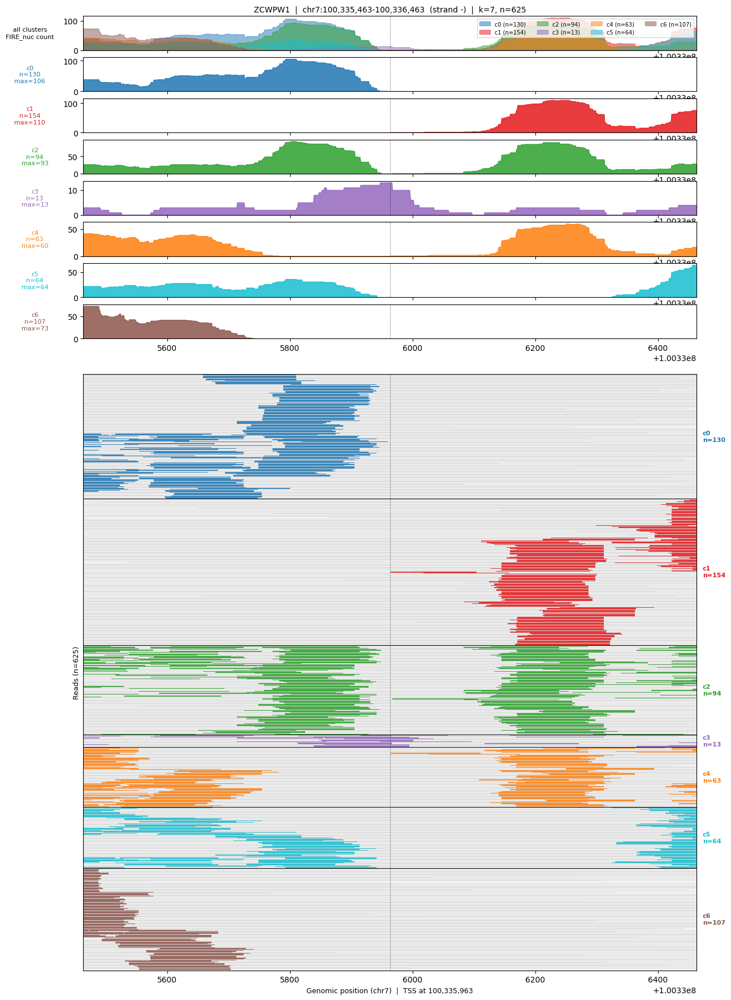

In [6]:
import matplotlib.colors as mcolors

CLUSTER_PALETTE = globals().get("CLUSTER_PALETTE", [
    "#1f77b4", "#e41a1c", "#2ca02c", "#9467bd",
    "#ff7f0e", "#17becf", "#8c564b", "#e377c2",
])
UNCOVERED_RGB = (0.92, 0.92, 0.92)

def _cluster_color(c):
    return CLUSTER_PALETTE[c % len(CLUSTER_PALETTE)]


def fire_nuc_count_matrix(read_ids, labels, reads_fire, view_start, view_end, n_clusters_total):
    n_pos = view_end - view_start + 1
    counts = np.zeros((n_clusters_total, n_pos), dtype=int)
    for read_id, c in zip(read_ids, labels):
        for fp in reads_fire.get(read_id, []):
            fp_start, fp_end = fp[0], fp[1]
            lo = max(fp_start, view_start)
            hi = min(fp_end,   view_end)
            if lo <= hi:
                counts[c, lo - view_start : hi - view_start + 1] += 1
    return counts


def plot_fire_nuc_cluster_panels(gene_name, hw, res, reads_fire, locus_chrom, tss, strand):
    """Render the per-cluster FIRE_nuc tracks and the per-read bottom panel.

    Every read in res["df"] is rendered. By construction (cell 25) only reads
    with at least one FIRE_nuc footprint in the window are present. Positions
    outside a read's aligned span are drawn in grey.
    """
    df       = res["df"]
    best_k   = res["best_k"]
    labels   = res["labels_by_k"][best_k]
    read_ids = df["read_id"].tolist()

    sizes = {c: int((labels == c).sum()) for c in range(best_k)}
    present_clusters = [c for c in range(best_k) if sizes[c] > 0]

    n_reads = len(read_ids)
    if n_reads == 0:
        print(f"  {gene_name} hw={hw}: no reads to display, skipping")
        return

    view_start = max(0, tss - hw)
    view_end   = tss + hw
    positions  = np.arange(view_start, view_end + 1)

    counts = fire_nuc_count_matrix(read_ids, labels, reads_fire,
                                   view_start, view_end, best_k)
    global_ymax = max(1, counts[present_clusters].max()) if present_clusters else 1

    # Row order: cluster id ascending, then Ward leaf rank within each cluster.
    ward_rank = res["ward_rank"]
    order = np.lexsort((ward_rank, labels))
    labels_sorted = labels[order]

    n_top_tracks = len(present_clusters) + 1
    bot_height   = min(14.0, max(3.5, 0.05 * n_reads))
    spacer       = 0.5
    fig_height   = 0.8 * n_top_tracks + bot_height + spacer + 1.0

    fig = plt.figure(figsize=(14, fig_height))
    gs = plt.GridSpec(
        n_top_tracks + 2, 1,
        height_ratios=[0.8] * n_top_tracks + [spacer] + [bot_height],
        hspace=0.08,
    )
    ax_combined = fig.add_subplot(gs[0])
    per_cluster_axes = {
        c: fig.add_subplot(gs[1 + i], sharex=ax_combined)
        for i, c in enumerate(present_clusters)
    }
    ax_bot = fig.add_subplot(gs[n_top_tracks + 1], sharex=ax_combined)

    for c in present_clusters:
        ax_combined.fill_between(positions, 0, counts[c], color=_cluster_color(c),
                                 alpha=0.5, label=f"c{c} (n={sizes[c]})")
    ax_combined.axvline(tss, color="black", lw=0.6, ls="--", alpha=0.5)
    ax_combined.set_xlim(view_start, view_end)
    ax_combined.set_ylim(0, global_ymax * 1.05)
    ax_combined.set_ylabel("all clusters\nFIRE_nuc count", fontsize=8,
                           rotation=0, labelpad=42, va="center")
    ax_combined.set_title(
        f"{gene_name}  |  {locus_chrom}:{view_start:,}-{view_end:,}  (strand {strand})  |  "
        f"k={best_k}, n={n_reads}",
        fontsize=10,
    )
    ax_combined.legend(loc="upper right", fontsize=7,
                       ncol=min(max(len(present_clusters), 1), 4))
    plt.setp(ax_combined.get_xticklabels(), visible=False)

    last_idx = len(present_clusters) - 1
    for i, c in enumerate(present_clusters):
        ax = per_cluster_axes[c]
        ax.fill_between(positions, 0, counts[c], color=_cluster_color(c), alpha=0.85)
        ax.axvline(tss, color="black", lw=0.6, ls="--", alpha=0.5)
        ax.set_xlim(view_start, view_end)
        cluster_ymax = max(1, counts[c].max())
        ax.set_ylim(0, cluster_ymax * 1.05)
        ax.set_ylabel(f"c{c}\nn={sizes[c]}\nmax={cluster_ymax}",
                      fontsize=8, rotation=0, labelpad=42, va="center",
                      color=_cluster_color(c))
        if i < last_idx:
            plt.setp(ax.get_xticklabels(), visible=False)

    r_starts = df["r_start"].to_numpy()
    r_ends   = df["r_end"].to_numpy()
    for y_idx, read_idx in enumerate(order):
        read_name = read_ids[read_idx]
        c     = int(labels[read_idx])
        color = _cluster_color(c)

        rs_clip = max(int(r_starts[read_idx]), view_start)
        re_clip = min(int(r_ends[read_idx]),   view_end)
        if rs_clip > view_start:
            ax_bot.add_patch(plt.Rectangle(
                (view_start, y_idx - 0.4),
                rs_clip - view_start, 0.8,
                linewidth=0, facecolor=UNCOVERED_RGB, zorder=0,
            ))
        if re_clip < view_end:
            ax_bot.add_patch(plt.Rectangle(
                (re_clip, y_idx - 0.4),
                view_end - re_clip, 0.8,
                linewidth=0, facecolor=UNCOVERED_RGB, zorder=0,
            ))
        if rs_clip < re_clip:
            ax_bot.plot([rs_clip, re_clip], [y_idx, y_idx],
                        color="black", lw=0.3, zorder=1, alpha=0.4)
        for fp in reads_fire.get(read_name, []):
            fp_start, fp_end = fp[0], fp[1]
            lo = max(fp_start, view_start)
            hi = min(fp_end,   view_end)
            if lo >= hi:
                continue
            ax_bot.add_patch(plt.Rectangle(
                (lo, y_idx - 0.4),
                hi - lo,
                0.8,
                linewidth=0, facecolor=color, alpha=0.85, zorder=2,
            ))

    ax_bot.axvline(tss, color="black", lw=0.6, ls="--", alpha=0.5)
    boundaries = np.where(np.diff(labels_sorted) != 0)[0] + 1
    for b in boundaries:
        ax_bot.axhline(b - 0.5, color="black", lw=0.7)
    label_x = view_end + (view_end - view_start) * 0.01
    for c in present_clusters:
        idx = np.where(labels_sorted == c)[0]
        if len(idx):
            y_mid = (idx.min() + idx.max()) / 2
            ax_bot.text(label_x, y_mid,
                        f"c{c}\nn={sizes[c]}",
                        fontsize=8, va="center",
                        color=_cluster_color(c), fontweight="bold")

    ax_bot.set_xlim(view_start, view_end)
    ax_bot.set_ylim(n_reads, -1)
    ax_bot.set_yticks([])
    ax_bot.set_ylabel(f"Reads (n={n_reads})", fontsize=9)
    ax_bot.set_xlabel(f"Genomic position ({locus_chrom})  |  TSS at {tss:,}", fontsize=9)

    plt.tight_layout()
    out_pdf = NUC_OUT_ROOT / f"{gene_name}_w{hw}_fire_nuc_cluster_panels_k{best_k}.pdf"
    fig.savefig(out_pdf, bbox_inches="tight")
    print(f"  wrote: {out_pdf}")
    print(f"  cluster sizes: {sizes}")
    plt.show()


for (gene_name, hw), res in nuc_cluster_results.items():
    g_row  = gene_info[gene_info["gene_name"] == gene_name].iloc[0]
    chrom  = g_row["chrom"]
    strand = g_row["strand"]
    tss    = int(g_row["tss_anchor"])
    view_start = max(0, tss - hw)
    view_end   = tss + hw

    reads_fire = collect_reads_from_indexed_beds(
        chrom, view_start, view_end,
        fp_class="FIRE_nucleosome", beds_dir=DEFAULT_FP_BED_DIR,
    )
    reads_fire = _filter_fire_nucleosome_by_length(reads_fire, FIRE_NUC_LENGTH_RANGE)
    plot_fire_nuc_cluster_panels(gene_name, hw, res, reads_fire, chrom, tss, strand)


### 4. Compact two-panel view: combined overlay + mixed-cluster reads.

Same data as section 3, condensed into two panels:

- **Top panel** - the combined overlay only (all clusters together, semi-transparent fill, one color per cluster).
- **Bottom panel** - all reads in **one ungrouped panel** (sourced from `res["df"]`, which already excludes reads with no FIRE_nucs). Each FIRE_nuc rectangle is colored by the read's cluster. Positions outside each read's aligned span are filled with light grey.
  - Default sort is `sort_by="ward"`: the dendrogram leaf order of a Ward linkage built on the same standardized feature matrix k-means clustered. Adjacent rows are therefore similar across **all seven features** simultaneously, not just `d_plus1`.
  - Pass `sort_by="d_plus1"` (or `"d_minus1"`, `"ndr_width"`, etc.) to revert to a single-feature sort. NaN values sort last.


[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi
/home/cshan/ipykernel_2443091/524871725.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FIRE_nuc/31samples_pooled/ENO1_w500_fire_nuc_mixed_k7_by_ward.pdf


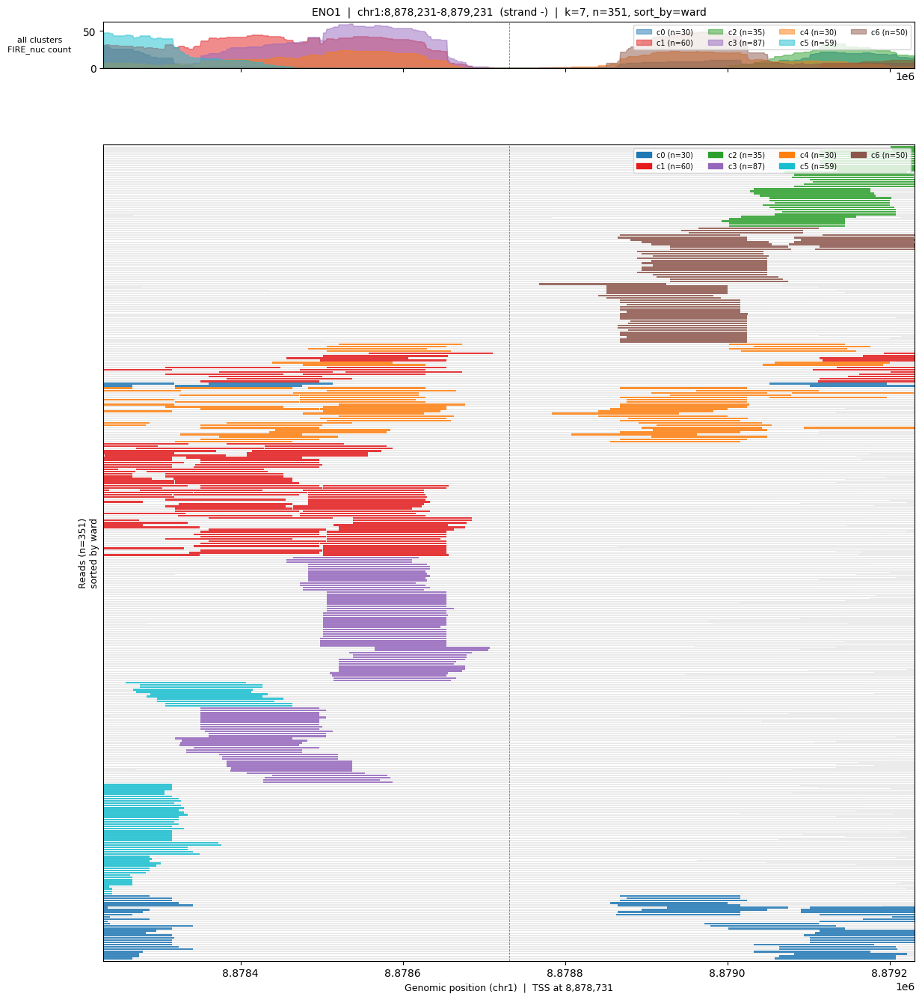

[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi
/home/cshan/ipykernel_2443091/524871725.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FIRE_nuc/31samples_pooled/ZCWPW1_w500_fire_nuc_mixed_k7_by_ward.pdf


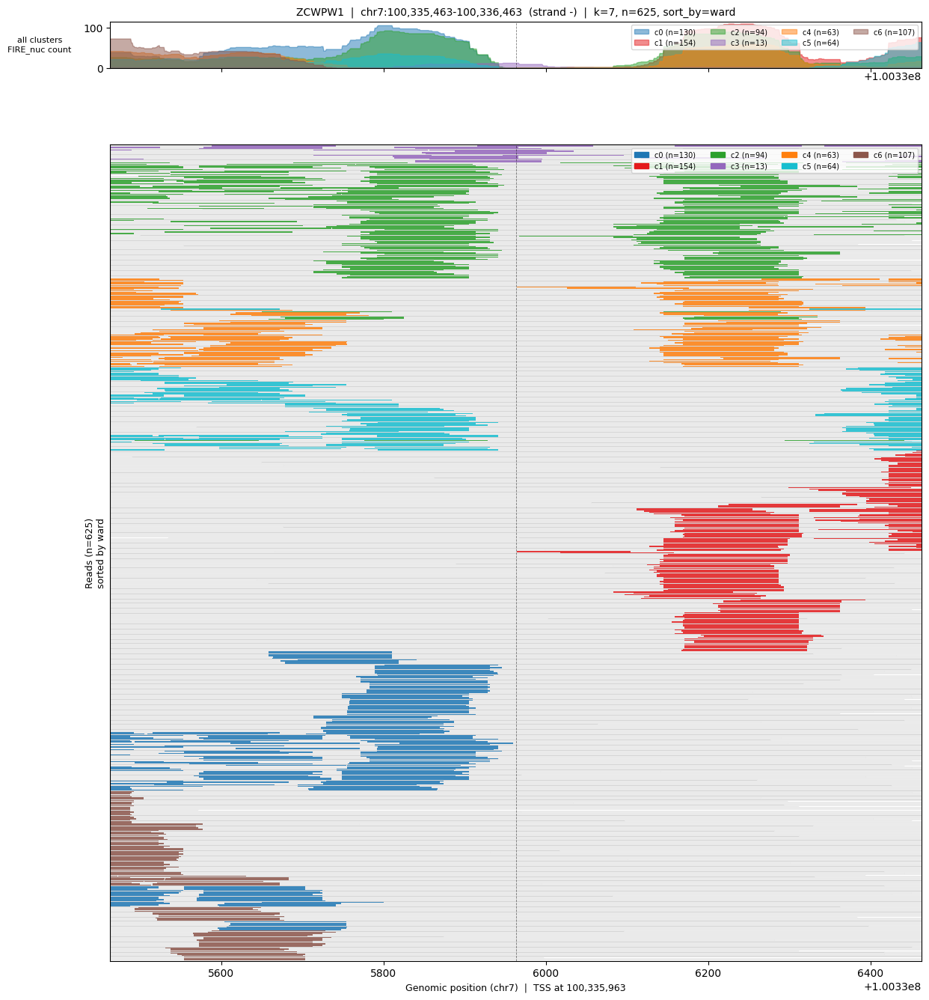

In [7]:
def plot_fire_nuc_mixed_panel(gene_name, hw, res, reads_fire, locus_chrom, tss, strand,
                              sort_by="ward"):
    """Compact two-panel view.

    sort_by="ward" (default) orders rows by the Ward dendrogram leaf order
    built on the same standardized feature vector k-means clustered. Pass any
    column name from res["df"] to revert to a single-feature sort.
    """
    df       = res["df"]
    best_k   = res["best_k"]
    labels   = res["labels_by_k"][best_k]
    read_ids = df["read_id"].tolist()

    n_reads = len(read_ids)
    if n_reads == 0:
        print(f"  {gene_name} hw={hw}: no reads")
        return

    view_start = max(0, tss - hw)
    view_end   = tss + hw
    positions  = np.arange(view_start, view_end + 1)

    counts = fire_nuc_count_matrix(read_ids, labels, reads_fire,
                                   view_start, view_end, best_k)
    sizes  = {c: int((labels == c).sum()) for c in range(best_k)}
    present_clusters = [c for c in range(best_k) if sizes[c] > 0]
    global_ymax = max(1, counts[present_clusters].max()) if present_clusters else 1

    if sort_by == "ward":
        sort_vec = res["ward_rank"].astype(float)
    elif sort_by in df.columns:
        v = df[sort_by].to_numpy(dtype=float)
        sort_vec = np.where(np.isnan(v), np.inf, v)
    else:
        raise ValueError(
            f"sort_by={sort_by!r} not 'ward' and not in df columns: {list(df.columns)}"
        )
    order = np.argsort(sort_vec, kind="stable")

    bot_height = min(14.0, max(3.5, 0.05 * n_reads))
    spacer     = 0.5
    fig_height = 0.8 + bot_height + spacer + 1.0

    fig = plt.figure(figsize=(14, fig_height))
    gs = plt.GridSpec(3, 1, height_ratios=[0.8, spacer, bot_height], hspace=0.08)
    ax_top = fig.add_subplot(gs[0])
    ax_bot = fig.add_subplot(gs[2], sharex=ax_top)

    for c in present_clusters:
        ax_top.fill_between(positions, 0, counts[c], color=_cluster_color(c),
                            alpha=0.5, label=f"c{c} (n={sizes[c]})")
    ax_top.axvline(tss, color="black", lw=0.6, ls="--", alpha=0.5)
    ax_top.set_xlim(view_start, view_end)
    ax_top.set_ylim(0, global_ymax * 1.05)
    ax_top.set_ylabel("all clusters\nFIRE_nuc count", fontsize=8,
                       rotation=0, labelpad=42, va="center")
    ax_top.set_title(
        f"{gene_name}  |  {locus_chrom}:{view_start:,}-{view_end:,}  (strand {strand})  |  "
        f"k={best_k}, n={n_reads}, sort_by={sort_by}",
        fontsize=10,
    )
    ax_top.legend(loc="upper right", fontsize=7,
                  ncol=min(max(len(present_clusters), 1), 4))
    plt.setp(ax_top.get_xticklabels(), visible=False)

    r_starts = df["r_start"].to_numpy()
    r_ends   = df["r_end"].to_numpy()
    for y_idx, read_idx in enumerate(order):
        read_name = read_ids[read_idx]
        c     = int(labels[read_idx])
        color = _cluster_color(c)

        rs_clip = max(int(r_starts[read_idx]), view_start)
        re_clip = min(int(r_ends[read_idx]),   view_end)
        if rs_clip > view_start:
            ax_bot.add_patch(plt.Rectangle(
                (view_start, y_idx - 0.4),
                rs_clip - view_start, 0.8,
                linewidth=0, facecolor=UNCOVERED_RGB, zorder=0,
            ))
        if re_clip < view_end:
            ax_bot.add_patch(plt.Rectangle(
                (re_clip, y_idx - 0.4),
                view_end - re_clip, 0.8,
                linewidth=0, facecolor=UNCOVERED_RGB, zorder=0,
            ))
        if rs_clip < re_clip:
            ax_bot.plot([rs_clip, re_clip], [y_idx, y_idx],
                        color="black", lw=0.3, zorder=1, alpha=0.4)
        for fp in reads_fire.get(read_name, []):
            fp_start, fp_end = fp[0], fp[1]
            lo = max(fp_start, view_start)
            hi = min(fp_end,   view_end)
            if lo >= hi:
                continue
            ax_bot.add_patch(plt.Rectangle(
                (lo, y_idx - 0.4),
                hi - lo,
                0.8,
                linewidth=0, facecolor=color, alpha=0.85, zorder=2,
            ))
    ax_bot.axvline(tss, color="black", lw=0.6, ls="--", alpha=0.5)
    ax_bot.set_xlim(view_start, view_end)
    ax_bot.set_ylim(n_reads, -1)
    ax_bot.set_yticks([])
    ax_bot.set_ylabel(f"Reads (n={n_reads})\nsorted by {sort_by}", fontsize=9)
    ax_bot.set_xlabel(f"Genomic position ({locus_chrom})  |  TSS at {tss:,}", fontsize=9)

    legend_patches = [
        plt.matplotlib.patches.Patch(color=_cluster_color(c), label=f"c{c} (n={sizes[c]})")
        for c in present_clusters
    ]
    if legend_patches:
        ax_bot.legend(handles=legend_patches, loc="upper right", fontsize=7,
                      ncol=min(len(legend_patches), 4))

    plt.tight_layout()
    out_pdf = (NUC_OUT_ROOT /
               f"{gene_name}_w{hw}_fire_nuc_mixed_k{best_k}_by_{sort_by}.pdf")
    fig.savefig(out_pdf, bbox_inches="tight")
    print(f"  wrote: {out_pdf}")
    plt.show()


for (gene_name, hw), res in nuc_cluster_results.items():
    g_row  = gene_info[gene_info["gene_name"] == gene_name].iloc[0]
    chrom  = g_row["chrom"]
    strand = g_row["strand"]
    tss    = int(g_row["tss_anchor"])
    view_start = max(0, tss - hw)
    view_end   = tss + hw

    reads_fire = collect_reads_from_indexed_beds(
        chrom, view_start, view_end,
        fp_class="FIRE_nucleosome", beds_dir=DEFAULT_FP_BED_DIR,
    )
    reads_fire = _filter_fire_nucleosome_by_length(reads_fire, FIRE_NUC_LENGTH_RANGE)
    plot_fire_nuc_mixed_panel(gene_name, hw, res, reads_fire, chrom, tss, strand,
                              sort_by="ward")


# Cluster by presence of footprint classes

Footprint-shape-agnostic clustering on the **multi-class binary occupancy** of each read in a small TSS-centered window (default `+/-150 bp`). For each of the five footprint classes the plot script (`plot_polii_footprints_precomputed_sort.py`) distinguishes - PPP, PIC, nucleosome (140-160), FIRE_nucleosome, unknown - each read becomes a binary vector: `1` at positions covered by a class-c footprint, `0` elsewhere. The five per-class vectors are concatenated and clustered with hierarchical Ward linkage; row order in the heatmap follows the dendrogram leaves. Class colors and definitions match the plot script's `FP_COLORS` / `CLASS_SUBDIRS`.


### 1. Multi-class binary occupancy: matrix build.

Per gene, per half-window in `PRESENCE_HALF_WINDOWS` (default `[150, 300]`), per read, store a binary array `occ[c, p] in {0, 1}` over the strand-aware TSS-relative range `[-hw, +hw]`, for each class in `FP_CLASSES_FOR_CLUSTERING`. The `aligned` mask records which positions are inside the read's footprint span, so the plot can grey out positions outside the alignment without affecting clustering (uncovered positions cluster as `0`).

Matrices are keyed by `(gene_name, hw)` so multiple window sizes are stored side by side.

Five classes (and colors) are imported from `plot_polii_footprints_precomputed_sort.py`:
- `PPP` (40-60 bp) - `#FF69B4`
- `PIC` (60-80 bp) - `#4169E1`
- `nucleosome (140-160)` - `#2E8B57`
- `FIRE_nucleosome` (length-filtered 140-160 bp) - `#FFA500`
- `unknown` - `#AAAAAA`

`FIRE_nucleosome` is length-filtered with `FIRE_NUC_LENGTH_RANGE`; the other classes are taken as-is from the indexed BEDs in `/project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds`.


In [14]:
from plot_polii_footprints_precomputed_sort import FP_COLORS, CLASS_SUBDIRS

FP_CLASSES_FOR_CLUSTERING = [
    "PPP",
    "PIC",
    "nucleosome (140-160)",
    "FIRE_nucleosome",
    "unknown",
]
PRESENCE_HALF_WINDOWS      = [150, 300]   # bp on each side of TSS, strand-aware
FILTER_FIRE_NUC_BY_LENGTH  = False        # True -> restrict FIRE_nuc footprints to FIRE_NUC_LENGTH_RANGE (140-160 bp)

PRESENCE_OUT_ROOT = Path(
    "/project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FP_presence/"
    "31samples_pooled"
)
PRESENCE_OUT_ROOT.mkdir(parents=True, exist_ok=True)

print(f"Half-windows         : {PRESENCE_HALF_WINDOWS} bp (strand-aware)")
print(f"Classes              : {FP_CLASSES_FOR_CLUSTERING}")
print(f"FIRE_nuc length filt : {'on (' + str(FIRE_NUC_LENGTH_RANGE) + ')' if FILTER_FIRE_NUC_BY_LENGTH else 'off (all sizes kept)'}")
print(f"Output dir           : {PRESENCE_OUT_ROOT}\n")

presence_matrices = {}
for _, g in gene_info.iterrows():
    gene_name = g["gene_name"]
    chrom     = g["chrom"]
    strand    = g["strand"]
    tss       = int(g["tss_anchor"])

    for hw in PRESENCE_HALF_WINDOWS:
        view_start = max(0, tss - hw)
        view_end   = tss + hw
        n_pos      = 2 * hw + 1

        # All-class footprints to estimate alignment span 
        read_spans = collect_reads_from_indexed_beds(
            chrom, view_start, view_end,
            fp_class="all", beds_dir=DEFAULT_FP_BED_DIR,
        )

        # Per-class footprints.
        per_class_reads = {}
        for cls in FP_CLASSES_FOR_CLUSTERING:
            per_class_reads[cls] = collect_reads_from_indexed_beds(
                chrom, view_start, view_end,
                fp_class=cls, beds_dir=DEFAULT_FP_BED_DIR,
            )
        if FILTER_FIRE_NUC_BY_LENGTH and "FIRE_nucleosome" in per_class_reads:
            per_class_reads["FIRE_nucleosome"] = _filter_fire_nucleosome_by_length(
                per_class_reads["FIRE_nucleosome"], FIRE_NUC_LENGTH_RANGE
            )

        read_ids = list(read_spans.keys())
        n_reads  = len(read_ids)
        n_cls    = len(FP_CLASSES_FOR_CLUSTERING)

        occ      = np.zeros((n_cls, n_reads, n_pos), dtype=np.float32)
        aligned  = np.zeros((n_reads, n_pos), dtype=bool)
        r_starts = np.zeros(n_reads, dtype=np.int64)
        r_ends   = np.zeros(n_reads, dtype=np.int64)

        def _rel_bounds(g_start, g_end_excl, strand=strand, tss=tss, hw=hw):
            g_end_incl = g_end_excl - 1
            if strand == "+":
                rel_lo = g_start    - tss
                rel_hi = g_end_incl - tss
            else:
                rel_lo = tss - g_end_incl
                rel_hi = tss - g_start
            return max(rel_lo, -hw), min(rel_hi, hw)

        for i, read_name in enumerate(read_ids):
            span_fps = read_spans[read_name]
            r_starts[i] = min(fp[0] for fp in span_fps)
            r_ends[i]   = max(fp[1] for fp in span_fps)

            rel_lo, rel_hi = _rel_bounds(r_starts[i], r_ends[i])
            if rel_lo <= rel_hi:
                aligned[i, rel_lo + hw : rel_hi + hw + 1] = True

            for ci, cls in enumerate(FP_CLASSES_FOR_CLUSTERING):
                for fp in per_class_reads[cls].get(read_name, []):
                    rel_lo, rel_hi = _rel_bounds(fp[0], fp[1])
                    if rel_lo <= rel_hi:
                        occ[ci, i, rel_lo + hw : rel_hi + hw + 1] = 1.0

        presence_matrices[(gene_name, hw)] = {
            "read_ids": read_ids,
            "occ":      occ,
            "aligned":  aligned,
            "r_start":  r_starts,
            "r_end":    r_ends,
            "chrom":    chrom,
            "strand":   strand,
            "tss":      tss,
            "hw":       hw,
            "classes":  list(FP_CLASSES_FOR_CLUSTERING),
        }
        print(f"  {gene_name} hw={hw}: n_reads={n_reads}, shape per class={occ[0].shape}")
        for ci, cls in enumerate(FP_CLASSES_FOR_CLUSTERING):
            n_with = int((occ[ci].sum(axis=1) > 0).sum())
            print(f"    {cls:24s}: {n_with} reads with >=1 footprint")


Half-windows         : [150, 300] bp (strand-aware)
Classes              : ['PPP', 'PIC', 'nucleosome (140-160)', 'FIRE_nucleosome', 'unknown']
FIRE_nuc length filt : off (all sizes kept)
Output dir           : /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FP_presence/31samples_pooled



[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi


  ENO1 hw=150: n_reads=570, shape per class=(570, 301)
    PPP                     : 258 reads with >=1 footprint
    PIC                     : 76 reads with >=1 footprint
    nucleosome (140-160)    : 136 reads with >=1 footprint
    FIRE_nucleosome         : 516 reads with >=1 footprint
    unknown                 : 440 reads with >=1 footprint
  ENO1 hw=300: n_reads=584, shape per class=(584, 601)
    PPP                     : 285 reads with >=1 footprint
    PIC                     : 86 reads with >=1 footprint
    nucleosome (140-160)    : 225 reads with >=1 footprint
    FIRE_nucleosome         : 577 reads with >=1 footprint
    unknown                 : 461 reads with >=1 footprint


[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi


  ZCWPW1 hw=150: n_reads=819, shape per class=(819, 301)
    PPP                     : 465 reads with >=1 footprint
    PIC                     : 41 reads with >=1 footprint
    nucleosome (140-160)    : 234 reads with >=1 footprint
    FIRE_nucleosome         : 706 reads with >=1 footprint
    unknown                 : 676 reads with >=1 footprint
  ZCWPW1 hw=300: n_reads=828, shape per class=(828, 601)
    PPP                     : 513 reads with >=1 footprint
    PIC                     : 58 reads with >=1 footprint
    nucleosome (140-160)    : 481 reads with >=1 footprint
    FIRE_nucleosome         : 824 reads with >=1 footprint
    unknown                 : 740 reads with >=1 footprint


[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi


### 2. Hierarchical Ward clustering; k chosen by largest-gap elbow on the dendrogram.

For each `(gene, hw)` matrix:
1. Bin-smooth every per-class occupancy matrix at `PRESENCE_BIN_BP` bp.
2. Horizontally concatenate the per-class binned matrices into a feature matrix of shape `(n_reads, n_classes * n_bin)`.
3. Compute hierarchical Ward linkage on that feature matrix; obtain the leaf order via `leaves_list`.
4. **k is chosen by Ward itself**: take the top `PRESENCE_TOP_MERGES` merges (largest distances in the linkage matrix), find the **largest gap** between consecutive merge distances, and cut at that height with `fcluster(..., criterion="distance")`. The resulting `k` is whatever the dendrogram says - it can differ between window sizes and between genes.

No silhouette search, no fixed `k`. If the elbow yields `k=1` (no real structure), the fallback is to cut just above the second-highest merge so the run still produces at least two clusters.


In [11]:
from scipy.cluster.hierarchy import linkage, fcluster, leaves_list

PRESENCE_BIN_BP      = 10
PRESENCE_TOP_MERGES  = 20   # examine the top N merge distances for the elbow gap


def _bin_smooth_mean(X, bin_bp):
    """Mean-pool every `bin_bp` columns of a 2D array."""
    n_reads, n_pos = X.shape
    n_bin = n_pos // bin_bp
    trimmed = X[:, : n_bin * bin_bp].reshape(n_reads, n_bin, bin_bp)
    return trimmed.mean(axis=2)


def _ward_elbow_k(Z, top_merges=PRESENCE_TOP_MERGES):
    """Pick k by the largest gap among the top merge distances of a Ward linkage.

    Returns (labels, k, cut_height). Falls back to a top-2 cut if the elbow
    would otherwise place every read in one cluster.
    """
    distances = Z[:, 2]                          # ascending
    n_merges  = len(distances)
    if n_merges < 2:
        # Degenerate case (<= 2 reads).
        return np.zeros(n_merges + 1, dtype=int), 1, float("inf")

    n_top = min(top_merges, n_merges)
    top   = distances[-n_top:]                   # ascending top-N distances
    diffs = np.diff(top)                         # n_top - 1 gaps
    gap_idx = int(np.argmax(diffs))              # index inside `top`
    cut_h   = float(0.5 * (top[gap_idx] + top[gap_idx + 1]))
    labels  = fcluster(Z, t=cut_h, criterion="distance") - 1
    k_pick  = int(len(np.unique(labels)))

    if k_pick < 2:
        # Fall back to splitting just above the second-largest merge -> k=2.
        cut_h  = float(0.5 * (distances[-2] + distances[-1]))
        labels = fcluster(Z, t=cut_h, criterion="distance") - 1
        k_pick = int(len(np.unique(labels)))
    return labels, k_pick, cut_h


presence_cluster_results = {}
for (gene_name, hw), info in presence_matrices.items():
    occ = info["occ"]
    n_classes, n_reads, n_pos = occ.shape

    if n_reads < 2:
        print(f"{gene_name} hw={hw}: only {n_reads} reads, skipping")
        continue

    binned = [_bin_smooth_mean(occ[c], PRESENCE_BIN_BP) for c in range(n_classes)]
    X = np.concatenate(binned, axis=1)

    Z = linkage(X, method="ward")
    leaf_order = leaves_list(Z)

    labels, best_k, cut_height = _ward_elbow_k(Z)

    presence_cluster_results[(gene_name, hw)] = {
        **info,
        "X":           X,
        "linkage":     Z,
        "leaf_order":  leaf_order,
        "labels":      labels,
        "k":           best_k,
        "cut_height":  cut_height,
    }

    sizes = {c: int((labels == c).sum()) for c in range(best_k)}
    print(f"\n=== {gene_name} hw={hw}  (n_reads={n_reads}, bin={PRESENCE_BIN_BP} bp) ===")
    print(f"  Ward elbow cut at height {cut_height:.3f} -> k={best_k}")
    for c, n in sorted(sizes.items()):
        print(f"  c{c}: n={n}")

    np.save(PRESENCE_OUT_ROOT / f"{gene_name}_w{hw}_presence_labels_k{best_k}.npy",
            labels)
    pd.DataFrame({
        "read_id": info["read_ids"],
        "cluster": labels,
    }).to_csv(PRESENCE_OUT_ROOT / f"{gene_name}_w{hw}_presence_clusters_k{best_k}.tsv",
              sep="\t", index=False)


### 3. Per-cluster class-occupancy tracks + per-read multi-class heatmap.

Three-part layout in **strand-aware TSS-relative coordinates**:

1. **Top combined overlay** - per-class mean occupancy across all reads (one semi-transparent curve per class, colored by `FP_COLORS`).
2. **Per-cluster panels** - same five-curve overlay restricted to reads in each cluster.
3. **Bottom heatmap** - one row per read, ordered by the Ward dendrogram leaves. Each position is drawn as:
   - Light grey (`UNCOVERED_RGB`) if outside the read's alignment.
   - White if aligned but no footprint covers.
   - Class color if a footprint of that class covers (later classes overwrite earlier classes when multiple overlap; class order is `PPP -> PIC -> nucleosome -> FIRE_nucleosome -> unknown`).

Black horizontal lines separate the cluster bands (cluster boundaries computed from the change-points of the leaf-ordered label sequence). Right-margin labels give cluster id and size.


/home/cshan/ipykernel_3758512/3997358395.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FP_presence/31samples_pooled/ENO1_w150_presence_cluster_panels_k2.pdf


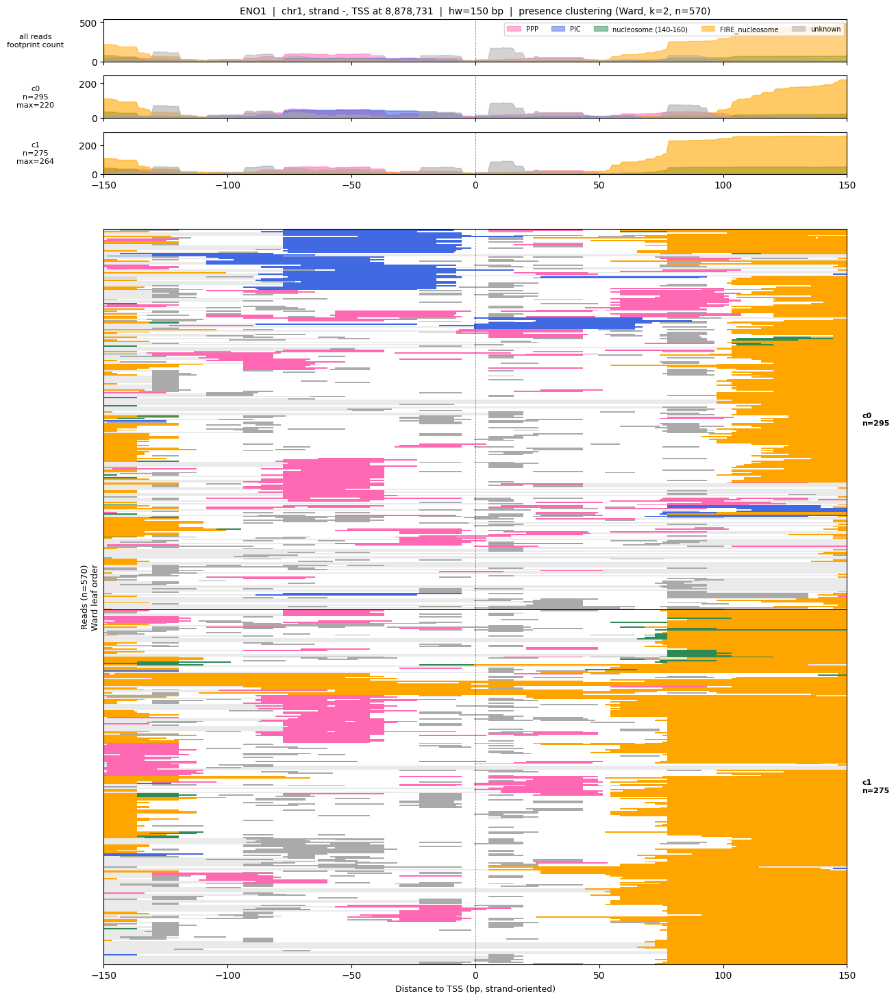

/home/cshan/ipykernel_3758512/3997358395.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FP_presence/31samples_pooled/ENO1_w300_presence_cluster_panels_k3.pdf


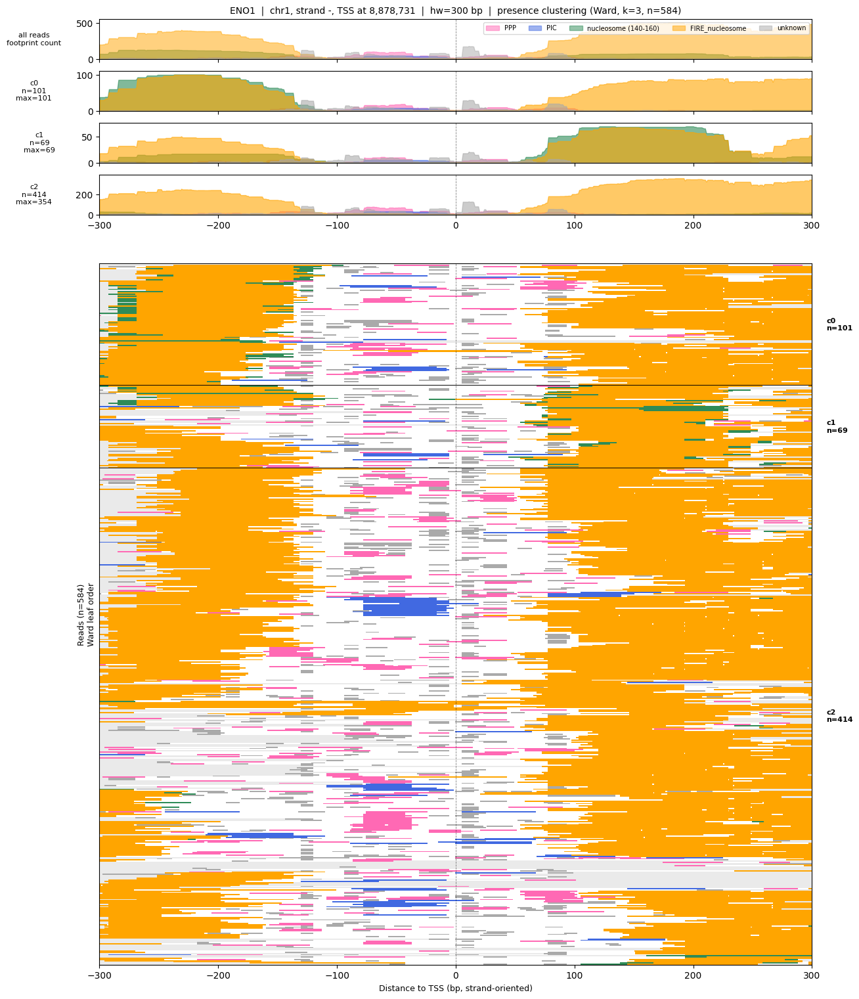

/home/cshan/ipykernel_3758512/3997358395.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FP_presence/31samples_pooled/ZCWPW1_w150_presence_cluster_panels_k3.pdf


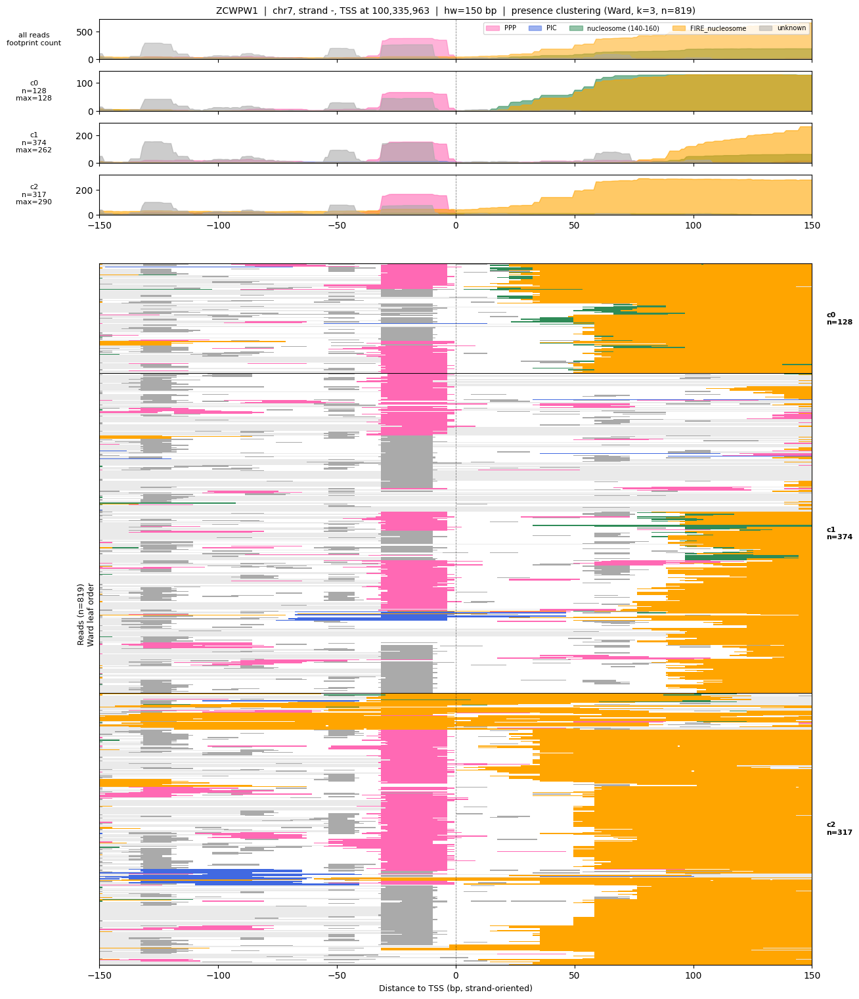

/home/cshan/ipykernel_3758512/3997358395.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_FP_presence/31samples_pooled/ZCWPW1_w300_presence_cluster_panels_k3.pdf


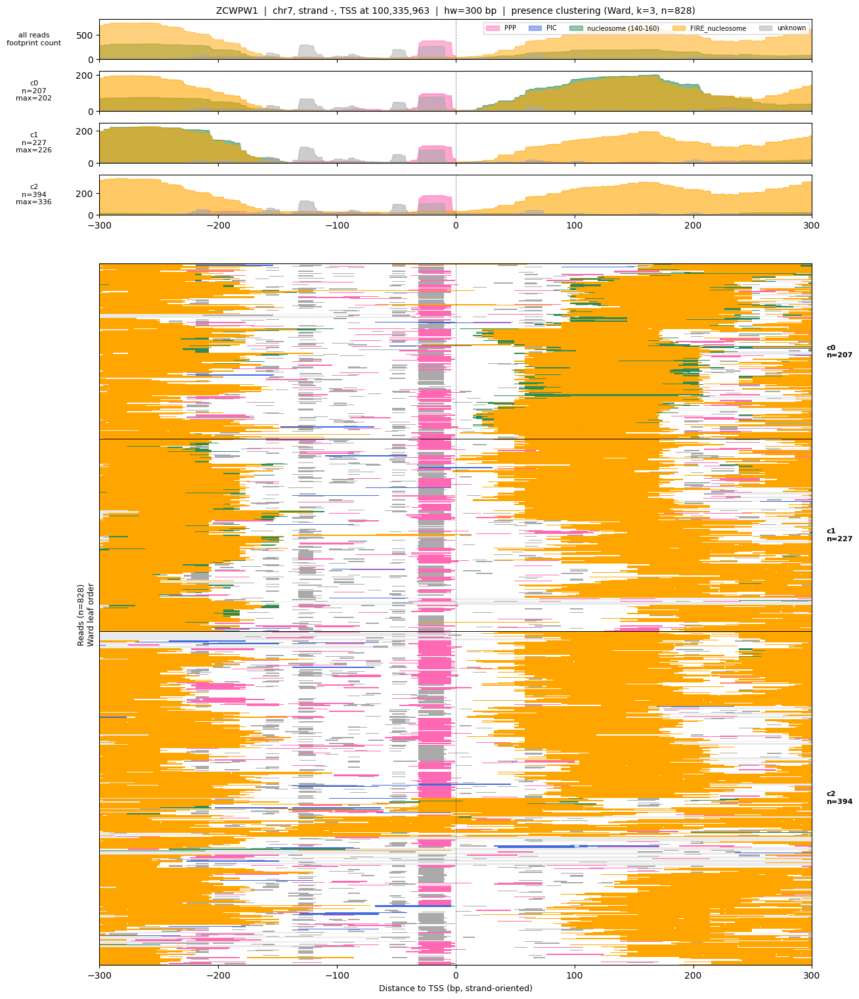

In [13]:
import matplotlib.colors as mcolors

WHITE_RGB = (1.00, 1.00, 1.00)


def plot_presence_cluster_panels(gene_name, hw, res):
    occ        = res["occ"]              # (n_classes, n_reads, n_pos), 0/1
    aligned    = res["aligned"]
    classes    = res["classes"]
    chrom      = res["chrom"]
    strand     = res["strand"]
    tss        = res["tss"]
    k          = res["k"]
    labels     = res["labels"]
    leaf_order = res["leaf_order"]
    n_classes, n_reads, n_pos = occ.shape
    rel_pos    = np.arange(-hw, hw + 1)

    sizes = {c: int((labels == c).sum()) for c in range(k)}
    present_clusters = [c for c in range(k) if sizes[c] > 0]

    # Per-cluster, per-class footprint count at each position (sum of 0/1
    # occupancy over the cluster's reads = number of reads with that class
    # footprint covering the position).
    profiles = {}
    for cluster_id in range(k):
        cluster_mask = (labels == cluster_id)
        profiles[cluster_id] = {}
        for ci, cls in enumerate(classes):
            if cluster_mask.sum() == 0:
                profiles[cluster_id][cls] = np.zeros(n_pos)
            else:
                profiles[cluster_id][cls] = occ[ci, cluster_mask].sum(axis=0)

    # Combined overlay: per-class total counts across all reads.
    combined = {cls: occ[ci].sum(axis=0) for ci, cls in enumerate(classes)}
    combined_ymax = max((v.max() for v in combined.values()), default=1.0)
    combined_ymax = max(combined_ymax, 1.0)

    # Row order: ward dendrogram leaves.
    order = np.asarray(leaf_order, dtype=int)
    labels_sorted = labels[order]

    # Bottom heatmap RGB image.
    img = np.tile(np.array(WHITE_RGB, dtype=np.float32), (n_reads, n_pos, 1))
    img[~aligned] = UNCOVERED_RGB
    for ci, cls in enumerate(classes):
        if cls not in FP_COLORS:
            continue
        rgb  = np.array(mcolors.to_rgb(FP_COLORS[cls]), dtype=np.float32)
        mask = occ[ci] > 0
        img[mask] = rgb
    img_sorted = img[order]

    n_top_tracks = len(present_clusters) + 1
    bot_height   = min(14.0, max(3.5, 0.05 * n_reads))
    spacer       = 0.5
    fig_height   = 0.8 * n_top_tracks + bot_height + spacer + 1.0

    fig = plt.figure(figsize=(14, fig_height))
    gs = plt.GridSpec(
        n_top_tracks + 2, 1,
        height_ratios=[0.8] * n_top_tracks + [spacer] + [bot_height],
        hspace=0.08,
    )
    ax_combined = fig.add_subplot(gs[0])
    per_cluster_axes = {
        c: fig.add_subplot(gs[1 + i], sharex=ax_combined)
        for i, c in enumerate(present_clusters)
    }
    ax_bot = fig.add_subplot(gs[n_top_tracks + 1], sharex=ax_combined)

    # Combined overlay - per-class total counts across all reads.
    for cls in classes:
        if cls not in FP_COLORS:
            continue
        ax_combined.fill_between(rel_pos, 0, combined[cls],
                                 color=FP_COLORS[cls], alpha=0.5, label=cls)
    ax_combined.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
    ax_combined.set_xlim(-hw, hw)
    ax_combined.set_ylim(0, combined_ymax * 1.1)
    ax_combined.set_ylabel("all reads\nfootprint count", fontsize=8,
                           rotation=0, labelpad=46, va="center")
    ax_combined.set_title(
        f"{gene_name}  |  {chrom}, strand {strand}, TSS at {tss:,}  |  "
        f"hw={hw} bp  |  presence clustering (Ward, k={k}, n={n_reads})",
        fontsize=10,
    )
    ax_combined.legend(loc="upper right", fontsize=7, ncol=min(n_classes, 5))
    plt.setp(ax_combined.get_xticklabels(), visible=False)

    # Per-cluster panels - per-class counts within each cluster, own y-axis max.
    last_idx = len(present_clusters) - 1
    for i, cluster_id in enumerate(present_clusters):
        ax = per_cluster_axes[cluster_id]
        for cls in classes:
            if cls not in FP_COLORS:
                continue
            ax.fill_between(rel_pos, 0, profiles[cluster_id][cls],
                            color=FP_COLORS[cls], alpha=0.6)
        ax.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
        ax.set_xlim(-hw, hw)
        cluster_ymax = max(
            (profiles[cluster_id][cls].max() for cls in classes if cls in FP_COLORS),
            default=1.0,
        )
        cluster_ymax = max(cluster_ymax, 1.0)
        ax.set_ylim(0, cluster_ymax * 1.1)
        ax.set_ylabel(
            f"c{cluster_id}\nn={sizes[cluster_id]}\nmax={int(cluster_ymax)}",
            fontsize=8, rotation=0, labelpad=46, va="center",
        )
        if i < last_idx:
            plt.setp(ax.get_xticklabels(), visible=False)

    # Bottom heatmap
    ax_bot.imshow(img_sorted, aspect="auto", interpolation="nearest",
                  extent=[-hw - 0.5, hw + 0.5, n_reads, 0])
    ax_bot.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
    boundaries = np.where(np.diff(labels_sorted) != 0)[0] + 1
    for b in boundaries:
        ax_bot.axhline(b - 0.5, color="black", lw=0.7)
    label_x = hw + (2 * hw) * 0.02
    for c in present_clusters:
        idx = np.where(labels_sorted == c)[0]
        if len(idx):
            ax_bot.text(label_x, (idx.min() + idx.max()) / 2,
                        f"c{c}\nn={sizes[c]}", fontsize=8, va="center",
                        color="black", fontweight="bold")
    ax_bot.set_xlim(-hw, hw)
    ax_bot.set_ylim(n_reads, -1)
    ax_bot.set_yticks([])
    ax_bot.set_ylabel(f"Reads (n={n_reads})\nWard leaf order", fontsize=9)
    ax_bot.set_xlabel("Distance to TSS (bp, strand-oriented)", fontsize=9)

    plt.tight_layout()
    out_pdf = PRESENCE_OUT_ROOT / f"{gene_name}_w{hw}_presence_cluster_panels_k{k}.pdf"
    fig.savefig(out_pdf, bbox_inches="tight")
    print(f"  wrote: {out_pdf}")
    plt.show()


for (gene_name, hw), res in presence_cluster_results.items():
    plot_presence_cluster_panels(gene_name, hw, res)


# Cluster by single footprint class based on the presence of that class alone

Three-class binary occupancy data (PPP_unknown, PIC, FIRE_nucleosome),
where PPP and unknown footprints are merged into a single class.
Clustering is driven by **one footprint class at a time**.

For each class in `FP_CLASSES_FOR_CLUSTERING`:

1. Build a per-read binary occupancy matrix covering the TSS-centred window.
2. Bin-smooth that class's matrix and cluster using either **Ward** hierarchical
   linkage (k via largest-gap elbow, rows ordered by dendrogram) or **k-means**
   (k via silhouette score). Set `CLUSTER_METHOD` to `"ward"` or `"kmeans"`.
3. Plot the standard three-part layout (combined overlay → per-cluster
   overlays → per-read heatmap) showing all three classes, with row
   ordering and cluster assignments determined solely by the driving class.

### 1. Setup and multi-class occupancy matrix build.

Matrices are stored in `sc_presence_matrices` 

In [18]:
import sys, numpy as np, pandas as pd, matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from pathlib import Path

sys.path.insert(0, "/project/spott/cshan/fiber-seq/code/PolII_footprints_code")
from plot_polii_footprints_precomputed_sort import (
    collect_reads_from_indexed_beds,
    _filter_fire_nucleosome_by_length,
    DEFAULT_FP_BED_DIR,
    DEFAULT_FIRE_NUC_LENGTH_RANGE,
    FP_COLORS,
    CLASS_SUBDIRS,
)

FP_CLASSES_FOR_CLUSTERING = [
    "PPP_unknown",
    "PIC",
    "FIRE_nucleosome",
]
SOURCE_CLASSES = {
    "PPP_unknown": ["PPP", "unknown"],
    "PIC": ["PIC"],
    "FIRE_nucleosome": ["FIRE_nucleosome"],
}
SC_FP_COLORS = {
    "PPP_unknown": "#FF69B4",
    "PIC": "#4169E1",
    "FIRE_nucleosome": "#FFA500",
}

SC_HALF_WINDOWS            = [150, 300]
FILTER_FIRE_NUC_BY_LENGTH  = False
FIRE_NUC_LENGTH_RANGE      = DEFAULT_FIRE_NUC_LENGTH_RANGE
SC_BIN_BP                  = 1
SC_TOP_MERGES              = 20
UNCOVERED_RGB              = (0.92, 0.92, 0.92)
WHITE_RGB                  = (1.00, 1.00, 1.00)

CLUSTER_METHOD = "kmeans"   # "ward" or "kmeans"
K_RANGE = list(range(2, 10))

SC_OUT_ROOT = Path(
    "/project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/"
    "31samples_pooled"
)
SC_OUT_ROOT.mkdir(parents=True, exist_ok=True)

print(f"Half-windows         : {SC_HALF_WINDOWS} bp")
print(f"Classes              : {FP_CLASSES_FOR_CLUSTERING}")
print(f"Source mapping       : {SOURCE_CLASSES}")
print(f"Cluster method       : {CLUSTER_METHOD}")
print(f"Bin size             : {SC_BIN_BP} bp")
print(f"FIRE_nuc length filt : {'on (' + str(FIRE_NUC_LENGTH_RANGE) + ')' if FILTER_FIRE_NUC_BY_LENGTH else 'off'}")
print(f"Output dir           : {SC_OUT_ROOT}\n")

sc_presence_matrices = {}
for _, g in gene_info.iterrows():
    gene_name = g["gene_name"]
    chrom     = g["chrom"]
    strand    = g["strand"]
    tss       = int(g["tss_anchor"])

    for hw in SC_HALF_WINDOWS:
        view_start = max(0, tss - hw)
        view_end   = tss + hw
        n_pos      = 2 * hw + 1

        read_spans = collect_reads_from_indexed_beds(
            chrom, view_start, view_end,
            fp_class="all", beds_dir=DEFAULT_FP_BED_DIR,
        )

        per_class_reads = {}
        for cls, sources in SOURCE_CLASSES.items():
            merged = {}
            for src in sources:
                src_reads = collect_reads_from_indexed_beds(
                    chrom, view_start, view_end,
                    fp_class=src, beds_dir=DEFAULT_FP_BED_DIR,
                )
                for read_name, fps in src_reads.items():
                    merged.setdefault(read_name, []).extend(fps)
            per_class_reads[cls] = merged
        if FILTER_FIRE_NUC_BY_LENGTH and "FIRE_nucleosome" in per_class_reads:
            per_class_reads["FIRE_nucleosome"] = _filter_fire_nucleosome_by_length(
                per_class_reads["FIRE_nucleosome"], FIRE_NUC_LENGTH_RANGE
            )

        read_ids = list(read_spans.keys())
        n_reads  = len(read_ids)
        n_cls    = len(FP_CLASSES_FOR_CLUSTERING)

        occ     = np.zeros((n_cls, n_reads, n_pos), dtype=np.float32)
        aligned = np.zeros((n_reads, n_pos), dtype=bool)
        r_starts = np.zeros(n_reads, dtype=np.int64)
        r_ends   = np.zeros(n_reads, dtype=np.int64)

        def _rel_bounds(g_start, g_end_excl, _strand=strand, _tss=tss, _hw=hw):
            g_end_incl = g_end_excl - 1
            if _strand == "+":
                rel_lo = g_start    - _tss
                rel_hi = g_end_incl - _tss
            else:
                rel_lo = _tss - g_end_incl
                rel_hi = _tss - g_start
            return max(rel_lo, -_hw), min(rel_hi, _hw)

        for i, read_name in enumerate(read_ids):
            span_fps = read_spans[read_name]
            r_starts[i] = min(fp[0] for fp in span_fps)
            r_ends[i]   = max(fp[1] for fp in span_fps)

            rel_lo, rel_hi = _rel_bounds(r_starts[i], r_ends[i])
            if rel_lo <= rel_hi:
                aligned[i, rel_lo + hw : rel_hi + hw + 1] = True

            for ci, cls in enumerate(FP_CLASSES_FOR_CLUSTERING):
                for fp in per_class_reads[cls].get(read_name, []):
                    rel_lo, rel_hi = _rel_bounds(fp[0], fp[1])
                    if rel_lo <= rel_hi:
                        occ[ci, i, rel_lo + hw : rel_hi + hw + 1] = 1.0

        sc_presence_matrices[(gene_name, hw)] = {
            "read_ids": read_ids,
            "occ":      occ,
            "aligned":  aligned,
            "r_start":  r_starts,
            "r_end":    r_ends,
            "chrom":    chrom,
            "strand":   strand,
            "tss":      tss,
            "hw":       hw,
            "classes":  list(FP_CLASSES_FOR_CLUSTERING),
        }
        print(f"  {gene_name} hw={hw}: n_reads={n_reads}")
        for ci, cls in enumerate(FP_CLASSES_FOR_CLUSTERING):
            n_with = int((occ[ci].sum(axis=1) > 0).sum())
            print(f"    {cls:24s}: {n_with} reads with >=1 footprint")

Half-windows         : [150, 300] bp
Classes              : ['PPP_unknown', 'PIC', 'FIRE_nucleosome']
Source mapping       : {'PPP_unknown': ['PPP', 'unknown'], 'PIC': ['PIC'], 'FIRE_nucleosome': ['FIRE_nucleosome']}
Cluster method       : kmeans
Bin size             : 1 bp
FIRE_nuc length filt : off
Output dir           : /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/31samples_pooled



[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi


  ENO1 hw=150: n_reads=570
    PPP_unknown             : 507 reads with >=1 footprint
    PIC                     : 76 reads with >=1 footprint
    FIRE_nucleosome         : 516 reads with >=1 footprint


[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi


  ENO1 hw=300: n_reads=584
    PPP_unknown             : 525 reads with >=1 footprint
    PIC                     : 86 reads with >=1 footprint
    FIRE_nucleosome         : 577 reads with >=1 footprint


[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi


  ZCWPW1 hw=150: n_reads=819
    PPP_unknown             : 771 reads with >=1 footprint
    PIC                     : 41 reads with >=1 footprint
    FIRE_nucleosome         : 706 reads with >=1 footprint
  ZCWPW1 hw=300: n_reads=828
    PPP_unknown             : 797 reads with >=1 footprint
    PIC                     : 58 reads with >=1 footprint
    FIRE_nucleosome         : 824 reads with >=1 footprint


[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi


### 2. Clustering on each single class.

For each driving class, bin-smooth only that class's occupancy row. If
`CLUSTER_METHOD == "ward"`: run Ward linkage and pick *k* via the elbow-gap
heuristic; rows are ordered by the dendrogram leaf order. If
`CLUSTER_METHOD == "kmeans"`: run k-means for each k in `K_RANGE` and pick
the k with the best silhouette score; rows are sorted by cluster label.
Results are keyed by `(driving_class, gene_name, hw)`.

In [19]:
from scipy.cluster.hierarchy import linkage, fcluster, leaves_list
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


def _sc_bin_smooth_mean(X, bin_bp):
    n_reads, n_pos = X.shape
    n_bin = n_pos // bin_bp
    trimmed = X[:, : n_bin * bin_bp].reshape(n_reads, n_bin, bin_bp)
    return trimmed.mean(axis=2)


def _sc_ward_elbow_k(Z, top_merges=SC_TOP_MERGES):
    distances = Z[:, 2]
    n_merges  = len(distances)
    if n_merges < 2:
        return np.zeros(n_merges + 1, dtype=int), 1, float("inf")

    n_top = min(top_merges, n_merges)
    top   = distances[-n_top:]
    diffs = np.diff(top)
    gap_idx = int(np.argmax(diffs))
    cut_h   = float(0.5 * (top[gap_idx] + top[gap_idx + 1]))
    labels  = fcluster(Z, t=cut_h, criterion="distance") - 1
    k_pick  = int(len(np.unique(labels)))

    if k_pick < 2:
        cut_h  = float(0.5 * (distances[-2] + distances[-1]))
        labels = fcluster(Z, t=cut_h, criterion="distance") - 1
        k_pick = int(len(np.unique(labels)))
    return labels, k_pick, cut_h


def _sc_kmeans_best_k(X, k_range):
    best_k, best_score, best_labels = 2, -1, None
    for k in k_range:
        if k >= X.shape[0]:
            break
        km = KMeans(n_clusters=k, n_init=10, random_state=42)
        labs = km.fit_predict(X)
        if len(np.unique(labs)) < 2:
            continue
        score = silhouette_score(X, labs)
        if score > best_score:
            best_k, best_score, best_labels = k, score, labs
    if best_labels is None:
        best_labels = np.zeros(X.shape[0], dtype=int)
        best_k = 1
    return best_labels, best_k, best_score


sc_cluster_results = {}

for driving_cls in FP_CLASSES_FOR_CLUSTERING:
    driving_ci = FP_CLASSES_FOR_CLUSTERING.index(driving_cls)

    for (gene_name, hw), info in sc_presence_matrices.items():
        occ = info["occ"]
        n_classes, n_reads, n_pos = occ.shape

        if n_reads < 2:
            print(f"{gene_name} hw={hw}: only {n_reads} reads, skipping {driving_cls}")
            continue

        X_single = _sc_bin_smooth_mean(occ[driving_ci], SC_BIN_BP)

        if CLUSTER_METHOD == "ward":
            Z = linkage(X_single, method="ward")
            leaf_order = leaves_list(Z)
            labels, best_k, cut_height = _sc_ward_elbow_k(Z)
        else:
            labels, best_k, _ = _sc_kmeans_best_k(X_single, K_RANGE)
            Z = None
            X_drv = occ[driving_ci]
            positions = np.arange(-hw, hw + 1)
            center = np.full(X_drv.shape[0], np.nan)
            for i in range(X_drv.shape[0]):
                if X_drv[i].sum() > 0:
                    center[i] = np.average(positions, weights=X_drv[i])
            center_sort = np.where(np.isnan(center), np.inf, center)
            leaf_order = np.lexsort((center_sort, labels))

        sc_cluster_results[(driving_cls, gene_name, hw)] = {
            **info,
            "driving_class": driving_cls,
            "X":             X_single,
            "linkage":       Z,
            "leaf_order":    leaf_order,
            "labels":        labels,
            "k":             best_k,
            "method":        CLUSTER_METHOD,
        }

        sizes = {c: int((labels == c).sum()) for c in range(best_k)}
        tag = driving_cls.replace(" ", "_").replace("(", "").replace(")", "")
        print(f"\n=== {gene_name} hw={hw}  cluster on '{driving_cls}' "
              f"(n_reads={n_reads}, bin={SC_BIN_BP} bp, method={CLUSTER_METHOD}) ===")
        if CLUSTER_METHOD == "ward":
            print(f"  Ward elbow -> k={best_k}  (cut height {cut_height:.3f})")
        else:
            print(f"  K-means silhouette -> k={best_k}")
        for c, n in sorted(sizes.items()):
            print(f"  c{c}: n={n}")

        np.save(SC_OUT_ROOT / f"{gene_name}_w{hw}_single_{tag}_{CLUSTER_METHOD}_labels_k{best_k}.npy",
                labels)
        pd.DataFrame({
            "read_id": info["read_ids"],
            "cluster": labels,
        }).to_csv(SC_OUT_ROOT / f"{gene_name}_w{hw}_single_{tag}_{CLUSTER_METHOD}_clusters_k{best_k}.tsv",
                  sep="\t", index=False)

print(f"\n--- {len(sc_cluster_results)} clustering results stored ---")


=== ENO1 hw=150  cluster on 'PPP_unknown' (n_reads=570, bin=1 bp, method=kmeans) ===
  K-means silhouette -> k=2
  c0: n=143
  c1: n=427

=== ENO1 hw=300  cluster on 'PPP_unknown' (n_reads=584, bin=1 bp, method=kmeans) ===
  K-means silhouette -> k=2
  c0: n=441
  c1: n=143

=== ZCWPW1 hw=150  cluster on 'PPP_unknown' (n_reads=819, bin=1 bp, method=kmeans) ===
  K-means silhouette -> k=2
  c0: n=651
  c1: n=168

=== ZCWPW1 hw=300  cluster on 'PPP_unknown' (n_reads=828, bin=1 bp, method=kmeans) ===
  K-means silhouette -> k=2
  c0: n=651
  c1: n=177

=== ENO1 hw=150  cluster on 'PIC' (n_reads=570, bin=1 bp, method=kmeans) ===
  K-means silhouette -> k=9
  c0: n=495
  c1: n=28
  c2: n=8
  c3: n=9
  c4: n=6
  c5: n=3
  c6: n=11
  c7: n=8
  c8: n=2

=== ENO1 hw=300  cluster on 'PIC' (n_reads=584, bin=1 bp, method=kmeans) ===
  K-means silhouette -> k=8
  c0: n=499
  c1: n=40
  c2: n=9
  c3: n=9
  c4: n=9
  c5: n=9
  c6: n=3
  c7: n=6

=== ZCWPW1 hw=150  cluster on 'PIC' (n_reads=819, bin=

### 3. Per-cluster class-occupancy tracks + per-read heatmap (single-class driven).

Same three-part layout as the combined section: combined overlay, per-cluster
overlays, and per-read multi-class heatmap.  The **driving class** appears
in the title; all three classes are drawn, but row order and cluster
assignments come from the driving class alone. For Ward clustering, rows
follow the dendrogram leaf order; for k-means, rows are sorted by cluster.

/home/cshan/ipykernel_3161704/1366527141.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/31samples_pooled/ENO1_w150_single_PPP_unknown_kmeans_cluster_panels_k2.pdf


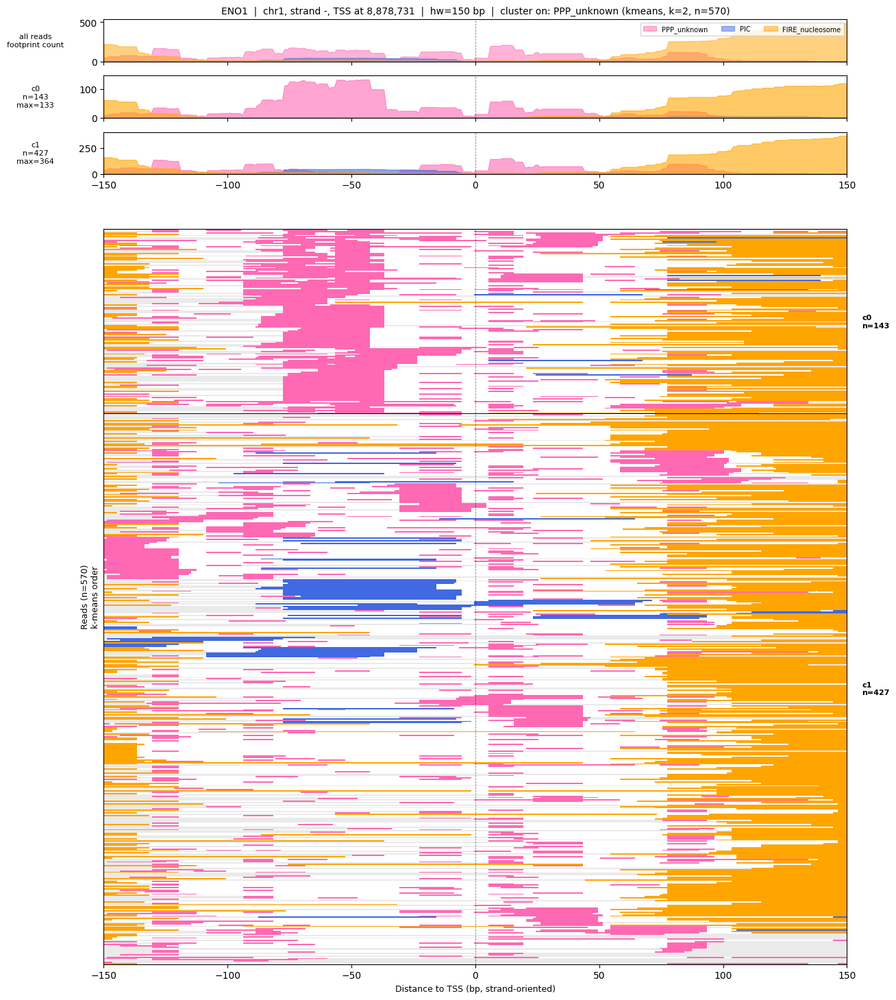

/home/cshan/ipykernel_3161704/1366527141.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/31samples_pooled/ENO1_w300_single_PPP_unknown_kmeans_cluster_panels_k2.pdf


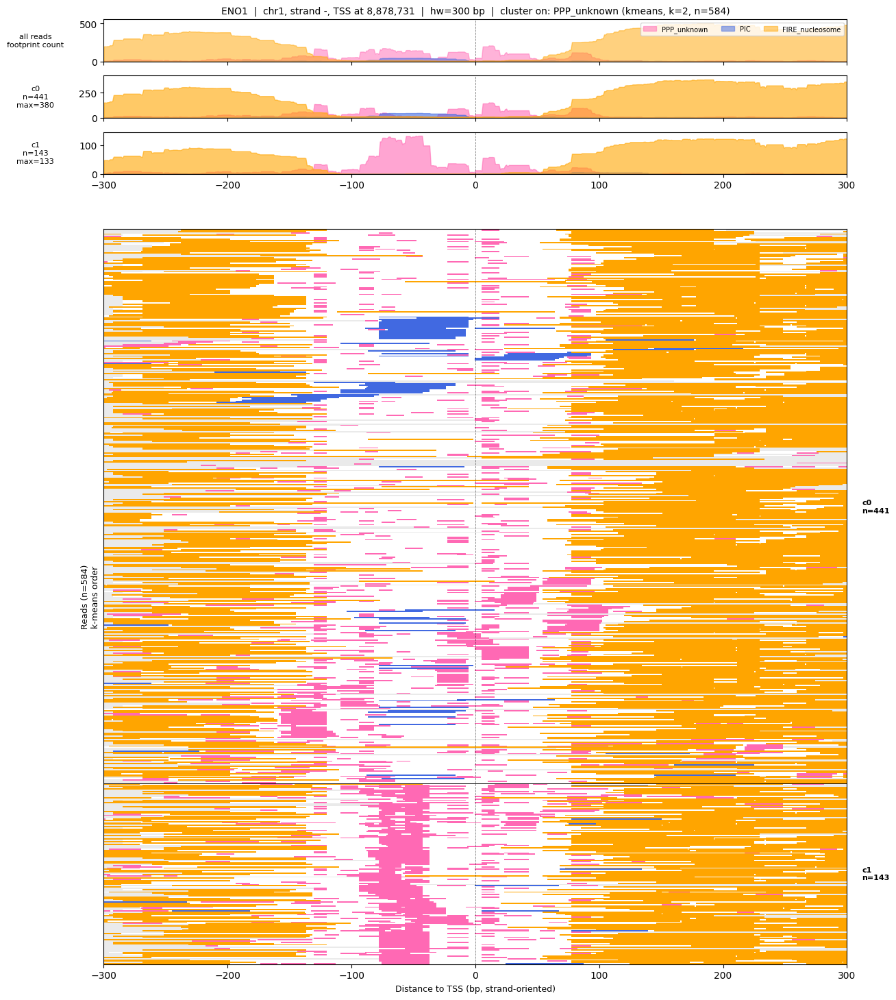

/home/cshan/ipykernel_3161704/1366527141.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/31samples_pooled/ZCWPW1_w150_single_PPP_unknown_kmeans_cluster_panels_k2.pdf


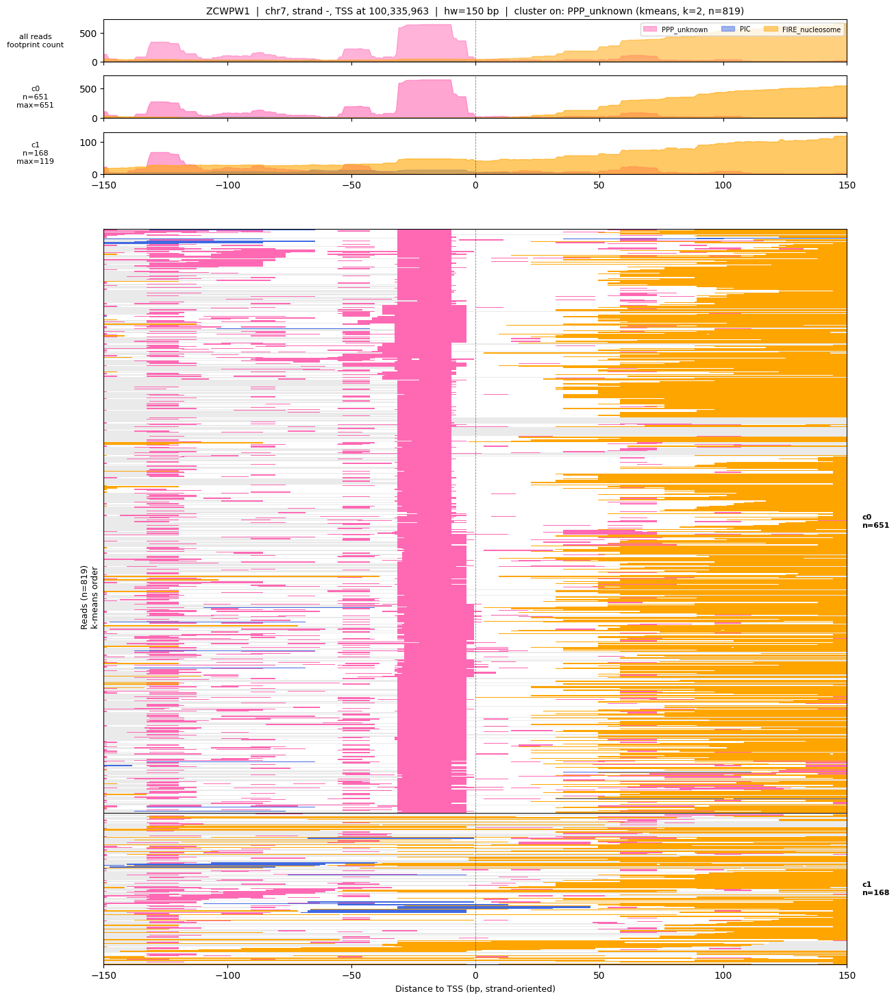

/home/cshan/ipykernel_3161704/1366527141.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/31samples_pooled/ZCWPW1_w300_single_PPP_unknown_kmeans_cluster_panels_k2.pdf


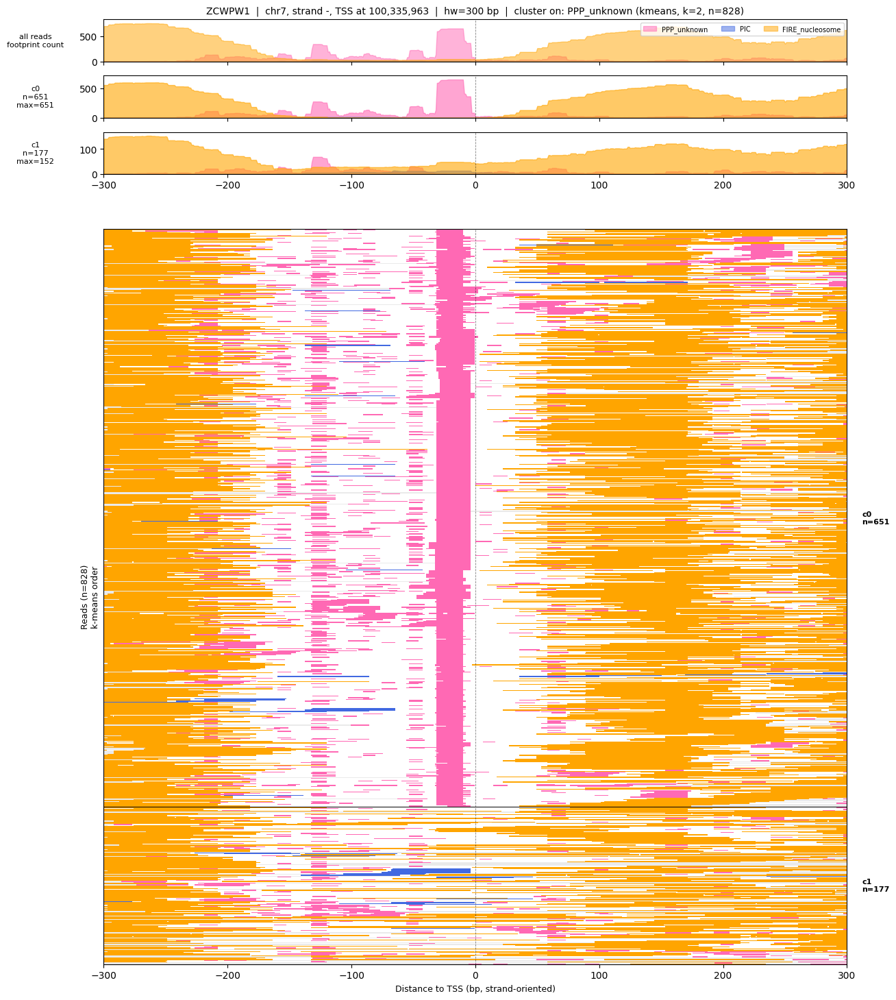

/home/cshan/ipykernel_3161704/1366527141.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/31samples_pooled/ENO1_w150_single_PIC_kmeans_cluster_panels_k9.pdf


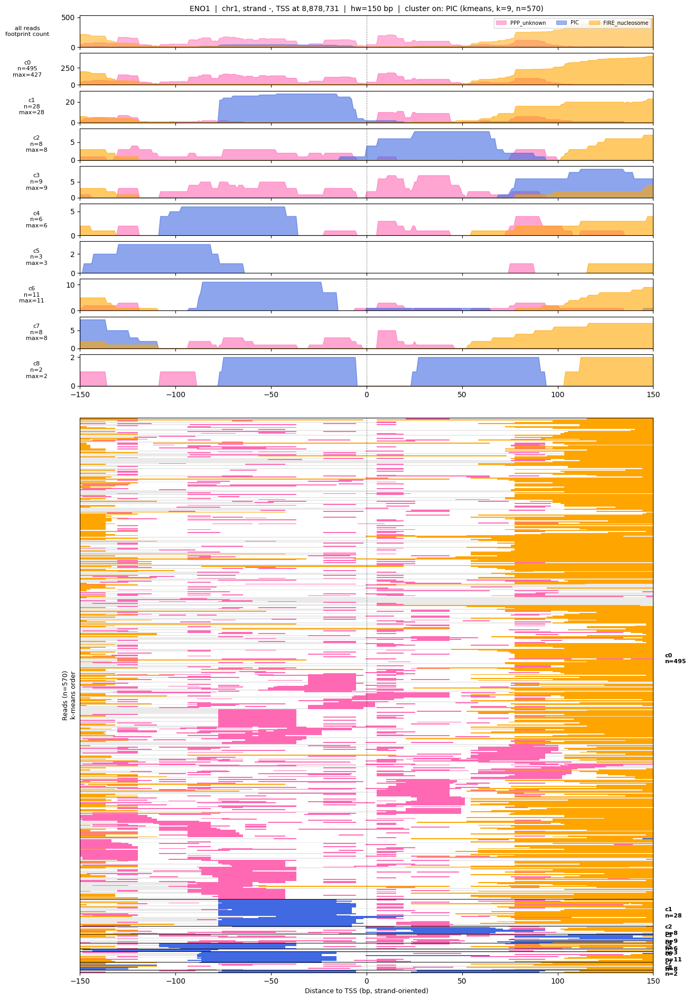

/home/cshan/ipykernel_3161704/1366527141.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/31samples_pooled/ENO1_w300_single_PIC_kmeans_cluster_panels_k8.pdf


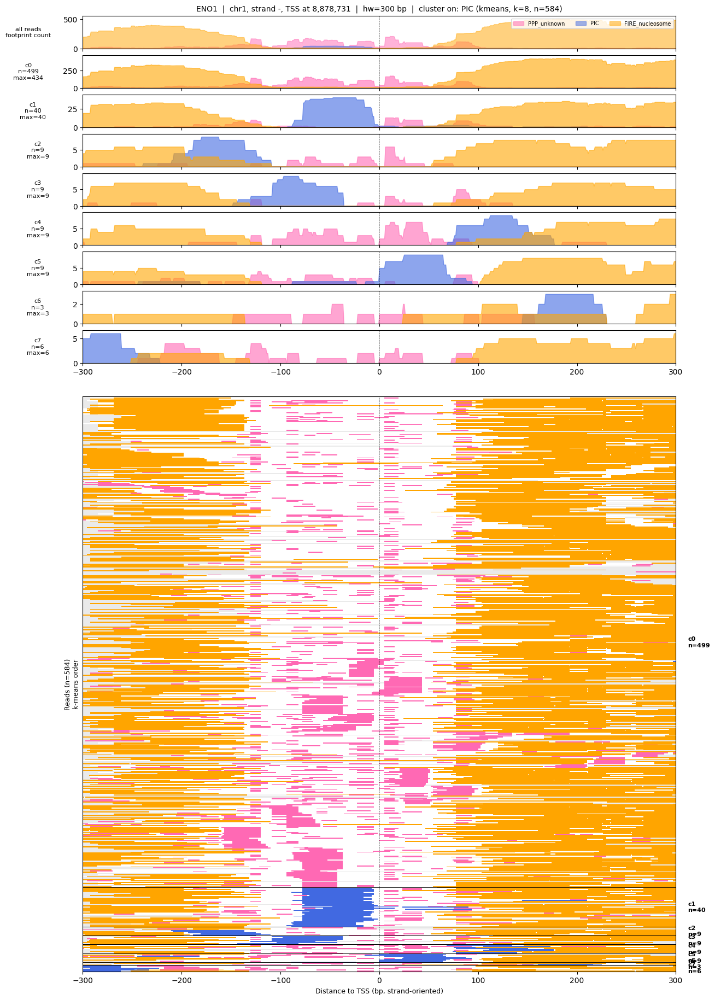

/home/cshan/ipykernel_3161704/1366527141.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/31samples_pooled/ZCWPW1_w150_single_PIC_kmeans_cluster_panels_k7.pdf


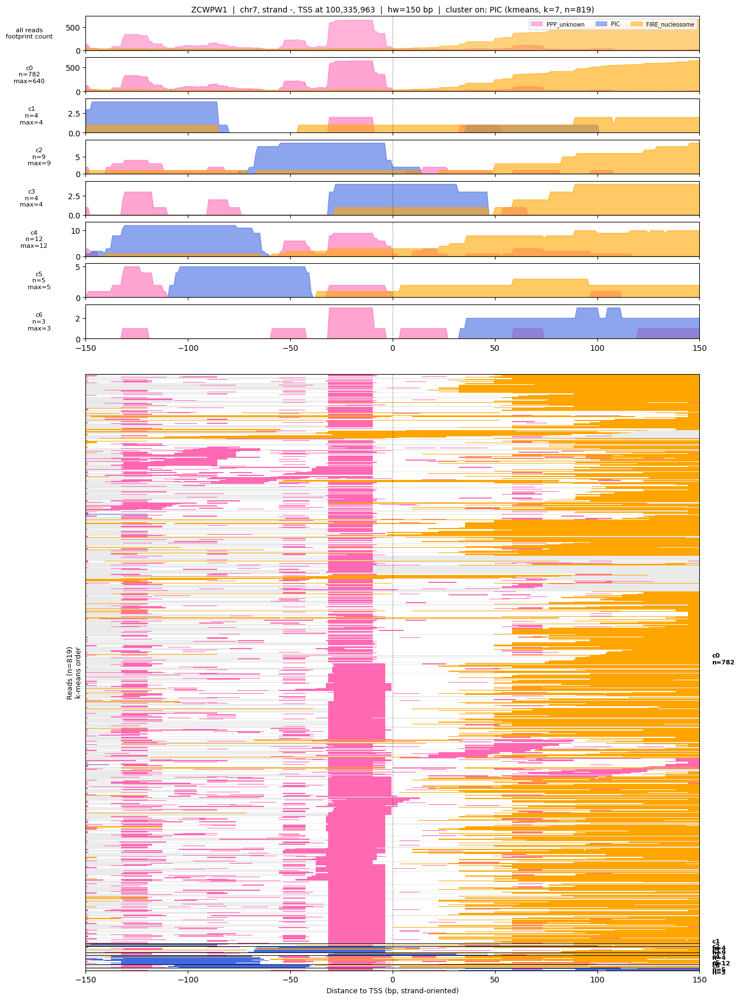

/home/cshan/ipykernel_3161704/1366527141.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/31samples_pooled/ZCWPW1_w300_single_PIC_kmeans_cluster_panels_k9.pdf


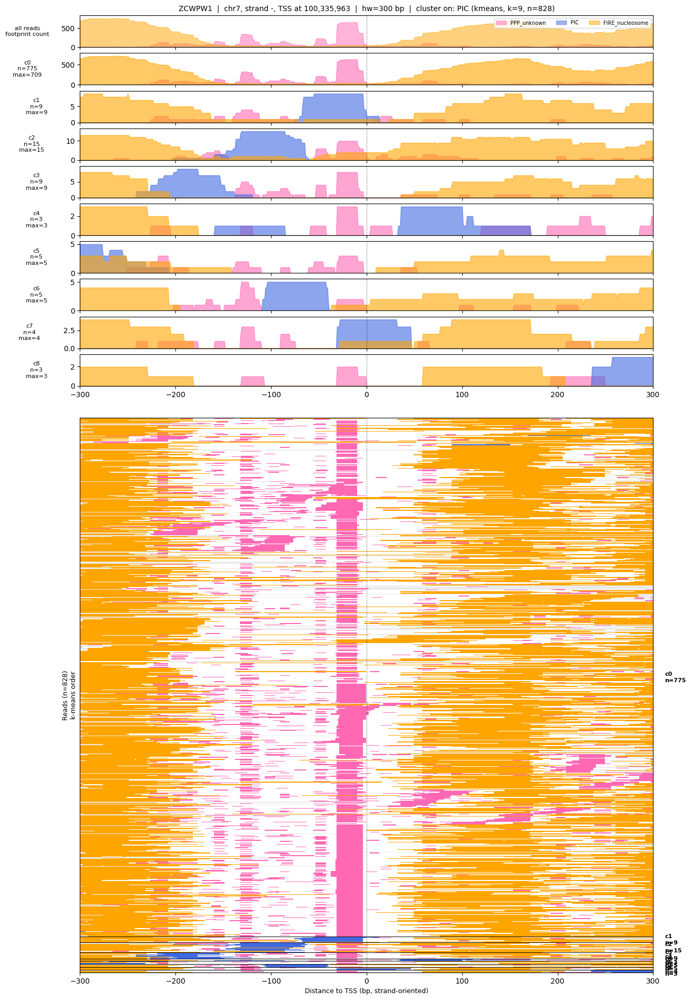

/home/cshan/ipykernel_3161704/1366527141.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/31samples_pooled/ENO1_w150_single_FIRE_nucleosome_kmeans_cluster_panels_k8.pdf


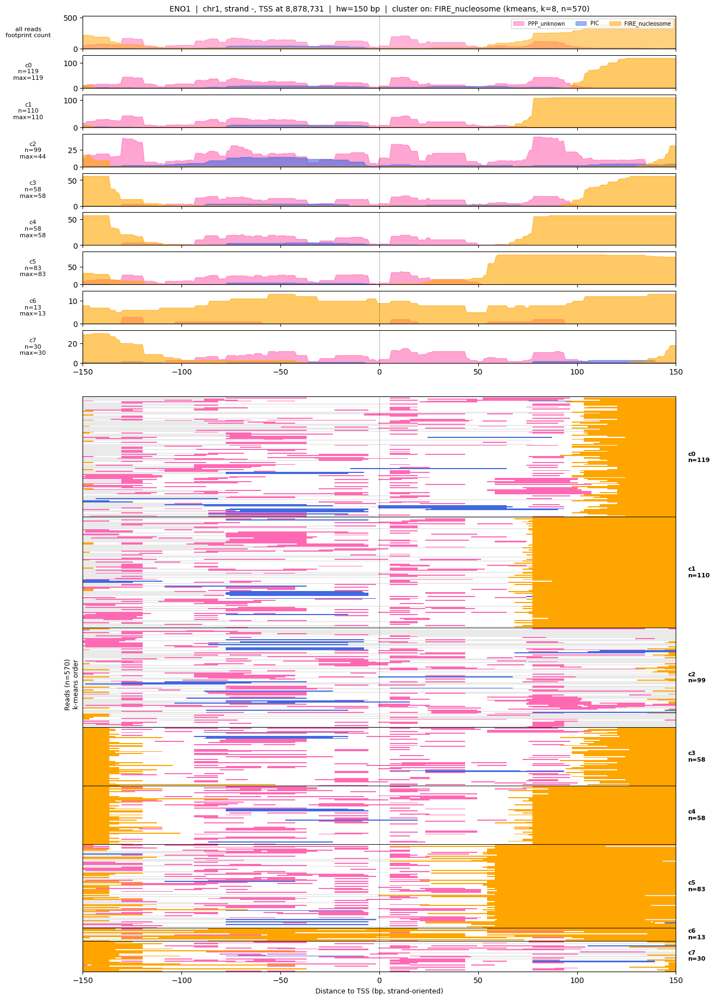

/home/cshan/ipykernel_3161704/1366527141.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/31samples_pooled/ENO1_w300_single_FIRE_nucleosome_kmeans_cluster_panels_k2.pdf


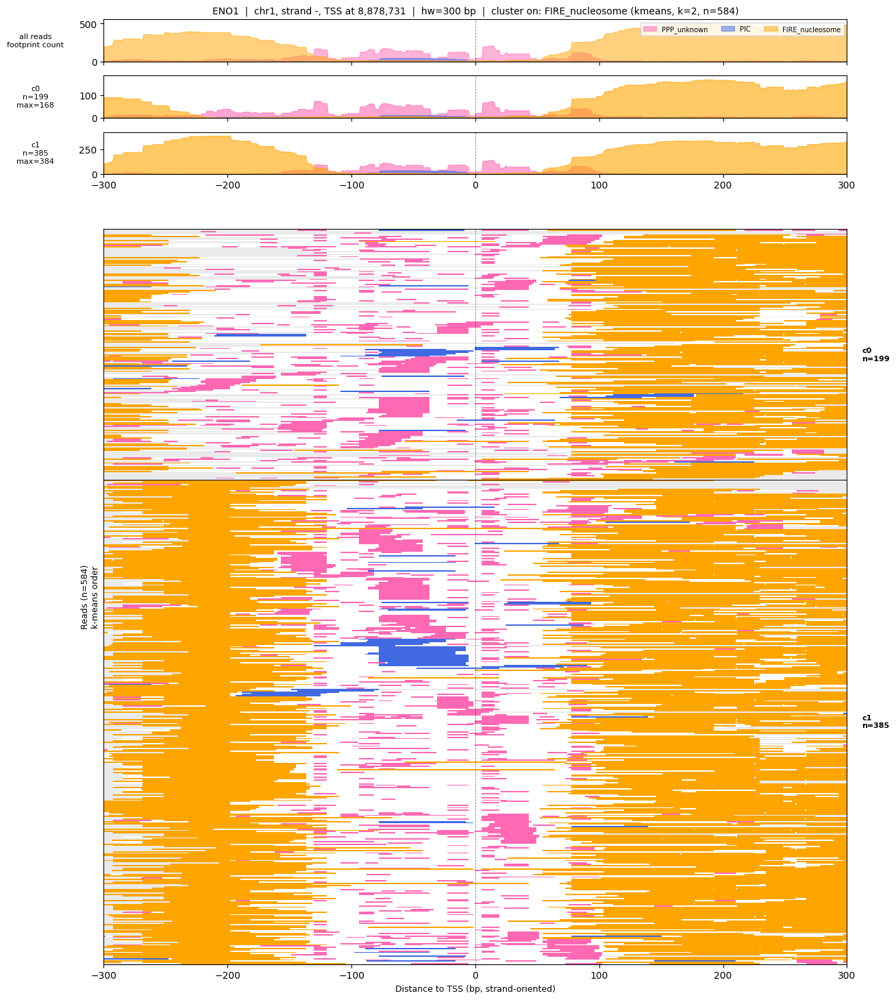

/home/cshan/ipykernel_3161704/1366527141.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/31samples_pooled/ZCWPW1_w150_single_FIRE_nucleosome_kmeans_cluster_panels_k9.pdf


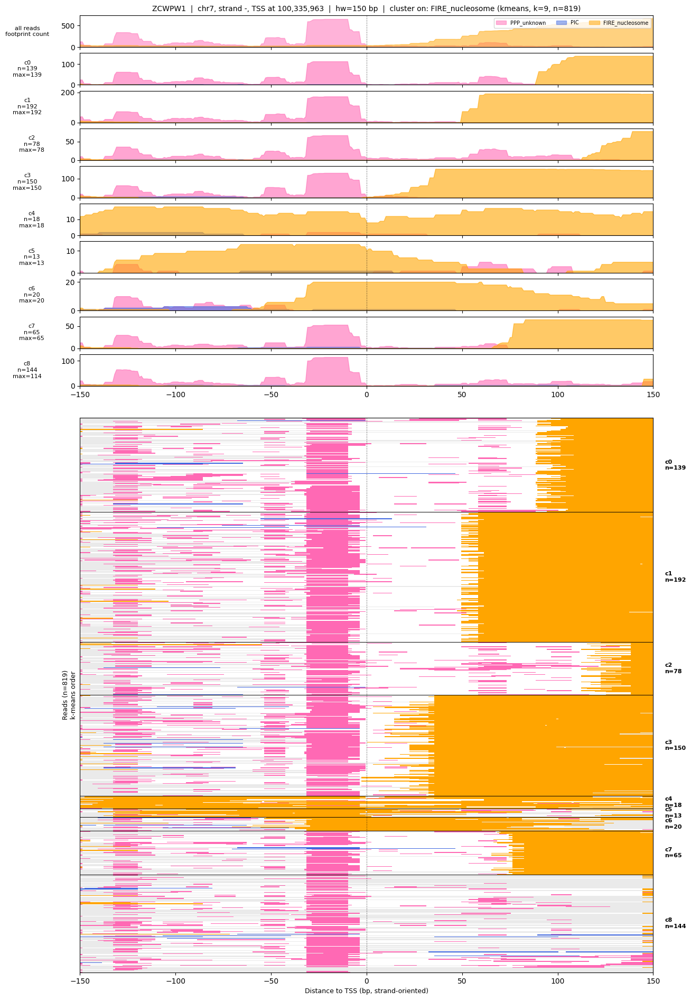

/home/cshan/ipykernel_3161704/1366527141.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_single_FP_class/31samples_pooled/ZCWPW1_w300_single_FIRE_nucleosome_kmeans_cluster_panels_k2.pdf


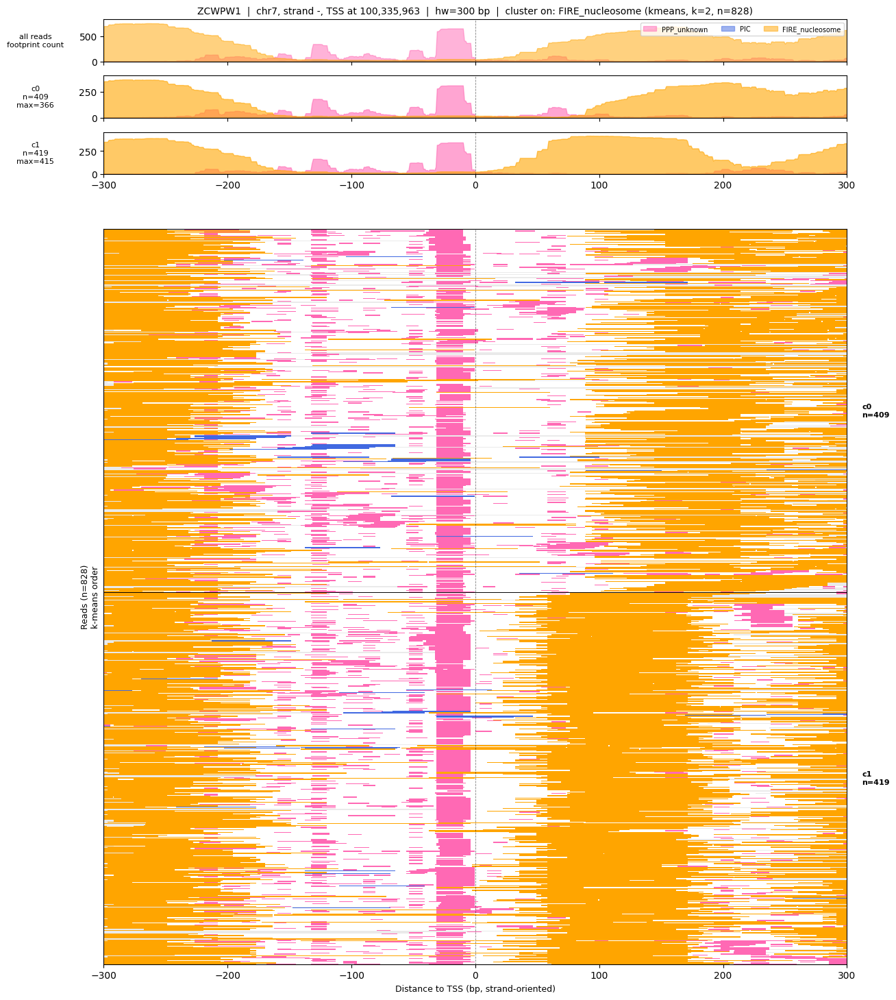

In [20]:
def plot_sc_cluster_panels(driving_cls, gene_name, hw, res):
    occ        = res["occ"]
    aligned    = res["aligned"]
    classes    = res["classes"]
    chrom      = res["chrom"]
    strand     = res["strand"]
    tss        = res["tss"]
    k          = res["k"]
    labels     = res["labels"]
    leaf_order = res["leaf_order"]
    method     = res["method"]
    n_classes, n_reads, n_pos = occ.shape
    rel_pos    = np.arange(-hw, hw + 1)

    sizes = {c: int((labels == c).sum()) for c in range(k)}
    present_clusters = [c for c in range(k) if sizes[c] > 0]

    profiles = {}
    for cluster_id in range(k):
        cluster_mask = (labels == cluster_id)
        profiles[cluster_id] = {}
        for ci, cls in enumerate(classes):
            if cluster_mask.sum() == 0:
                profiles[cluster_id][cls] = np.zeros(n_pos)
            else:
                profiles[cluster_id][cls] = occ[ci, cluster_mask].sum(axis=0)

    combined = {cls: occ[ci].sum(axis=0) for ci, cls in enumerate(classes)}
    combined_ymax = max((v.max() for v in combined.values()), default=1.0)
    combined_ymax = max(combined_ymax, 1.0)

    order = np.asarray(leaf_order, dtype=int)
    labels_sorted = labels[order]

    img = np.tile(np.array(WHITE_RGB, dtype=np.float32), (n_reads, n_pos, 1))
    img[~aligned] = UNCOVERED_RGB
    for ci, cls in enumerate(classes):
        if cls not in SC_FP_COLORS:
            continue
        rgb  = np.array(mcolors.to_rgb(SC_FP_COLORS[cls]), dtype=np.float32)
        mask = occ[ci] > 0
        img[mask] = rgb
    img_sorted = img[order]

    n_top_tracks = len(present_clusters) + 1
    bot_height   = min(14.0, max(3.5, 0.05 * n_reads))
    spacer       = 0.5
    fig_height   = 0.8 * n_top_tracks + bot_height + spacer + 1.0

    fig = plt.figure(figsize=(14, fig_height))
    gs = plt.GridSpec(
        n_top_tracks + 2, 1,
        height_ratios=[0.8] * n_top_tracks + [spacer] + [bot_height],
        hspace=0.08,
    )
    ax_combined = fig.add_subplot(gs[0])
    per_cluster_axes = {
        c: fig.add_subplot(gs[1 + i], sharex=ax_combined)
        for i, c in enumerate(present_clusters)
    }
    ax_bot = fig.add_subplot(gs[n_top_tracks + 1], sharex=ax_combined)

    for cls in classes:
        if cls not in SC_FP_COLORS:
            continue
        ax_combined.fill_between(rel_pos, 0, combined[cls],
                                 color=SC_FP_COLORS[cls], alpha=0.5, label=cls)
    ax_combined.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
    ax_combined.set_xlim(-hw, hw)
    ax_combined.set_ylim(0, combined_ymax * 1.1)
    ax_combined.set_ylabel("all reads\nfootprint count", fontsize=8,
                           rotation=0, labelpad=46, va="center")
    ax_combined.set_title(
        f"{gene_name}  |  {chrom}, strand {strand}, TSS at {tss:,}  |  "
        f"hw={hw} bp  |  cluster on: {driving_cls} ({method}, k={k}, n={n_reads})",
        fontsize=10,
    )
    ax_combined.legend(loc="upper right", fontsize=7, ncol=min(n_classes, 5))
    plt.setp(ax_combined.get_xticklabels(), visible=False)

    last_idx = len(present_clusters) - 1
    for i, cluster_id in enumerate(present_clusters):
        ax = per_cluster_axes[cluster_id]
        for cls in classes:
            if cls not in SC_FP_COLORS:
                continue
            ax.fill_between(rel_pos, 0, profiles[cluster_id][cls],
                            color=SC_FP_COLORS[cls], alpha=0.6)
        ax.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
        ax.set_xlim(-hw, hw)
        cluster_ymax = max(
            (profiles[cluster_id][cls].max() for cls in classes if cls in SC_FP_COLORS),
            default=1.0,
        )
        cluster_ymax = max(cluster_ymax, 1.0)
        ax.set_ylim(0, cluster_ymax * 1.1)
        ax.set_ylabel(
            f"c{cluster_id}\nn={sizes[cluster_id]}\nmax={int(cluster_ymax)}",
            fontsize=8, rotation=0, labelpad=46, va="center",
        )
        if i < last_idx:
            plt.setp(ax.get_xticklabels(), visible=False)

    ax_bot.imshow(img_sorted, aspect="auto", interpolation="nearest",
                  extent=[-hw - 0.5, hw + 0.5, n_reads, 0])
    ax_bot.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
    boundaries = np.where(np.diff(labels_sorted) != 0)[0] + 1
    for b in boundaries:
        ax_bot.axhline(b - 0.5, color="black", lw=0.7)
    label_x = hw + (2 * hw) * 0.02
    for c in present_clusters:
        idx = np.where(labels_sorted == c)[0]
        if len(idx):
            ax_bot.text(label_x, (idx.min() + idx.max()) / 2,
                        f"c{c}\nn={sizes[c]}", fontsize=8, va="center",
                        color="black", fontweight="bold")
    ax_bot.set_xlim(-hw, hw)
    ax_bot.set_ylim(n_reads, -1)
    ax_bot.set_yticks([])
    order_label = "Ward leaf order" if method == "ward" else "k-means order"
    ax_bot.set_ylabel(f"Reads (n={n_reads})\n{order_label}", fontsize=9)
    ax_bot.set_xlabel("Distance to TSS (bp, strand-oriented)", fontsize=9)

    plt.tight_layout()
    tag = driving_cls.replace(" ", "_").replace("(", "").replace(")", "")
    out_pdf = SC_OUT_ROOT / f"{gene_name}_w{hw}_single_{tag}_{method}_cluster_panels_k{k}.pdf"
    fig.savefig(out_pdf, bbox_inches="tight")
    print(f"  wrote: {out_pdf}")
    plt.show()


for (driving_cls, gene_name, hw), res in sc_cluster_results.items():
    plot_sc_cluster_panels(driving_cls, gene_name, hw, res)

# Cluster by TSS-proximal region (-100 to +10 bp)

Three-class binary occupancy matrices (PPP_unknown, PIC, FIRE_nucleosome)
are built with a display half-window of 300 bp, but clustering uses only
the **-100 to +10 bp** TSS-relative columns (concatenated across all three
classes). Set `CLUSTER_METHOD` to `"ward"` (dendrogram leaf order) or
`"kmeans"` (silhouette-based k, rows sorted by cluster).

Genes in this section (hard-coded coordinates, not from the pausing table):

| Gene   | Chrom | Strand | TSS         |
|--------|-------|--------|-------------|
| ALAS1  | chr3  | +      | 52,198,093  |
| ENO1   | chr1  | -      |  8,878,731  |
| ZCWPW1 | chr7  | -      | 100,335,963 |

### 1. Setup and multi-class occupancy matrix build.

In [24]:
import sys, numpy as np, pandas as pd, matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from pathlib import Path

sys.path.insert(0, "/project/spott/cshan/fiber-seq/code/PolII_footprints_code")
from plot_polii_footprints_precomputed_sort import (
    collect_reads_from_indexed_beds,
    _filter_fire_nucleosome_by_length,
    DEFAULT_FP_BED_DIR,
    DEFAULT_FIRE_NUC_LENGTH_RANGE,
    FP_COLORS,
)

TSS_GENES = pd.DataFrame([
    {"gene_name": "ALAS1",  "chrom": "chr3", "strand": "+", "tss_anchor": 52198093},
    {"gene_name": "ENO1",   "chrom": "chr1", "strand": "-", "tss_anchor": 8878731},
    {"gene_name": "ZCWPW1", "chrom": "chr7", "strand": "-", "tss_anchor": 100335963},
])

FP_CLASSES = [
    "PPP_unknown",
    "PIC",
    "FIRE_nucleosome",
]
SOURCE_CLASSES = {
    "PPP_unknown": ["PPP", "unknown"],
    "PIC": ["PIC"],
    "FIRE_nucleosome": ["FIRE_nucleosome"],
}
TSS_FP_COLORS = {
    "PPP_unknown": "#FF69B4",
    "PIC": "#4169E1",
    "FIRE_nucleosome": "#FFA500",
}

TSS_HW                     = 300
CLUSTER_REL_START          = -100
CLUSTER_REL_END            = 10
FILTER_FIRE_NUC_BY_LENGTH  = False
FIRE_NUC_LENGTH_RANGE      = DEFAULT_FIRE_NUC_LENGTH_RANGE
TSS_BIN_BP                 = 1
TSS_TOP_MERGES             = 20
UNCOVERED_RGB              = (0.92, 0.92, 0.92)
WHITE_RGB                  = (1.00, 1.00, 1.00)

CLUSTER_METHOD = "kmeans"   # "ward" or "kmeans"
K_RANGE = list(range(2, 10))

TSS_OUT_ROOT = Path(
    "/project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/"
    "31samples_pooled"
)
TSS_OUT_ROOT.mkdir(parents=True, exist_ok=True)

print(f"Genes                : {list(TSS_GENES['gene_name'])}")
print(f"Display half-window  : {TSS_HW} bp")
print(f"Clustering region    : [{CLUSTER_REL_START}, {CLUSTER_REL_END}] bp rel. to TSS")
print(f"Bin size             : {TSS_BIN_BP} bp")
print(f"Classes              : {FP_CLASSES}")
print(f"Source mapping       : {SOURCE_CLASSES}")
print(f"Cluster method       : {CLUSTER_METHOD}")
print(f"Output dir           : {TSS_OUT_ROOT}\n")

tss_matrices = {}
for _, g in TSS_GENES.iterrows():
    gene_name = g["gene_name"]
    chrom     = g["chrom"]
    strand    = g["strand"]
    tss       = int(g["tss_anchor"])
    hw        = TSS_HW

    view_start = max(0, tss - hw)
    view_end   = tss + hw
    n_pos      = 2 * hw + 1

    read_spans = collect_reads_from_indexed_beds(
        chrom, view_start, view_end,
        fp_class="all", beds_dir=DEFAULT_FP_BED_DIR,
    )

    per_class_reads = {}
    for cls, sources in SOURCE_CLASSES.items():
        merged = {}
        for src in sources:
            src_reads = collect_reads_from_indexed_beds(
                chrom, view_start, view_end,
                fp_class=src, beds_dir=DEFAULT_FP_BED_DIR,
            )
            for read_name, fps in src_reads.items():
                merged.setdefault(read_name, []).extend(fps)
        per_class_reads[cls] = merged
    if FILTER_FIRE_NUC_BY_LENGTH and "FIRE_nucleosome" in per_class_reads:
        per_class_reads["FIRE_nucleosome"] = _filter_fire_nucleosome_by_length(
            per_class_reads["FIRE_nucleosome"], FIRE_NUC_LENGTH_RANGE
        )

    read_ids = list(read_spans.keys())
    n_reads  = len(read_ids)
    n_cls    = len(FP_CLASSES)

    occ     = np.zeros((n_cls, n_reads, n_pos), dtype=np.float32)
    aligned = np.zeros((n_reads, n_pos), dtype=bool)
    r_starts = np.zeros(n_reads, dtype=np.int64)
    r_ends   = np.zeros(n_reads, dtype=np.int64)

    def _rel_bounds(g_start, g_end_excl, _strand=strand, _tss=tss, _hw=hw):
        g_end_incl = g_end_excl - 1
        if _strand == "+":
            rel_lo = g_start    - _tss
            rel_hi = g_end_incl - _tss
        else:
            rel_lo = _tss - g_end_incl
            rel_hi = _tss - g_start
        return max(rel_lo, -_hw), min(rel_hi, _hw)

    for i, read_name in enumerate(read_ids):
        span_fps = read_spans[read_name]
        r_starts[i] = min(fp[0] for fp in span_fps)
        r_ends[i]   = max(fp[1] for fp in span_fps)

        rel_lo, rel_hi = _rel_bounds(r_starts[i], r_ends[i])
        if rel_lo <= rel_hi:
            aligned[i, rel_lo + hw : rel_hi + hw + 1] = True

        for ci, cls in enumerate(FP_CLASSES):
            for fp in per_class_reads[cls].get(read_name, []):
                rel_lo, rel_hi = _rel_bounds(fp[0], fp[1])
                if rel_lo <= rel_hi:
                    occ[ci, i, rel_lo + hw : rel_hi + hw + 1] = 1.0

    tss_matrices[gene_name] = {
        "read_ids": read_ids,
        "occ":      occ,
        "aligned":  aligned,
        "r_start":  r_starts,
        "r_end":    r_ends,
        "chrom":    chrom,
        "strand":   strand,
        "tss":      tss,
        "hw":       hw,
        "classes":  list(FP_CLASSES),
    }
    print(f"  {gene_name} hw={hw}: n_reads={n_reads}")
    for ci, cls in enumerate(FP_CLASSES):
        n_with = int((occ[ci].sum(axis=1) > 0).sum())
        print(f"    {cls:24s}: {n_with} reads with >=1 footprint")

Genes                : ['ALAS1', 'ENO1', 'ZCWPW1']
Display half-window  : 300 bp
Clustering region    : [-100, 10] bp rel. to TSS
Bin size             : 1 bp
Classes              : ['PPP_unknown', 'PIC', 'FIRE_nucleosome']
Source mapping       : {'PPP_unknown': ['PPP', 'unknown'], 'PIC': ['PIC'], 'FIRE_nucleosome': ['FIRE_nucleosome']}
Cluster method       : kmeans
Output dir           : /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/31samples_pooled

  ALAS1 hw=300: n_reads=648
    PPP_unknown             : 577 reads with >=1 footprint
    PIC                     : 90 reads with >=1 footprint
    FIRE_nucleosome         : 644 reads with >=1 footprint


[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr3_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr3_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi


  ENO1 hw=300: n_reads=584
    PPP_unknown             : 525 reads with >=1 footprint
    PIC                     : 86 reads with >=1 footprint
    FIRE_nucleosome         : 577 reads with >=1 footprint
  ZCWPW1 hw=300: n_reads=828
    PPP_unknown             : 797 reads with >=1 footprint
    PIC                     : 58 reads with >=1 footprint
    FIRE_nucleosome         : 824 reads with >=1 footprint


[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr1_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi
[W::hts_idx_load3] The index file is older than the data file: /project/spott/cshan/fiber-seq/results/PolII/footprint_summary_beds/FIRE_nucleosome/chr7_footprints.bed.gz.tbi


### 2. Clustering on the TSS-proximal region.

For each gene, the columns corresponding to positions **-100 to +10 bp**
(relative to TSS) are extracted from every class's occupancy matrix,
bin-smoothed, and horizontally concatenated into a single feature matrix.
If `CLUSTER_METHOD == "ward"`: Ward linkage + elbow-gap *k* selection,
rows ordered by dendrogram. If `CLUSTER_METHOD == "kmeans"`: silhouette-
based *k*, rows sorted by cluster label. Results used for all downstream
plots, which show the full display window.

In [25]:
from scipy.cluster.hierarchy import linkage, fcluster, leaves_list
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


def _tss_bin_smooth_mean(X, bin_bp):
    n_reads, n_pos = X.shape
    n_bin = n_pos // bin_bp
    trimmed = X[:, : n_bin * bin_bp].reshape(n_reads, n_bin, bin_bp)
    return trimmed.mean(axis=2)


def _tss_ward_elbow_k(Z, top_merges=TSS_TOP_MERGES):
    distances = Z[:, 2]
    n_merges  = len(distances)
    if n_merges < 2:
        return np.zeros(n_merges + 1, dtype=int), 1, float("inf")

    n_top = min(top_merges, n_merges)
    top   = distances[-n_top:]
    diffs = np.diff(top)
    gap_idx = int(np.argmax(diffs))
    cut_h   = float(0.5 * (top[gap_idx] + top[gap_idx + 1]))
    labels  = fcluster(Z, t=cut_h, criterion="distance") - 1
    k_pick  = int(len(np.unique(labels)))

    if k_pick < 2:
        cut_h  = float(0.5 * (distances[-2] + distances[-1]))
        labels = fcluster(Z, t=cut_h, criterion="distance") - 1
        k_pick = int(len(np.unique(labels)))
    return labels, k_pick, cut_h


def _tss_kmeans_best_k(X, k_range):
    best_k, best_score, best_labels = 2, -1, None
    for k in k_range:
        if k >= X.shape[0]:
            break
        km = KMeans(n_clusters=k, n_init=10, random_state=42)
        labs = km.fit_predict(X)
        if len(np.unique(labs)) < 2:
            continue
        score = silhouette_score(X, labs)
        if score > best_score:
            best_k, best_score, best_labels = k, score, labs
    if best_labels is None:
        best_labels = np.zeros(X.shape[0], dtype=int)
        best_k = 1
    return best_labels, best_k, best_score


col_start = TSS_HW + CLUSTER_REL_START
col_end   = TSS_HW + CLUSTER_REL_END + 1
print(f"Clustering columns: [{col_start}, {col_end})  "
      f"= positions [{CLUSTER_REL_START}, {CLUSTER_REL_END}] bp  "
      f"({col_end - col_start} positions)")
print(f"Cluster method: {CLUSTER_METHOD}\n")

tss_cluster_results = {}
for gene_name, info in tss_matrices.items():
    occ = info["occ"]
    n_classes, n_reads, n_pos = occ.shape

    if n_reads < 2:
        print(f"{gene_name}: only {n_reads} reads, skipping")
        continue

    binned_parts = []
    for ci in range(n_classes):
        region = occ[ci][:, col_start:col_end]
        binned_parts.append(_tss_bin_smooth_mean(region, TSS_BIN_BP))
    X = np.concatenate(binned_parts, axis=1)

    if CLUSTER_METHOD == "ward":
        Z = linkage(X, method="ward")
        leaf_order = leaves_list(Z)
        labels, best_k, cut_height = _tss_ward_elbow_k(Z)
    else:
        labels, best_k, _ = _tss_kmeans_best_k(X, K_RANGE)
        Z = None
        leaf_order = np.argsort(labels)

    tss_cluster_results[gene_name] = {
        **info,
        "X":           X,
        "linkage":     Z,
        "leaf_order":  leaf_order,
        "labels":      labels,
        "k":           best_k,
        "method":      CLUSTER_METHOD,
    }

    sizes = {c: int((labels == c).sum()) for c in range(best_k)}
    print(f"=== {gene_name} (n_reads={n_reads}, "
          f"cluster region [{CLUSTER_REL_START},{CLUSTER_REL_END}] bp, "
          f"bin={TSS_BIN_BP} bp, method={CLUSTER_METHOD}) ===")
    if CLUSTER_METHOD == "ward":
        print(f"  Ward elbow -> k={best_k}  (cut height {cut_height:.3f})")
    else:
        print(f"  K-means silhouette -> k={best_k}")
    for c, n in sorted(sizes.items()):
        print(f"  c{c}: n={n}")

    np.save(TSS_OUT_ROOT / f"{gene_name}_hw{TSS_HW}_tss_proximal_{CLUSTER_METHOD}_labels_k{best_k}.npy",
            labels)
    pd.DataFrame({
        "read_id": info["read_ids"],
        "cluster": labels,
    }).to_csv(TSS_OUT_ROOT / f"{gene_name}_hw{TSS_HW}_tss_proximal_{CLUSTER_METHOD}_clusters_k{best_k}.tsv",
              sep="\t", index=False)

print(f"\n--- {len(tss_cluster_results)} clustering results stored ---")

Clustering columns: [200, 311)  = positions [-100, 10] bp  (111 positions)
Cluster method: kmeans

=== ALAS1 (n_reads=648, cluster region [-100,10] bp, bin=1 bp, method=kmeans) ===
  K-means silhouette -> k=2
  c0: n=593
  c1: n=55
=== ENO1 (n_reads=584, cluster region [-100,10] bp, bin=1 bp, method=kmeans) ===
  K-means silhouette -> k=5
  c0: n=105
  c1: n=290
  c2: n=125
  c3: n=47
  c4: n=17
=== ZCWPW1 (n_reads=828, cluster region [-100,10] bp, bin=1 bp, method=kmeans) ===
  K-means silhouette -> k=2
  c0: n=652
  c1: n=176

--- 3 clustering results stored ---


### 3. Per-cluster class-occupancy tracks + per-read heatmap.

Full display window (`hw=300 bp`) is shown, but reads are ordered and
grouped by the clustering on the narrow **-100 to +10 bp** region.
Vertical dashed lines mark the clustering region boundaries.
For Ward: dendrogram leaf order. For k-means: sorted by cluster label.

/home/cshan/ipykernel_3161704/3880104023.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/31samples_pooled/ALAS1_hw300_tss_proximal_kmeans_cluster_panels_k2.pdf


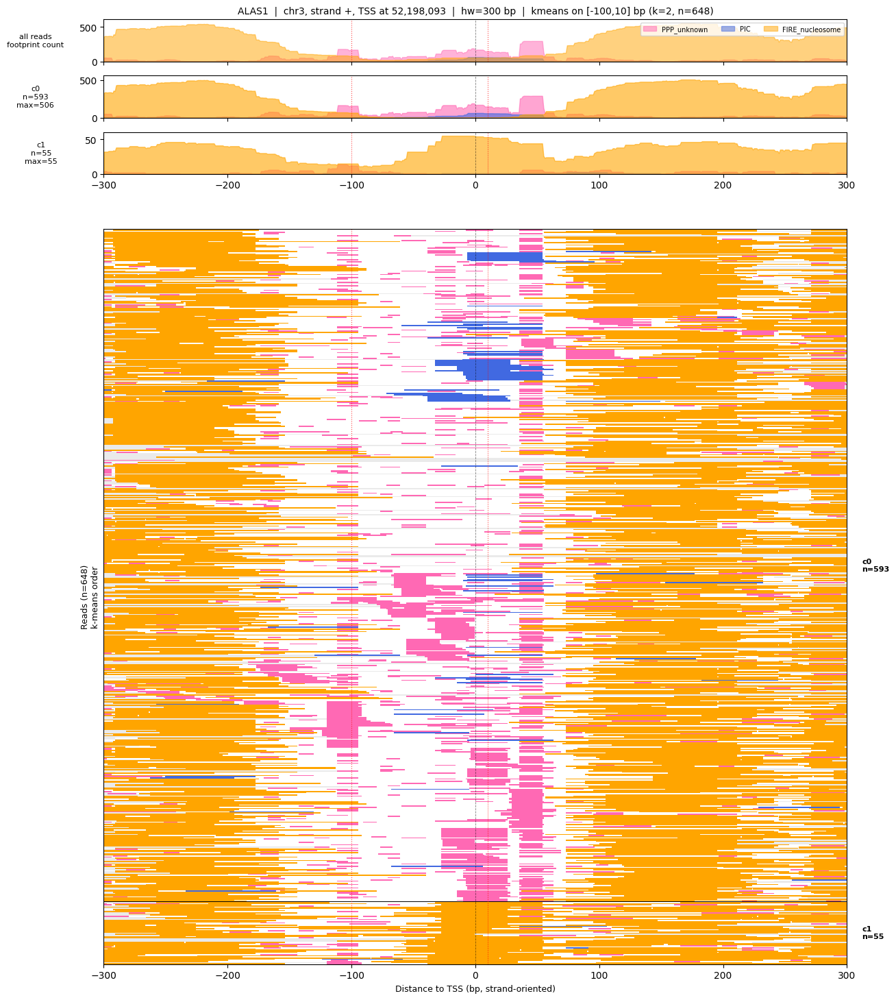

/home/cshan/ipykernel_3161704/3880104023.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/31samples_pooled/ENO1_hw300_tss_proximal_kmeans_cluster_panels_k5.pdf


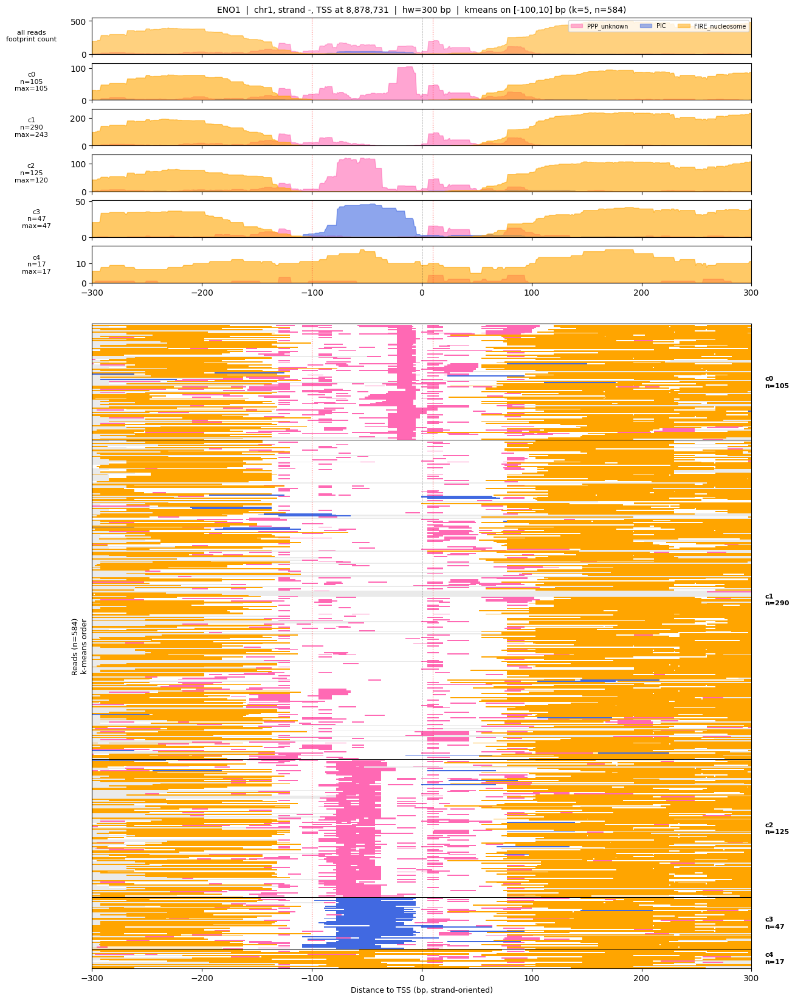

/home/cshan/ipykernel_3161704/3880104023.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/31samples_pooled/ZCWPW1_hw300_tss_proximal_kmeans_cluster_panels_k2.pdf


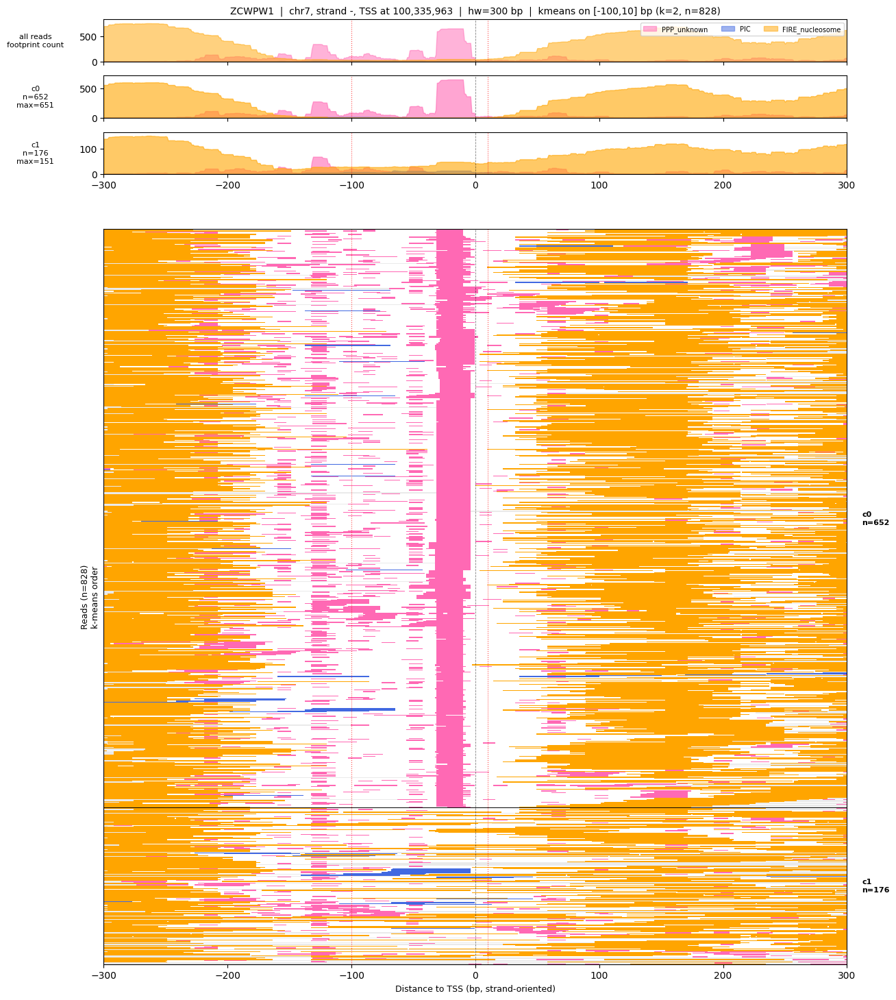

In [26]:
def plot_tss_proximal_panels(gene_name, res):
    occ        = res["occ"]
    aligned    = res["aligned"]
    classes    = res["classes"]
    chrom      = res["chrom"]
    strand     = res["strand"]
    tss        = res["tss"]
    hw         = res["hw"]
    k          = res["k"]
    labels     = res["labels"]
    leaf_order = res["leaf_order"]
    method     = res["method"]
    n_classes, n_reads, n_pos = occ.shape
    rel_pos    = np.arange(-hw, hw + 1)

    sizes = {c: int((labels == c).sum()) for c in range(k)}
    present_clusters = [c for c in range(k) if sizes[c] > 0]

    profiles = {}
    for cluster_id in range(k):
        cluster_mask = (labels == cluster_id)
        profiles[cluster_id] = {}
        for ci, cls in enumerate(classes):
            if cluster_mask.sum() == 0:
                profiles[cluster_id][cls] = np.zeros(n_pos)
            else:
                profiles[cluster_id][cls] = occ[ci, cluster_mask].sum(axis=0)

    combined = {cls: occ[ci].sum(axis=0) for ci, cls in enumerate(classes)}
    combined_ymax = max((v.max() for v in combined.values()), default=1.0)
    combined_ymax = max(combined_ymax, 1.0)

    order = np.asarray(leaf_order, dtype=int)
    labels_sorted = labels[order]

    img = np.tile(np.array(WHITE_RGB, dtype=np.float32), (n_reads, n_pos, 1))
    img[~aligned] = UNCOVERED_RGB
    for ci, cls in enumerate(classes):
        if cls not in TSS_FP_COLORS:
            continue
        rgb  = np.array(mcolors.to_rgb(TSS_FP_COLORS[cls]), dtype=np.float32)
        mask = occ[ci] > 0
        img[mask] = rgb
    img_sorted = img[order]

    n_top_tracks = len(present_clusters) + 1
    bot_height   = min(14.0, max(3.5, 0.05 * n_reads))
    spacer       = 0.5
    fig_height   = 0.8 * n_top_tracks + bot_height + spacer + 1.0

    fig = plt.figure(figsize=(14, fig_height))
    gs = plt.GridSpec(
        n_top_tracks + 2, 1,
        height_ratios=[0.8] * n_top_tracks + [spacer] + [bot_height],
        hspace=0.08,
    )
    ax_combined = fig.add_subplot(gs[0])
    per_cluster_axes = {
        c: fig.add_subplot(gs[1 + i], sharex=ax_combined)
        for i, c in enumerate(present_clusters)
    }
    ax_bot = fig.add_subplot(gs[n_top_tracks + 1], sharex=ax_combined)
    all_axes = [ax_combined] + list(per_cluster_axes.values()) + [ax_bot]

    for cls in classes:
        if cls not in TSS_FP_COLORS:
            continue
        ax_combined.fill_between(rel_pos, 0, combined[cls],
                                 color=TSS_FP_COLORS[cls], alpha=0.5, label=cls)
    ax_combined.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
    ax_combined.set_xlim(-hw, hw)
    ax_combined.set_ylim(0, combined_ymax * 1.1)
    ax_combined.set_ylabel("all reads\nfootprint count", fontsize=8,
                           rotation=0, labelpad=46, va="center")
    ax_combined.set_title(
        f"{gene_name}  |  {chrom}, strand {strand}, TSS at {tss:,}  |  "
        f"hw={hw} bp  |  {method} on [{CLUSTER_REL_START},{CLUSTER_REL_END}] bp "
        f"(k={k}, n={n_reads})",
        fontsize=10,
    )
    ax_combined.legend(loc="upper right", fontsize=7, ncol=min(n_classes, 5))
    plt.setp(ax_combined.get_xticklabels(), visible=False)

    last_idx = len(present_clusters) - 1
    for i, cluster_id in enumerate(present_clusters):
        ax = per_cluster_axes[cluster_id]
        for cls in classes:
            if cls not in TSS_FP_COLORS:
                continue
            ax.fill_between(rel_pos, 0, profiles[cluster_id][cls],
                            color=TSS_FP_COLORS[cls], alpha=0.6)
        ax.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
        ax.set_xlim(-hw, hw)
        cluster_ymax = max(
            (profiles[cluster_id][cls].max() for cls in classes if cls in TSS_FP_COLORS),
            default=1.0,
        )
        cluster_ymax = max(cluster_ymax, 1.0)
        ax.set_ylim(0, cluster_ymax * 1.1)
        ax.set_ylabel(
            f"c{cluster_id}\nn={sizes[cluster_id]}\nmax={int(cluster_ymax)}",
            fontsize=8, rotation=0, labelpad=46, va="center",
        )
        if i < last_idx:
            plt.setp(ax.get_xticklabels(), visible=False)

    ax_bot.imshow(img_sorted, aspect="auto", interpolation="nearest",
                  extent=[-hw - 0.5, hw + 0.5, n_reads, 0])
    ax_bot.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
    boundaries = np.where(np.diff(labels_sorted) != 0)[0] + 1
    for b in boundaries:
        ax_bot.axhline(b - 0.5, color="black", lw=0.7)
    label_x = hw + (2 * hw) * 0.02
    for c in present_clusters:
        idx = np.where(labels_sorted == c)[0]
        if len(idx):
            ax_bot.text(label_x, (idx.min() + idx.max()) / 2,
                        f"c{c}\nn={sizes[c]}", fontsize=8, va="center",
                        color="black", fontweight="bold")

    for ax in all_axes:
        ax.axvline(CLUSTER_REL_START, color="red", lw=0.8, ls=":", alpha=0.7)
        ax.axvline(CLUSTER_REL_END, color="red", lw=0.8, ls=":", alpha=0.7)

    ax_bot.set_xlim(-hw, hw)
    ax_bot.set_ylim(n_reads, -1)
    ax_bot.set_yticks([])
    order_label = "Ward leaf order" if method == "ward" else "k-means order"
    ax_bot.set_ylabel(f"Reads (n={n_reads})\n{order_label}", fontsize=9)
    ax_bot.set_xlabel("Distance to TSS (bp, strand-oriented)", fontsize=9)

    plt.tight_layout()
    out_pdf = TSS_OUT_ROOT / f"{gene_name}_hw{hw}_tss_proximal_{method}_cluster_panels_k{k}.pdf"
    fig.savefig(out_pdf, bbox_inches="tight")
    print(f"  wrote: {out_pdf}")
    plt.show()


for gene_name, res in tss_cluster_results.items():
    plot_tss_proximal_panels(gene_name, res)

### 4. Per-class clustering on the same TSS-proximal region.

Same `[-100, +10]` bp clustering region and `hw=300` bp display window, but
this time clustering is driven by **one footprint class at a time**: only
that class's binned occupancy columns are used as features. Other classes
still appear in the plot but contribute nothing to the row ordering.
Uses whichever `CLUSTER_METHOD` is set (`"ward"` or `"kmeans"`).

In [27]:
tss_sc_cluster_results = {}

for driving_cls in FP_CLASSES:
    driving_ci = FP_CLASSES.index(driving_cls)

    for gene_name, info in tss_matrices.items():
        occ = info["occ"]
        n_classes, n_reads, n_pos = occ.shape

        if n_reads < 2:
            print(f"{gene_name}: only {n_reads} reads, skipping {driving_cls}")
            continue

        region = occ[driving_ci][:, col_start:col_end]
        X_single = _tss_bin_smooth_mean(region, TSS_BIN_BP)

        if CLUSTER_METHOD == "ward":
            Z = linkage(X_single, method="ward")
            leaf_order = leaves_list(Z)
            labels, best_k, cut_height = _tss_ward_elbow_k(Z)
        else:
            labels, best_k, _ = _tss_kmeans_best_k(X_single, K_RANGE)
            Z = None
            positions = np.arange(CLUSTER_REL_START, CLUSTER_REL_END + 1)
            center = np.full(region.shape[0], np.nan)
            for i in range(region.shape[0]):
                if region[i].sum() > 0:
                    center[i] = np.average(positions, weights=region[i])
            center_sort = np.where(np.isnan(center), np.inf, center)
            leaf_order = np.lexsort((center_sort, labels))

        tss_sc_cluster_results[(driving_cls, gene_name)] = {
            **info,
            "driving_class": driving_cls,
            "X":             X_single,
            "linkage":       Z,
            "leaf_order":    leaf_order,
            "labels":        labels,
            "k":             best_k,
            "method":        CLUSTER_METHOD,
        }

        sizes = {c: int((labels == c).sum()) for c in range(best_k)}
        tag = driving_cls.replace(" ", "_").replace("(", "").replace(")", "")
        print(f"=== {gene_name}  cluster on '{driving_cls}' "
              f"(n_reads={n_reads}, region [{CLUSTER_REL_START},{CLUSTER_REL_END}] bp, "
              f"bin={TSS_BIN_BP} bp, method={CLUSTER_METHOD}) ===")
        if CLUSTER_METHOD == "ward":
            print(f"  Ward elbow -> k={best_k}  (cut height {cut_height:.3f})")
        else:
            print(f"  K-means silhouette -> k={best_k}")
        for c, n in sorted(sizes.items()):
            print(f"  c{c}: n={n}")

        np.save(TSS_OUT_ROOT / f"{gene_name}_hw{TSS_HW}_tss_proximal_single_{tag}_{CLUSTER_METHOD}_labels_k{best_k}.npy",
                labels)
        pd.DataFrame({
            "read_id": info["read_ids"],
            "cluster": labels,
        }).to_csv(TSS_OUT_ROOT / f"{gene_name}_hw{TSS_HW}_tss_proximal_single_{tag}_{CLUSTER_METHOD}_clusters_k{best_k}.tsv",
                  sep="\t", index=False)

print(f"\n--- {len(tss_sc_cluster_results)} single-class clustering results stored ---")

=== ALAS1  cluster on 'PPP_unknown' (n_reads=648, region [-100,10] bp, bin=1 bp, method=kmeans) ===
  K-means silhouette -> k=9
  c0: n=230
  c1: n=33
  c2: n=55
  c3: n=40
  c4: n=91
  c5: n=42
  c6: n=39
  c7: n=89
  c8: n=29
=== ENO1  cluster on 'PPP_unknown' (n_reads=584, region [-100,10] bp, bin=1 bp, method=kmeans) ===
  K-means silhouette -> k=9
  c0: n=196
  c1: n=21
  c2: n=59
  c3: n=72
  c4: n=32
  c5: n=52
  c6: n=89
  c7: n=21
  c8: n=42
=== ZCWPW1  cluster on 'PPP_unknown' (n_reads=828, region [-100,10] bp, bin=1 bp, method=kmeans) ===
  K-means silhouette -> k=9
  c0: n=40
  c1: n=186
  c2: n=147
  c3: n=97
  c4: n=181
  c5: n=48
  c6: n=33
  c7: n=29
  c8: n=67
=== ALAS1  cluster on 'PIC' (n_reads=648, region [-100,10] bp, bin=1 bp, method=kmeans) ===
  K-means silhouette -> k=9
  c0: n=580
  c1: n=23
  c2: n=8
  c3: n=3
  c4: n=2
  c5: n=9
  c6: n=6
  c7: n=6
  c8: n=11
=== ENO1  cluster on 'PIC' (n_reads=584, region [-100,10] bp, bin=1 bp, method=kmeans) ===
  K-means

### 5. Per-cluster plots driven by each single class.

Same three-part layout as section 3 (combined overlay, per-cluster
overlays, per-read heatmap), one figure per `(driving_class, gene)`. The
driving class is named in the title; all three classes are drawn but row
order and cluster assignments come from the driving class alone. Red
dotted lines mark the `[-100, +10]` bp clustering region.

/home/cshan/ipykernel_3161704/1591223002.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/31samples_pooled/ALAS1_hw300_tss_proximal_single_PPP_unknown_kmeans_cluster_panels_k9.pdf


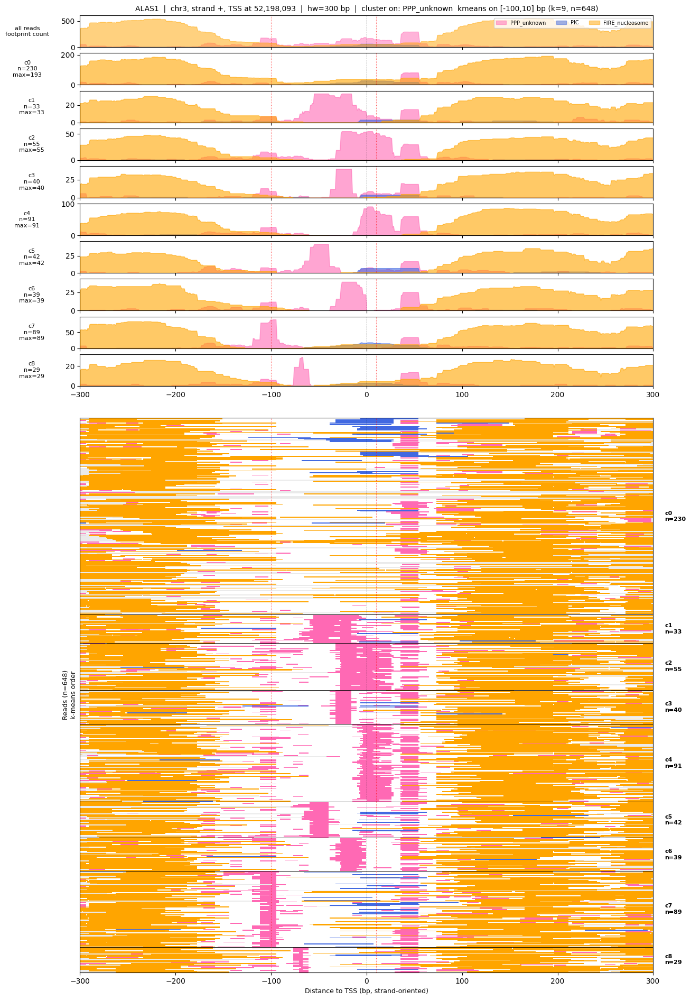

/home/cshan/ipykernel_3161704/1591223002.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/31samples_pooled/ENO1_hw300_tss_proximal_single_PPP_unknown_kmeans_cluster_panels_k9.pdf


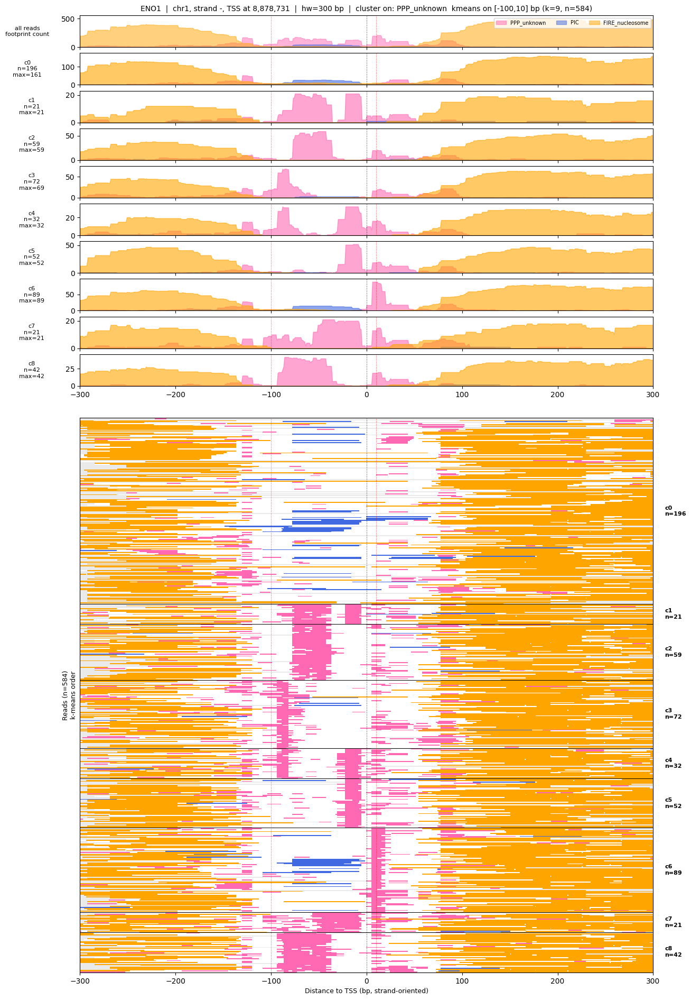

/home/cshan/ipykernel_3161704/1591223002.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/31samples_pooled/ZCWPW1_hw300_tss_proximal_single_PPP_unknown_kmeans_cluster_panels_k9.pdf


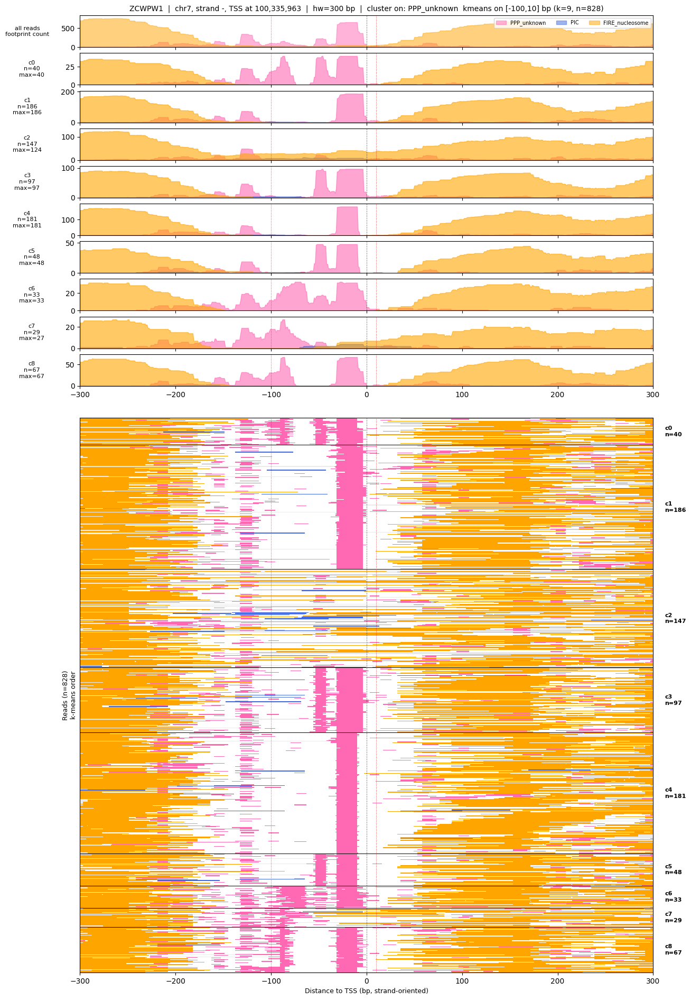

/home/cshan/ipykernel_3161704/1591223002.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/31samples_pooled/ALAS1_hw300_tss_proximal_single_PIC_kmeans_cluster_panels_k9.pdf


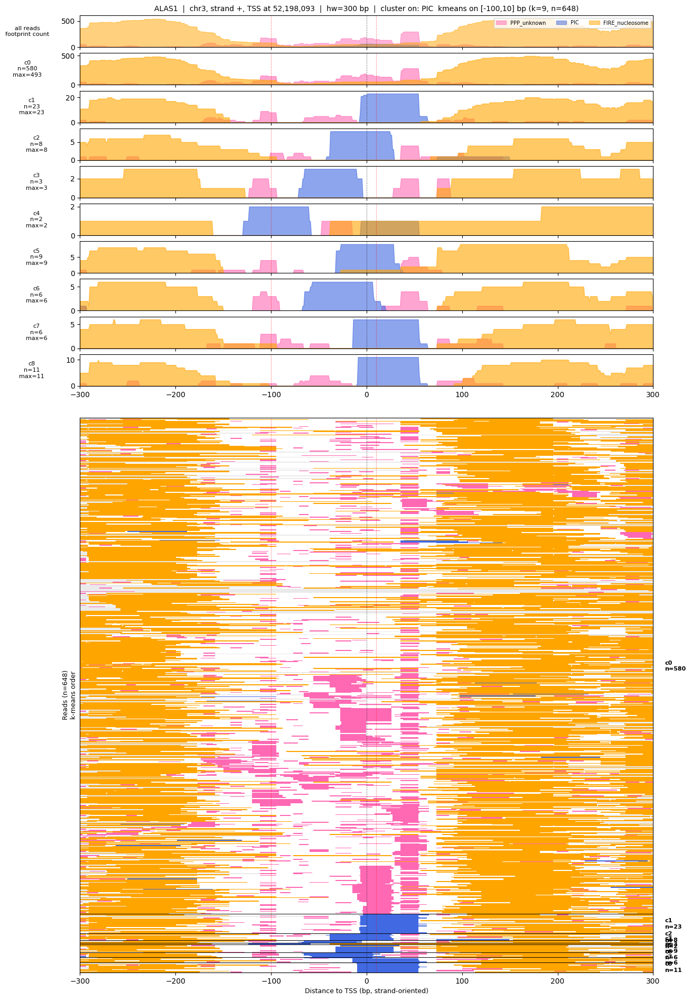

/home/cshan/ipykernel_3161704/1591223002.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/31samples_pooled/ENO1_hw300_tss_proximal_single_PIC_kmeans_cluster_panels_k9.pdf


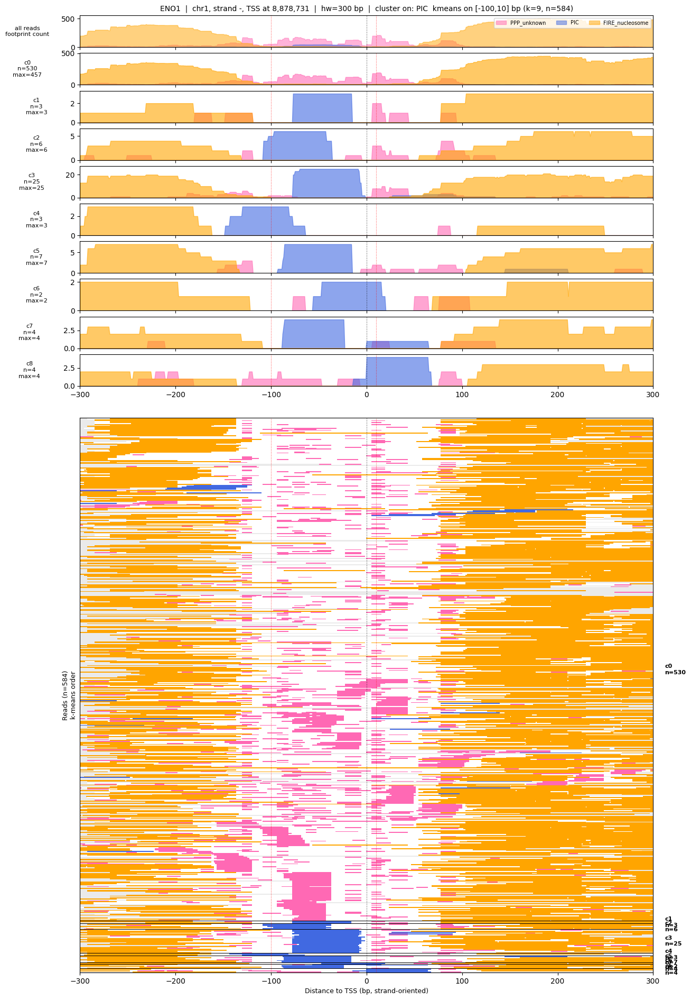

/home/cshan/ipykernel_3161704/1591223002.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/31samples_pooled/ZCWPW1_hw300_tss_proximal_single_PIC_kmeans_cluster_panels_k6.pdf


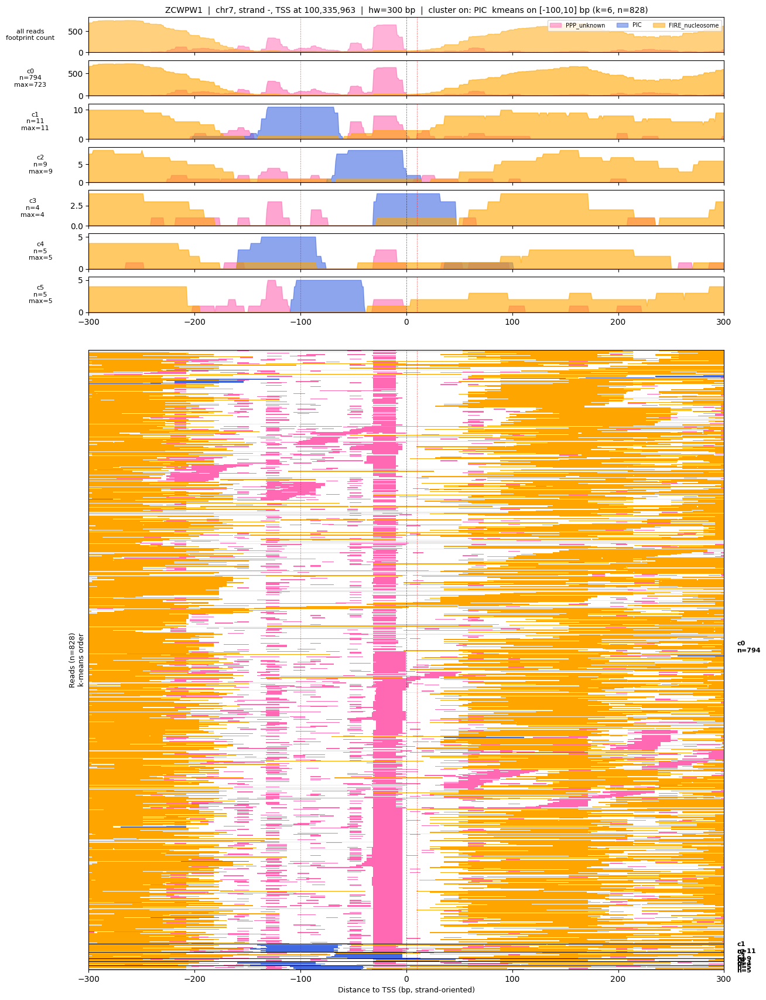

/home/cshan/ipykernel_3161704/1591223002.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/31samples_pooled/ALAS1_hw300_tss_proximal_single_FIRE_nucleosome_kmeans_cluster_panels_k9.pdf


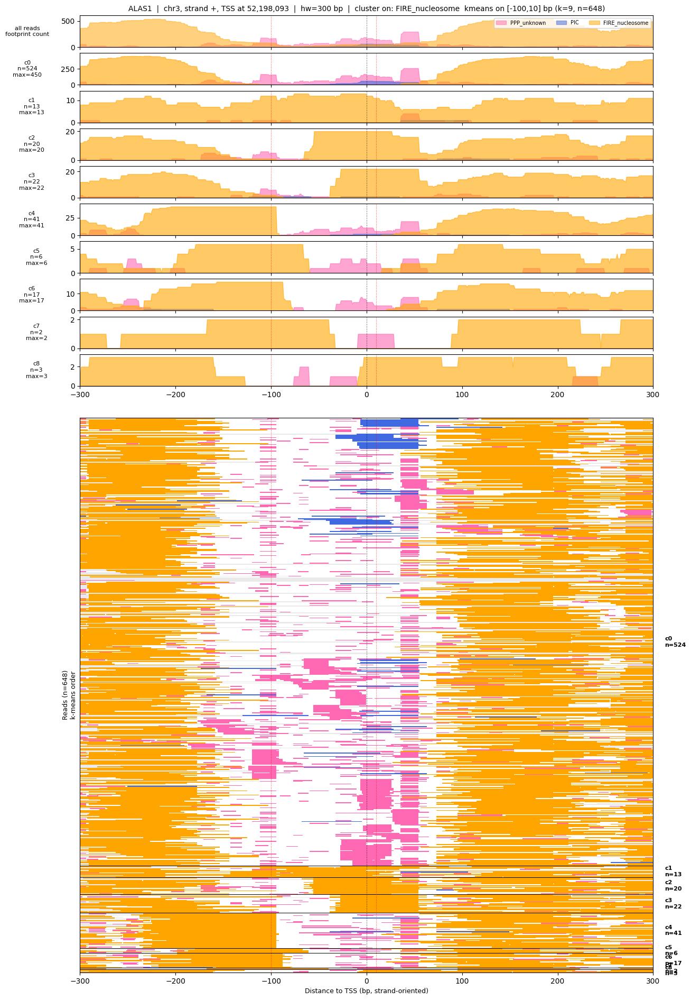

/home/cshan/ipykernel_3161704/1591223002.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/31samples_pooled/ENO1_hw300_tss_proximal_single_FIRE_nucleosome_kmeans_cluster_panels_k8.pdf


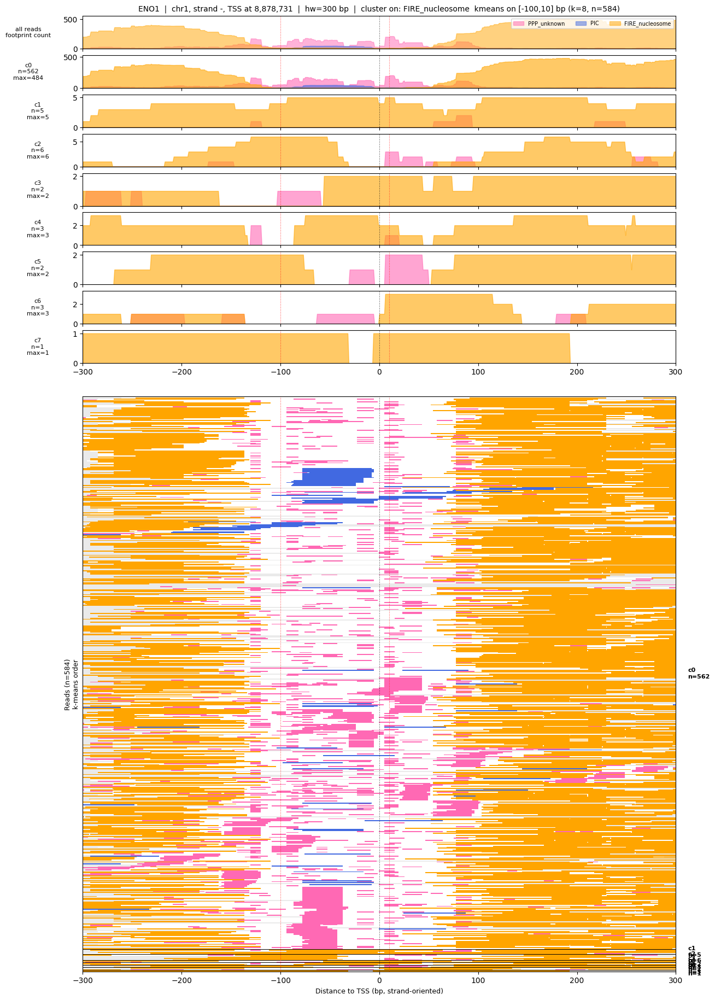

/home/cshan/ipykernel_3161704/1591223002.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


  wrote: /project/spott/cshan/fiber-seq/results/PolII/cluster_reads_by_TSS_proximal/31samples_pooled/ZCWPW1_hw300_tss_proximal_single_FIRE_nucleosome_kmeans_cluster_panels_k9.pdf


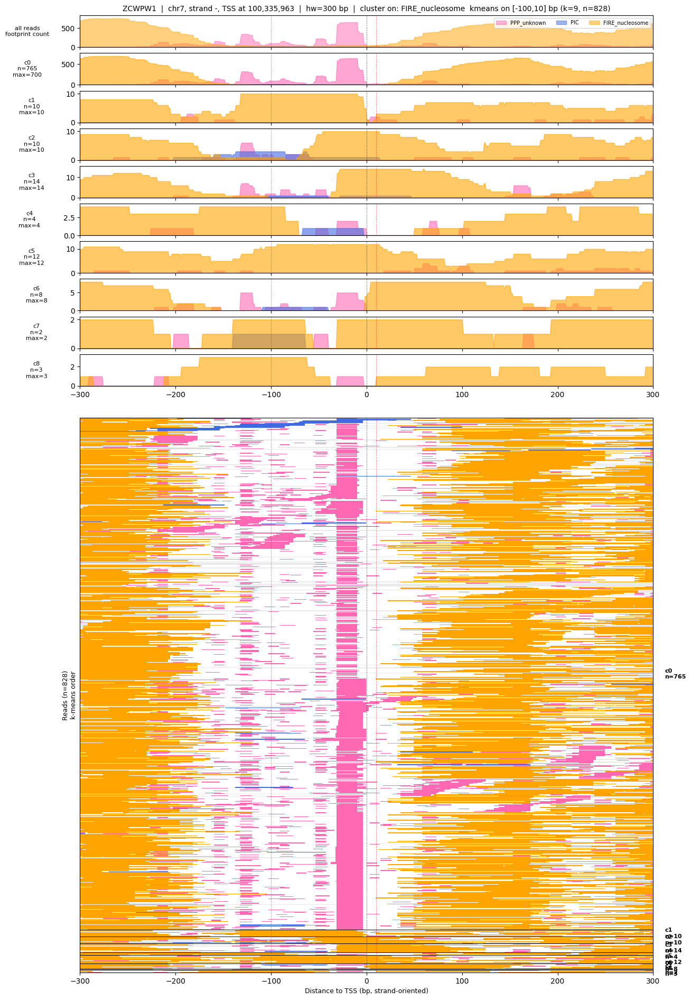

In [28]:
def plot_tss_proximal_single_class_panels(driving_cls, gene_name, res):
    occ        = res["occ"]
    aligned    = res["aligned"]
    classes    = res["classes"]
    chrom      = res["chrom"]
    strand     = res["strand"]
    tss        = res["tss"]
    hw         = res["hw"]
    k          = res["k"]
    labels     = res["labels"]
    leaf_order = res["leaf_order"]
    method     = res["method"]
    n_classes, n_reads, n_pos = occ.shape
    rel_pos    = np.arange(-hw, hw + 1)

    sizes = {c: int((labels == c).sum()) for c in range(k)}
    present_clusters = [c for c in range(k) if sizes[c] > 0]

    profiles = {}
    for cluster_id in range(k):
        cluster_mask = (labels == cluster_id)
        profiles[cluster_id] = {}
        for ci, cls in enumerate(classes):
            if cluster_mask.sum() == 0:
                profiles[cluster_id][cls] = np.zeros(n_pos)
            else:
                profiles[cluster_id][cls] = occ[ci, cluster_mask].sum(axis=0)

    combined = {cls: occ[ci].sum(axis=0) for ci, cls in enumerate(classes)}
    combined_ymax = max((v.max() for v in combined.values()), default=1.0)
    combined_ymax = max(combined_ymax, 1.0)

    order = np.asarray(leaf_order, dtype=int)
    labels_sorted = labels[order]

    img = np.tile(np.array(WHITE_RGB, dtype=np.float32), (n_reads, n_pos, 1))
    img[~aligned] = UNCOVERED_RGB
    for ci, cls in enumerate(classes):
        if cls not in TSS_FP_COLORS:
            continue
        rgb  = np.array(mcolors.to_rgb(TSS_FP_COLORS[cls]), dtype=np.float32)
        mask = occ[ci] > 0
        img[mask] = rgb
    img_sorted = img[order]

    n_top_tracks = len(present_clusters) + 1
    bot_height   = min(14.0, max(3.5, 0.05 * n_reads))
    spacer       = 0.5
    fig_height   = 0.8 * n_top_tracks + bot_height + spacer + 1.0

    fig = plt.figure(figsize=(14, fig_height))
    gs = plt.GridSpec(
        n_top_tracks + 2, 1,
        height_ratios=[0.8] * n_top_tracks + [spacer] + [bot_height],
        hspace=0.08,
    )
    ax_combined = fig.add_subplot(gs[0])
    per_cluster_axes = {
        c: fig.add_subplot(gs[1 + i], sharex=ax_combined)
        for i, c in enumerate(present_clusters)
    }
    ax_bot = fig.add_subplot(gs[n_top_tracks + 1], sharex=ax_combined)
    all_axes = [ax_combined] + list(per_cluster_axes.values()) + [ax_bot]

    for cls in classes:
        if cls not in TSS_FP_COLORS:
            continue
        ax_combined.fill_between(rel_pos, 0, combined[cls],
                                 color=TSS_FP_COLORS[cls], alpha=0.5, label=cls)
    ax_combined.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
    ax_combined.set_xlim(-hw, hw)
    ax_combined.set_ylim(0, combined_ymax * 1.1)
    ax_combined.set_ylabel("all reads\nfootprint count", fontsize=8,
                           rotation=0, labelpad=46, va="center")
    ax_combined.set_title(
        f"{gene_name}  |  {chrom}, strand {strand}, TSS at {tss:,}  |  "
        f"hw={hw} bp  |  cluster on: {driving_cls}  "
        f"{method} on [{CLUSTER_REL_START},{CLUSTER_REL_END}] bp (k={k}, n={n_reads})",
        fontsize=10,
    )
    ax_combined.legend(loc="upper right", fontsize=7, ncol=min(n_classes, 5))
    plt.setp(ax_combined.get_xticklabels(), visible=False)

    last_idx = len(present_clusters) - 1
    for i, cluster_id in enumerate(present_clusters):
        ax = per_cluster_axes[cluster_id]
        for cls in classes:
            if cls not in TSS_FP_COLORS:
                continue
            ax.fill_between(rel_pos, 0, profiles[cluster_id][cls],
                            color=TSS_FP_COLORS[cls], alpha=0.6)
        ax.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
        ax.set_xlim(-hw, hw)
        cluster_ymax = max(
            (profiles[cluster_id][cls].max() for cls in classes if cls in TSS_FP_COLORS),
            default=1.0,
        )
        cluster_ymax = max(cluster_ymax, 1.0)
        ax.set_ylim(0, cluster_ymax * 1.1)
        ax.set_ylabel(
            f"c{cluster_id}\nn={sizes[cluster_id]}\nmax={int(cluster_ymax)}",
            fontsize=8, rotation=0, labelpad=46, va="center",
        )
        if i < last_idx:
            plt.setp(ax.get_xticklabels(), visible=False)

    ax_bot.imshow(img_sorted, aspect="auto", interpolation="nearest",
                  extent=[-hw - 0.5, hw + 0.5, n_reads, 0])
    ax_bot.axvline(0, color="black", lw=0.6, ls="--", alpha=0.5)
    boundaries = np.where(np.diff(labels_sorted) != 0)[0] + 1
    for b in boundaries:
        ax_bot.axhline(b - 0.5, color="black", lw=0.7)
    label_x = hw + (2 * hw) * 0.02
    for c in present_clusters:
        idx = np.where(labels_sorted == c)[0]
        if len(idx):
            ax_bot.text(label_x, (idx.min() + idx.max()) / 2,
                        f"c{c}\nn={sizes[c]}", fontsize=8, va="center",
                        color="black", fontweight="bold")

    for ax in all_axes:
        ax.axvline(CLUSTER_REL_START, color="red", lw=0.8, ls=":", alpha=0.7)
        ax.axvline(CLUSTER_REL_END, color="red", lw=0.8, ls=":", alpha=0.7)

    ax_bot.set_xlim(-hw, hw)
    ax_bot.set_ylim(n_reads, -1)
    ax_bot.set_yticks([])
    order_label = "Ward leaf order" if method == "ward" else "k-means order"
    ax_bot.set_ylabel(f"Reads (n={n_reads})\n{order_label}", fontsize=9)
    ax_bot.set_xlabel("Distance to TSS (bp, strand-oriented)", fontsize=9)

    plt.tight_layout()
    tag = driving_cls.replace(" ", "_").replace("(", "").replace(")", "")
    out_pdf = TSS_OUT_ROOT / f"{gene_name}_hw{hw}_tss_proximal_single_{tag}_{method}_cluster_panels_k{k}.pdf"
    fig.savefig(out_pdf, bbox_inches="tight")
    print(f"  wrote: {out_pdf}")
    plt.show()


for (driving_cls, gene_name), res in tss_sc_cluster_results.items():
    plot_tss_proximal_single_class_panels(driving_cls, gene_name, res)